In [1]:
# Washington Multiple AGN (WMAGN) Catalog DR1
# Author: R. W. Pfeifle
# Date Created: 10 Sept. 2020
# Last Revision Date: 2 Oct. 2020

# Purpose:
# 
# 

Update 16 Sept. 2020
---


Here is how I want to construct the catalog now and moving forward:

- There will be TWO catalogs, which are permutations of a single list. 
    - One catalog will have only one system per line, and we will have ONLY pairs in this one. This will make calculations FAR easier for individual systems (such as redshift or velocity differences), as this circumvents the problems of not being able to do row-wise operations.
    - The other catalog will be a copy of the first, with the exception that this catalog will have one line per system component, i.e. two lines per pair. This will be the catalog used for matching to other catalogs. Thus this one is a derivative of the first.
    - This same setup will be used for systems of triples, quadruples, quintuples, etc. Different order multiplets will be in different catalogs. This will make things easier to comprehend and will eliminate needed a million columns within only a single table that are empty for any system with fewer than the max number. 


--------
Summary:
--------
The purpose of this catalog is to have an exhaustive list of all known multiple
AGNs from the literature. A multiple AGN is defined as the manifestation of two
or more AGNs at some wavelength that are associated with each other due to some
astrophysical process. This astrophysical process can be:

- Multiple AGNs in a galaxy interaction, merger, or post-merger
- Multiple AGNs that are gravitationally bound, e.g. binary AGNs
- The appearance of multiple AGNs due to gravitational lensing (e.g. an Einstein cross)

This catalog should be *exhaustive*, so include not only confirmed systems but
also candidate systems. These systems should be everything that indicates or
potentially indicates the presence or apparent presence of more than one AGN
associated with a system (e.g. multiple X-ray/radio component, doubling of
spectroscopic lines, astrometric jitter, etc.)

----------------------
WMAGN catalog columns:
----------------------

- System type (Dual/triple AGN, binary AGN, or gravitational lens)

- Discovery method (e.g., multiple X-ray/radio components, spectroscopic, astrometric, etc.)

- Literature name (e.g. SDSS J084905.51+111447.2)

- Component (e.g. Gal1/Gal2/Gal3, a/b/c, 1/2/3, etc)
- One row for each component; components share same unique system name

- Unique, standardized system name
    - NED, Simbad, or IAU name preferred

- Coordinates
    - Must be in ICRS system. If listed in FK5/FK6, convert to ICRS (e.g. with AstroPy)
    - Equinox J2000.0
    - Native epoch (i.e. not corrected for "proper motion")
    - Degrees, full precision (i.e. 0.00001 deg = 0.036 arcsec)
    - If coordinates not available for each component individually, just repeat the listed system coordinates for each source.

- Coordinate epoch (e.g. 2015.5 for Gaia DR2)
    - Leave blank if not determinable

- Coordinate wavelength/frequency
    - Leave blank if not determinable

- Coordinate source (e.g. SDSS, 2MASS, VLBA, Chandra, etc)

- Redshift
    - Leave blank if not determinable

- Redshift type (spec/photo)
    - Leave blank if not determinable

- Brightness band
    - E.g., Johnson V, SDSS r, Gaia G, WISE W1, radio X-band, etc.

- Brightness numerical value
    - Magnitude or flux density

- Brightness type
    - E.g., VEGAMAG, ABMAG/STMAG, Jy

- Bibcode(s), e.g. 2019ApJ...883..167P,2019ApJ...887...90L
    - Ordered by date

- NED hyperlink

- Simbad hyperlink

- Confidence level
    - Up to you how you want to qualify this. E.g., "potential", "likely", "confirmed"
    - Preferably numeric so catalog can be sorted. E.g. 1=potential, 2=likely, 3=confirmed.

- Essential object notes


In [2]:
# Load in packages for pandas, astropy, etc. 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.table import Table
from astropy.io import ascii
from astropy.table import Column, MaskedColumn
from astropy.io.ascii import masked
from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.cosmology import LambdaCDM 
#from astroquery.simbad import Simbad
#from astroquery.sdss import SDSS

cosmo = LambdaCDM(H0=70, Om0=0.3, Ode0=0.7) #Creating our choice of cosmology here...

pd.set_option('display.max_columns', 300) # Setting max number of rows per df to be the size of the df
pd.set_option('display.max_rows', None)

In [3]:
# This function is for converting namings in the following format to coordinates. This is useful for later \
# catalogs 2010-2020

def name_to_coords(df,dfcol):
    # A function to take in the SDSS designation in a form JXXXXXX.XX+XXXXXX.X and convert this to sexagesimal coordinates, where the '+' could be '+' or '-'.
    # Output form will be: XX:XX:XX.XX +XX:XX:XX.X, where the '+' could be '+' or '-'
    df['Coordinates'] = dfcol.str.slice(start=1) # Stripping the J
    df['RA_test'] = df['Coordinates'].str.slice(start=0, stop=9) # Stripping the DEC parts 
    df['Dec_test'] = df['Coordinates'].str.slice(start=9, stop=19) # Stripping the RA parts
    df['RA'] = df['RA_test'].str.slice(start=0, stop=2)+":"+df['RA_test'].str.slice(start=2, stop=4)+":"+df['RA_test'].str.slice(start=4, stop=9) # Putting together the RA coordinates separated by colons
    df['Dec'] = df['Dec_test'].str.slice(start=0, stop=3)+":"+df['Dec_test'].str.slice(start=3, stop=5)+":"+df['Dec_test'].str.slice(start=5, stop=10) # Putting together the Dec coodinates separated by colons
    df.drop(columns=['Coordinates','RA_test','Dec_test'], inplace=True)
    return


In [6]:
def name_to_coords(df):
    # A function to take in the SDSS designation in a form JXXXXXX.XX+XXXXXX.X and convert this to sexagesimal coordinates, where the '+' could be '+' or '-'.
    # Output form will be: XX:XX:XX.XX +XX:XX:XX.X, where the '+' could be '+' or '-'
    df['Coordinates'] = df['SDSS'].str.slice(start=1) # Stripping the J
    df['RA_test'] = df['Coordinates'].str.slice(start=0, stop=9) # Stripping the DEC parts 
    df['Dec_test'] = df['Coordinates'].str.slice(start=9, stop=19) # Stripping the RA parts
    df['RA'] = df['RA_test'].str.slice(start=0, stop=2)+":"+df['RA_test'].str.slice(start=2, stop=4)+":"+df['RA_test'].str.slice(start=4, stop=9) # Putting together the RA coordinates separated by colons
    df['Dec'] = df['Dec_test'].str.slice(start=0, stop=3)+":"+df['Dec_test'].str.slice(start=3, stop=5)+":"+df['Dec_test'].str.slice(start=5, stop=10) # Putting together the Dec coodinates separated by colons
    df.drop(columns=['Coordinates','RA_test','Dec_test'], inplace=True)
    return


In [7]:
xliu2011 = (Table.read('XLiu2011b/table1.dat', readme = 'XLiu2011b/ReadMe', format='ascii.cds')).to_pandas()



name_to_coords(xliu2011)


In [8]:
xliu2011


,SDSS,Plate,Fiber,MJD,z,sep,rp,dV,rmag,FAGN,FTid,RA,Dec
0,J000249.07+004504.8,388,345,51793,0.0868,5.9,9.5,63,16.08,0,3,00:02:49.07,+00:45:04.8
1,J000249.44+004506.7,685,593,52203,0.0865,5.9,9.5,63,16.43,1,3,00:02:49.44,+00:45:06.7
2,J000257.21+000750.5,685,531,52203,0.0901,45.4,76.0,109,16.15,2,2,00:02:57.21,+00:07:50.5
3,J000258.59+000831.0,387,72,51791,0.0897,45.4,76.0,109,16.67,2,2,00:02:58.59,+00:08:31.0
4,J000323.74+010547.3,1490,321,52994,0.0993,12.2,22.4,22,17.98,2,2,00:03:23.74,+01:05:47.3
5,J000323.74+010559.5,387,620,51791,0.0994,12.2,22.4,22,17.42,2,2,00:03:23.74,+01:05:59.5
6,J000425.78-095854.4,650,598,52143,0.1122,24.1,49.1,53,16.41,0,2,00:04:25.78,-09:58:54.4
7,J000426.66-095834.4,651,392,52141,0.1120,24.1,49.1,53,16.57,2,2,00:04:26.66,-09:58:34.4
8,J000431.92-011411.7,388,282,51793,0.0887,42.3,70.1,45,17.22,0,0,00:04:31.92,-01:14:11.7
9,J000433.25-011334.4,1490,241,52994,0.0889,42.3,70.1,45,18.47,2,0,00:04:33.25,-01:13:34.4


In [3]:
xliu2011 = (Table.read('XLiu2011b/table1.dat', readme = 'XLiu2011b/ReadMe', format='ascii.cds')).to_pandas()

#wang2009['Name2'] = wang2009['Name']
#wang2009['z2'] = wang2009['z']
#wang2009['z1_type'] = "spec"
#wang2009['z2_type'] = "spec"

name_to_coords(xliu2011,xliu2011['SDSS'])



xliu2011

,SDSS,Plate,Fiber,MJD,z,sep,rp,dV,rmag,FAGN,FTid,RA,Dec
0,J000249.07+004504.8,388,345,51793,0.0868,5.9,9.5,63,16.08,0,3,00:02:49.07,+00:45:04.8
1,J000249.44+004506.7,685,593,52203,0.0865,5.9,9.5,63,16.43,1,3,00:02:49.44,+00:45:06.7
2,J000257.21+000750.5,685,531,52203,0.0901,45.4,76.0,109,16.15,2,2,00:02:57.21,+00:07:50.5
3,J000258.59+000831.0,387,72,51791,0.0897,45.4,76.0,109,16.67,2,2,00:02:58.59,+00:08:31.0
4,J000323.74+010547.3,1490,321,52994,0.0993,12.2,22.4,22,17.98,2,2,00:03:23.74,+01:05:47.3
5,J000323.74+010559.5,387,620,51791,0.0994,12.2,22.4,22,17.42,2,2,00:03:23.74,+01:05:59.5
6,J000425.78-095854.4,650,598,52143,0.1122,24.1,49.1,53,16.41,0,2,00:04:25.78,-09:58:54.4
7,J000426.66-095834.4,651,392,52141,0.1120,24.1,49.1,53,16.57,2,2,00:04:26.66,-09:58:34.4
8,J000431.92-011411.7,388,282,51793,0.0887,42.3,70.1,45,17.22,0,0,00:04:31.92,-01:14:11.7
9,J000433.25-011334.4,1490,241,52994,0.0889,42.3,70.1,45,18.47,2,0,00:04:33.25,-01:13:34.4


In [8]:
xliu2011cut = xliu2011[xliu2011['sep']>=6]

liu_forwise = xliu2011cut[['SDSS', 'RA_deg', 'Dec_deg']].copy()
liu_forwise.rename(index=str, columns={"SDSS": "objid", "RA_deg": "ra", "Dec_deg": "dec"}, inplace=True) 

t1 = Table.from_pandas(liu_forwise)
ascii.write(t1, 'liu_forwise.dat', format = 'ipac', overwrite = True)


In [109]:
xliu2011.to_csv('xliu2011_catalog.csv', sep=',', index=False)

In [112]:
grouped = xliu2011.groupby(by=['sep','rp','dV'])

In [17]:
#grouped.groups

In [115]:
len(grouped)

1334

In [4]:
xliu2011['GroupID'] = xliu2011.groupby(by=['sep','rp','dV']).ngroup().add(1)
xliu2011['GroupNum'] = xliu2011.groupby(by=['GroupID'])['GroupID'].transform('count')

In [5]:
xliu2011

,SDSS,Plate,Fiber,MJD,z,sep,rp,dV,rmag,FAGN,FTid,RA,Dec,GroupID,GroupNum
0,J000249.07+004504.8,388,345,51793,0.0868,5.9,9.5,63,16.08,0,3,00:02:49.07,+00:45:04.8,92,2
1,J000249.44+004506.7,685,593,52203,0.0865,5.9,9.5,63,16.43,1,3,00:02:49.44,+00:45:06.7,92,2
2,J000257.21+000750.5,685,531,52203,0.0901,45.4,76.0,109,16.15,2,2,00:02:57.21,+00:07:50.5,558,2
3,J000258.59+000831.0,387,72,51791,0.0897,45.4,76.0,109,16.67,2,2,00:02:58.59,+00:08:31.0,558,2
4,J000323.74+010547.3,1490,321,52994,0.0993,12.2,22.4,22,17.98,2,2,00:03:23.74,+01:05:47.3,189,2
5,J000323.74+010559.5,387,620,51791,0.0994,12.2,22.4,22,17.42,2,2,00:03:23.74,+01:05:59.5,189,2
6,J000425.78-095854.4,650,598,52143,0.1122,24.1,49.1,53,16.41,0,2,00:04:25.78,-09:58:54.4,321,2
7,J000426.66-095834.4,651,392,52141,0.1120,24.1,49.1,53,16.57,2,2,00:04:26.66,-09:58:34.4,321,2
8,J000431.92-011411.7,388,282,51793,0.0887,42.3,70.1,45,17.22,0,0,00:04:31.92,-01:14:11.7,523,2
9,J000433.25-011334.4,1490,241,52994,0.0889,42.3,70.1,45,18.47,2,0,00:04:33.25,-01:13:34.4,523,2


In [6]:
multis = xliu2011[xliu2011['GroupNum']!=2]
multis

,SDSS,Plate,Fiber,MJD,z,sep,rp,dV,rmag,FAGN,FTid,RA,Dec,GroupID,GroupNum
146,J024035.65-083249.6,455,74,51909,0.0375,1.7,1.3,69,14.30,1,1,02:40:35.65,-08:32:49.6,2,1
147,J024037.96-083200.1,455,72,51909,0.0387,60.5,45.0,337,13.82,1,1,02:40:37.96,-08:32:00.1,745,1
230,J075925.27+375216.0,544,82,52201,0.0408,123.1,98.6,74,16.16,2,0,07:59:25.27,+37:52:16.0,1206,1
314,J082847.93+122832.0,2424,406,54448,0.0677,69.5,90.1,114,16.52,1,0,08:28:47.93,+12:28:32.0,890,1
414,J085931.39+173253.6,2283,50,53729,0.0499,76.1,72.0,468,15.91,1,0,08:59:31.39,+17:32:53.6,962,1
440,J090520.84+075440.1,1300,168,52973,0.0616,82.5,98.0,255,16.36,2,0,09:05:20.84,+07:54:40.1,1021,1
640,J095859.91+130308.4,1744,331,53055,0.0358,69.5,49.2,48,14.70,5,0,09:58:59.91,+13:03:08.4,887,1
645,J095906.68+130135.4,1744,332,53055,0.0366,68.3,48.4,290,15.38,0,0,09:59:06.68,+13:01:35.4,870,1
646,J095908.96+130352.5,2584,84,54153,0.0339,124.9,88.5,492,14.94,0,0,09:59:08.96,+13:03:52.5,1216,1
652,J095947.21+261711.4,2344,458,53740,0.0515,95.5,96.0,26,15.72,0,0,09:59:47.21,+26:17:11.4,1097,1


In [ ]:
# Converting now the sexagesimal coordinates to degrees...
#coordconvert = SkyCoord(ra = kirkman2008_master['RA1'], dec = kirkman2008_master['Dec1'], frame='icrs', unit = (u.hourangle, u.deg))
#
#kirkman2008_master['RA1_deg'] = coordconvert.ra.degree
#kirkman2008_master['Dec1_deg'] = coordconvert.dec.degree
#
##coordconvert = SkyCoord(ra = kirkman2008_master['RA2'], dec = kirkman2008_master['Dec2'], frame='icrs', unit = (u.hourangle, u.deg))
##
##kirkman2008_master['RA2_deg'] = coordconvert.ra.degree
#kirkman2008_master['Dec2_deg'] = coordconvert.dec.degree



In [4]:
# Converting now the sexagesimal coordinates to degrees...
coordconvert = SkyCoord(ra = xliu2011['RA'], dec = xliu2011['Dec'], frame='icrs', unit = (u.hourangle, u.deg))

xliu2011['RA_deg'] = coordconvert.ra.degree
xliu2011['Dec_deg'] = coordconvert.dec.degree

#coordconvert = SkyCoord(ra = multis['RA'], dec = multis['Dec'], frame='icrs', unit = (u.hourangle, u.deg))
#
#multis['RA_deg'] = coordconvert.ra.degree
#multis['Dec_deg'] = coordconvert.dec.degree


In [10]:
multis

,SDSS,Plate,Fiber,MJD,z,sep,rp,dV,rmag,FAGN,FTid,RA,Dec,GroupID,GroupNum,RA_deg,Dec_deg
146,J024035.65-083249.6,455,74,51909,0.0375,1.7,1.3,69,14.30,1,1,02:40:35.65,-08:32:49.6,2,1,40.148542,-8.547111
147,J024037.96-083200.1,455,72,51909,0.0387,60.5,45.0,337,13.82,1,1,02:40:37.96,-08:32:00.1,745,1,40.158167,-8.533361
230,J075925.27+375216.0,544,82,52201,0.0408,123.1,98.6,74,16.16,2,0,07:59:25.27,+37:52:16.0,1206,1,119.855292,37.871111
314,J082847.93+122832.0,2424,406,54448,0.0677,69.5,90.1,114,16.52,1,0,08:28:47.93,+12:28:32.0,890,1,127.199708,12.475556
414,J085931.39+173253.6,2283,50,53729,0.0499,76.1,72.0,468,15.91,1,0,08:59:31.39,+17:32:53.6,962,1,134.880792,17.548222
440,J090520.84+075440.1,1300,168,52973,0.0616,82.5,98.0,255,16.36,2,0,09:05:20.84,+07:54:40.1,1021,1,136.336833,7.911139
640,J095859.91+130308.4,1744,331,53055,0.0358,69.5,49.2,48,14.70,5,0,09:58:59.91,+13:03:08.4,887,1,149.749625,13.052333
645,J095906.68+130135.4,1744,332,53055,0.0366,68.3,48.4,290,15.38,0,0,09:59:06.68,+13:01:35.4,870,1,149.777833,13.026500
646,J095908.96+130352.5,2584,84,54153,0.0339,124.9,88.5,492,14.94,0,0,09:59:08.96,+13:03:52.5,1216,1,149.787333,13.064583
652,J095947.21+261711.4,2344,458,53740,0.0515,95.5,96.0,26,15.72,0,0,09:59:47.21,+26:17:11.4,1097,1,149.946708,26.286500


In [15]:
# Now we're going to work on matching the catalogs of Kirman+2008 and comps+2009 to remove duplicate entries

#liu = SkyCoord(ra=xliu2011['RA_deg']*u.degree, dec=xliu2011['Dec_deg']*u.degree) # Storing the coordinates from liuman+2008
#comps = SkyCoord(ra=multis['RA_deg']*u.degree, dec=multis['Dec_deg']*u.degree) # Storing the coordinates from comps+2009
#idx, d2d, d3d = liu.match_to_catalog_sky(comps)   # Now matching the liuman+2008 catalog to comps+2009 catalog
## idx are the indices in the companion catalog which are the closest matching rows to the liu catalog

#max_sep = multis['sep'] * u.arcsec # The max match tolerance will be 5''
#sep_constraint = d2d == max_sep # Filtering the angular separations from the matches to ≤ 5''
#liu_matches = liu[sep_constraint] # Applying the filter to matches in the liuman catalog
#catalog_matches = comps[idx[sep_constraint]] # Applying the filter to matches in the comps catalog
#
#comps_matchesRA1 = pd.DataFrame() # Creating an empty dataframe to store the indices and coordinates of the matches in the comps catalog
#comps_matchesRA1['idx'] = idx[sep_constraint] # Storing the indices
#comps_matchesRA1['RA'] = catalog_matches.ra.degree # Storing the coordinates in these two rows
#comps_matchesRA1['Dec'] = catalog_matches.dec.degree

## Now, since we're not sure if the components have been mixed up between the two catalogs, we need to rematch \
## the liu RA and Dec to the comps RA and Dec
#
#liu = SkyCoord(ra=xliu2011['RA_deg']*u.degree, dec=xliu2011['Dec_deg']*u.degree) # Storing the coordinates from liuman+2008
#comps = SkyCoord(ra=multis['RA_deg']*u.degree, dec=multis['Dec_deg']*u.degree) # Storing the coordinates from comps+2009
#idx, d2d, d3d = liu.match_to_catalog_sky(comps)   # Now matching the liu pairs to liu companions
## idx are the indices in the companion catalog which are the closest matching rows to the liu catalog
#
#max_sep = multis['sep'] * u.arcsec # The max match tolerance will be 5''
#sep_constraint = d2d <= max_sep # Filtering the angular separations from the matches to ≤ 5''
#liu_matches = liu[sep_constraint] # Applying the filter to matches in the liuman catalog
#catalog_matches = comps[idx[sep_constraint]] # Applying the filter to matches in the companion catalog
#
#comps_matchesRA2 = pd.DataFrame() # Creating an empty dataframe to store the indices and coordinates of the matches in the comps catalog
#comps_matchesRA2['idx'] = idx[sep_constraint] # Storing the indices
#comps_matchesRA2['RA'] = catalog_matches.ra.degree # Storing the coordinates in these two rows
#comps_matchesRA2['Dec'] = catalog_matches.dec.degree
#
## Now we'll concatenate these two dataframes and use the resultant table to remove the matched indices from the \
## companion catalog.
#
#frames = [comps_matchesRA1,comps_matchesRA2] 
#comps_duplicates = (pd.concat(frames)).reset_index(drop=True) #Concatenating them here...
#
## There's a total of 21 matches between the two catalogs...
#
## Now removing from the comps+2009 catalog the sources that also appear in the liuman+2008 catalog by removing \
## the indices listed in the comps_duplicates table
#comps = (multis[~multis['index'].isin(comps_duplicates['idx'])]).reset_index(drop=True)
#
##print(xliu2011.columns)
##print(comps2009_master.columns)
#

In [16]:
#idx

array([49, 49, 49, ..., 49, 49, 49])

In [43]:
z1=0.08092
z2=0.09821

(2.99e+5)*((1+z1)**2 - (1+z2)**2)/((1+z1)**2+(1+z2)**2)



-4744.448074489407

#### 

In [4]:
def name_to_coords(df,dfcol):
    # A function to take in the SDSS designation in a form JXXXXXX+XXXXXX and convert this to sexagesimal coordinates, where the '+' could be '+' or '-'.
    # Output form will be: XX:XX:XX +XX:XX:XX, where the '+' could be '+' or '-'
    df['Coordinates'] = dfcol.str.slice(start=1) # Stripping the J
    df['RA_test'] = df['Coordinates'].str.slice(start=0, stop=6) # Stripping the DEC parts 
    df['Dec_test'] = df['Coordinates'].str.slice(start=6, stop=13) # Stripping the RA parts
    df['RA'] = df['RA_test'].str.slice(start=0, stop=2)+":"+df['RA_test'].str.slice(start=2, stop=4)+":"+df['RA_test'].str.slice(start=4, stop=6) # Putting together the RA coordinates separated by colons
    df['Dec'] = df['Dec_test'].str.slice(start=0, stop=3)+":"+df['Dec_test'].str.slice(start=3, stop=5)+":"+df['Dec_test'].str.slice(start=5, stop=8) # Putting together the Dec coodinates separated by colons
    df.drop(columns=['Coordinates','RA_test','Dec_test'], inplace=True)
    return

In [5]:
# Here we're loading in the double-peaked emission line galaxy catalog of Wang+2009

wang2009 = ((Table.read('Wang2009/table1.dat', readme = 'Wang2009/ReadMe', format='ascii.cds')).to_pandas()).drop(columns=['---'])
# table1.dat is a modified version of Wang's catalog in which I've added a duplicate row for each target
# since all of these are candidate dual AGN systems

# Since the format of the catalog will require names for both components, we'll add in a column 'Name2' which for \
# these and similar targets will be duplicates of the first 'Name column'. Same goes for z2, etc. 

wang2009['Name2'] = wang2009['Name']
wang2009['z2'] = wang2009['z']
wang2009['z1_type'] = "spec"
wang2009['z2_type'] = "spec"

# Now converting the naming convention to RA and Dec and adding some informative columns
name_to_coords(wang2009,wang2009['Name'])

# Converting the coordinates
coordconvert = SkyCoord(ra = wang2009['RA'], dec = wang2009['Dec'], frame='icrs', unit = (u.hourangle, u.deg))
wang2009['RA_deg'] = coordconvert.ra.degree
wang2009['Dec_deg'] = coordconvert.dec.degree

# Adding in a second set of coordinates for the 'secondary'
wang2009['RA2'] = wang2009['RA']
wang2009['Dec2'] = wang2009['Dec']

wang2009['RA2_deg'] = wang2009['RA_deg']
wang2009['Dec2_deg'] = wang2009['Dec_deg']

# Adding details about the coordinates
wang2009['Equinox'] = "J2000"
wang2009['Coordinate_waveband'] = "Optical"
wang2009['Coordinate_Source'] = "SDSS"

wang2009['System Type'] = 'Dual AGN Candidate'

# Adding in some columns that we'll population via a Simbad or Ned search later
wang2009['Brightness1'] = -100
wang2009['Brightness_band1'] = -100
wang2009['Brightness_type1'] = -100

wang2009['Brightness2'] = -100
wang2009['Brightness_band2'] = -100
wang2009['Brightness_type2'] = -100

# Adding in a column to denote the system separation as '-1' which I will take in this case to mean that it is \
# of order ~1 kpc or less, but is not currently determined.
wang2009['Sep'] = 3 # arcseconds
# Since these are candidates and we do not have a measure of separation, we'll use the 3'' diameter of the SDSS \
# fiber as an upper limit
wang2009['Sep(kpc)'] = wang2009['Sep']*((cosmo.arcsec_per_kpc_proper(wang2009['z']))**(-1))
# For the projected separation, we'll use the upper limit of 3'' to calculate an upper limit in units of kpc
wang2009['delta_z'] = wang2009['z']-wang2009['z2']
wang2009['dV'] = (2.99e+5)*((1+wang2009['z'])**2 - (1+wang2009['z2'])**2)/((1+wang2009['z'])**2+(1+wang2009['z2'])**2)
# dV will be zero until we include follow-up observations that show separate redshifts

# Adding information about the paper and the selection method
wang2009['Selection Method'] = "Double-Peaked Optical Spectroscopic Emission Lines" #DPSELs
wang2009['Confirmation Method'] = "-99"
wang2009['Paper(s)'] = "Wang+2009"
wang2009['BibCode(s)'] = "2009ApJ...705L..76W"
wang2009['DOI(s)'] = "https://doi.org/10.1088/0004-637X/705/1/L76"

# And dropping any columns that we don't need....
wang2009.drop(labels=['e_z','Del1','e_Del1','Del2','e_Del2','FOIII1','e_FOIII1','FOIII2','e_FOIII2','D'],\
              axis=1, inplace=True)

# Rearranging the columns and renaming columns now...
wang2009 = wang2009[['System Type','Name','Name2','Selection Method','Confirmation Method','z','z1_type','z2',\
                    'z2_type','RA', 'Dec', 'RA_deg','Dec_deg','RA2','Dec2','RA2_deg','Dec2_deg',\
                    'Equinox','Coordinate_waveband','Coordinate_Source','Brightness1','Brightness_band1',\
                    'Brightness_type1','Brightness2','Brightness_band2','Brightness_type2','Sep','Sep(kpc)',\
                    'delta_z','dV','Paper(s)','BibCode(s)','DOI(s)']]
wang2009.columns=['System Type','Name1','Name2','Selection Method','Confirmation Method','z1','z1_type','z2',\
                    'z2_type','RA1', 'Dec1', 'RA1_deg','Dec1_deg','RA2','Dec2','RA2_deg','Dec2_deg',\
                    'Equinox','Coordinate_waveband','Coordinate_Source','Brightness1','Brightness_band1',\
                    'Brightness_type1','Brightness2','Brightness_band2','Brightness_type2','Sep','Sep(kpc)',\
                    'delta_z','dV','Paper(s)','BibCode(s)','DOI(s)']


AttributeError: 'Series' object has no attribute 'to'

In [5]:
#print(wang2009.columns)

In [6]:
wang2009

,System Type,Name1,Name2,Selection Method,Confirmation Method,z1,z1_type,z2,z2_type,RA1,Dec1,RA1_deg,Dec1_deg,RA2,Dec2,RA2_deg,Dec2_deg,Equinox,Coordinate_waveband,Coordinate_Source,Brightness1,Brightness_band1,Brightness_type1,Brightness2,Brightness_band2,Brightness_type2,Sep,Sep(kpc),delta_z,dV,Paper(s),BibCode(s),DOI(s)
0,Dual AGN Candidate,J000249+004504,J000249+004504,Double-Peaked Optical Spectroscopic Emission L...,-99,0.08662,spec,0.08662,spec,00:02:49,+00:45:04,0.704167,0.751111,00:02:49,+00:45:04,0.704167,0.751111,J2000,Optical,SDSS,-100,-100,-100,-100,-100,-100,3,4.867052,0.0,0.0,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
1,Dual AGN Candidate,J000656+154847,J000656+154847,Double-Peaked Optical Spectroscopic Emission L...,-99,0.12515,spec,0.12515,spec,00:06:56,+15:48:47,1.733333,15.813056,00:06:56,+15:48:47,1.733333,15.813056,J2000,Optical,SDSS,-100,-100,-100,-100,-100,-100,3,6.728888,0.0,0.0,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
2,Dual AGN Candidate,J013555+143529,J013555+143529,Double-Peaked Optical Spectroscopic Emission L...,-99,0.07208,spec,0.07208,spec,01:35:55,+14:35:29,23.979167,14.591389,01:35:55,+14:35:29,23.979167,14.591389,J2000,Optical,SDSS,-100,-100,-100,-100,-100,-100,3,4.119105,0.0,0.0,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
3,Dual AGN Candidate,J014209-005049,J014209-005049,Double-Peaked Optical Spectroscopic Emission L...,-99,0.13253,spec,0.13253,spec,01:42:09,-00:50:49,25.537500,-0.846944,01:42:09,-00:50:49,25.537500,-0.846944,J2000,Optical,SDSS,-100,-100,-100,-100,-100,-100,3,7.066624,0.0,0.0,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
4,Dual AGN Candidate,J015605-000721,J015605-000721,Double-Peaked Optical Spectroscopic Emission L...,-99,0.08084,spec,0.08084,spec,01:56:05,-00:07:21,29.020833,-0.122500,01:56:05,-00:07:21,29.020833,-0.122500,J2000,Optical,SDSS,-100,-100,-100,-100,-100,-100,3,4.572819,0.0,0.0,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
5,Dual AGN Candidate,J073509+403624,J073509+403624,Double-Peaked Optical Spectroscopic Emission L...,-99,0.10297,spec,0.10297,spec,07:35:09,+40:36:24,113.787500,40.606667,07:35:09,+40:36:24,113.787500,40.606667,J2000,Optical,SDSS,-100,-100,-100,-100,-100,-100,3,5.677844,0.0,0.0,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
6,Dual AGN Candidate,J074729+344018,J074729+344018,Double-Peaked Optical Spectroscopic Emission L...,-99,0.12982,spec,0.12982,spec,07:47:29,+34:40:18,116.870833,34.671667,07:47:29,+34:40:18,116.870833,34.671667,J2000,Optical,SDSS,-100,-100,-100,-100,-100,-100,3,6.943283,0.0,0.0,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
7,Dual AGN Candidate,J074953+451454,J074953+451454,Double-Peaked Optical Spectroscopic Emission L...,-99,0.03132,spec,0.03132,spec,07:49:53,+45:14:54,117.470833,45.248333,07:49:53,+45:14:54,117.470833,45.248333,J2000,Optical,SDSS,-100,-100,-100,-100,-100,-100,3,1.878260,0.0,0.0,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
8,Dual AGN Candidate,J075223+273643,J075223+273643,Double-Peaked Optical Spectroscopic Emission L...,-99,0.06908,spec,0.06908,spec,07:52:23,+27:36:43,118.095833,27.611944,07:52:23,+27:36:43,118.095833,27.611944,J2000,Optical,SDSS,-100,-100,-100,-100,-100,-100,3,3.961534,0.0,0.0,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
9,Dual AGN Candidate,J080218+304622,J080218+304622,Double-Peaked Optical Spectroscopic Emission L...,-99,0.07654,spec,0.07654,spec,08:02:18,+30:46:22,120.575000,30.772778,08:02:18,+30:46:22,120.575000,30.772778,J2000,Optical,SDSS,-100,-100,-100,-100,-100,-100,3,4.351288,0.0,0.0,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76


In [7]:
#from astroquery.sdss import SDSS
#import astropy.coordinates as coord

#wang_result = SDSS.query_region(coord.SkyCoord(ra=wang2009['RA1_deg'], dec=wang2009['Dec1_deg'], unit=u.deg), spectro=True, photoobj_fields=['modelMag_g'], radius=10*u.arcsec)
##customSDSS = SDSS()
##
##customSDSS.add_votable_fields('flux(V)','flux_bibcode(V)','flux_name(V)','flux_qual(V)',\
##                                'flux_system(V)','flux_unit(V)','fluxdata(V)','flux(R)','flux_bibcode(R)',\
##                                'flux_name(R)','flux_qual(R)','flux_system(R)','flux_unit(R)',\
##                                'fluxdata(R)','flux(B)','flux_bibcode(B)','flux_name(B)',\
##                                'flux_qual(B)','flux_system(B)','flux_unit(B)','fluxdata(B)')
##customSDSS.get_votable_fields()
#
#wang_pandas = wang_result.to_pandas()
#
#wang_pandas

In [8]:
#wang_result2 = SDSS.query_crossid(coord.SkyCoord(ra=wang2['RA1'], dec=wang2['Dec1'], unit=(u.hourangle, u.deg)), photoobj_fields=['modelMag_g','modelMag_r'], radius=5*u.arcsec)
#
#wang_pandas2 = wang_result2.to_pandas()
#
#wang_pandas2

In [7]:
# Here we're loading in the catalog(s) from Hennawi+2006:

# Table 2 are binary quasars discovered from follow-up observations (sep 3 arcsec < delta theta < 60 arcsec)
hennawi2006_t2 = (Table.read('Hennawi2006/table2.dat', readme = 'Hennawi2006/ReadMe', format='ascii.cds')).to_pandas()

# Table 3 are binary quasars discovered via the lens selection (sep <3 arcsec)
hennawi2006_t3 = (Table.read('Hennawi2006/table3.dat', readme = 'Hennawi2006/ReadMe', format='ascii.cds')).to_pandas()
hennawi2006_t3['Sample'] = 'Lens Selection'

# Table 4 are binary quasars discovered overlapping plates from SDSS + 2DQZ quasars
hennawi2006_t4 = (Table.read('Hennawi2006/table4.dat', readme = 'Hennawi2006/ReadMe', format='ascii.cds')).to_pandas()
hennawi2006_t4['Sample'] = 'Overlapping Plates'

# Table 8 contains projected quasar pairs discovered via overlapping plates and the SDSS +2QZ catalog. 
# Some of these are not actually projected pairs (after inspection of the table), and therefore we will need to \
# include this table (and cut it down to only the relevant listings).
hennawi2006_t8 = (Table.read('Hennawi2006/table8.dat', readme = 'Hennawi2006/ReadMe', format='ascii.cds')).to_pandas()
hennawi2006_t8['dV'] = 'None'
# Need to overwrite the NaN values in the 'Sample' column so that it reflects the fact that these come from \
# Table 8 'Project Pairs'
hennawi2006_t8['Sample'] = "Projected Pairs"

# Table 9 contains projected pairs discovered via overlapping plates. No need to include in catalog or load in here.
#hennawi2006_t9 = (Table.read('Hennawi2006/table9.dat', readme = 'Hennawi2006/ReadMe', format='ascii.cds')).to_pandas()

# Table 10 has only quasar-star pairs. No need to include in catalog or load in here.


# MAGNITUDES QUOTED IN HENNAWI+ TABLES ARE EXTINCTION CORRECTED!

/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3331: TableReplaceWarning: converted column 'dV' from integer to float
  exec(code_obj, self.user_global_ns, self.user_ns)


In [8]:
#hennawi2006_t3

In [9]:
# All of the Hennawi+2006 catalogs are structured the same, so we may as well combine them all here, and then \
# perform any column operations or column renaming that is required.

# Now concatenating Tables 2, 3 and 4 of Hennawi+2006 catalogs 
frames = [hennawi2006_t2,hennawi2006_t3,hennawi2006_t4,hennawi2006_t8]
hennawi2006 = (pd.concat(frames)).reset_index(drop=True) # Now we have a master catalog for the Hennawi+ tables.

# Now creating appropriate RA and Dec coordinate columns:
hennawi2006['RA1'] = hennawi2006['RA1.h'].astype(str) + ':' + hennawi2006['RA1.m'].astype(str) + ':' + hennawi2006['RA1.s'].astype(str)
hennawi2006['Dec1'] = hennawi2006['DE1.-'].astype(str) + hennawi2006['DE1.d'].astype(str) + ':' + hennawi2006['DE1.m'].astype(str) + ':' + hennawi2006['DE1.s'].astype(str)

hennawi2006['RA2'] = hennawi2006['RA2.h'].astype(str) + ':' + hennawi2006['RA2.m'].astype(str) + ':' + hennawi2006['RA2.s'].astype(str)
hennawi2006['Dec2'] = hennawi2006['DE2.-'].astype(str) + hennawi2006['DE2.d'].astype(str) + ':' + hennawi2006['DE2.m'].astype(str) + ':' + hennawi2006['DE2.s'].astype(str)

# Now dropping the original 14 columns used for RA and Dec...
hennawi2006.drop(labels=['RA1.h','RA1.m','RA1.s','DE1.-','DE1.d','DE1.m','DE1.s','RA2.h','RA2.m','RA2.s','DE2.-','DE2.d','DE2.m','DE2.s'], axis=1, inplace=True)

# Dropping irrelevant magnitude columns (we likely won't be using these anyhow...)
hennawi2006.drop(labels=['umag1','rmag1','imag1','zmag1','umag2','rmag2','imag2','zmag2'], axis=1, inplace=True)

# Substituting in information for SDSS J1116+4118A/B from Ellison+2007 here:
hennawi2006.loc[hennawi2006.Name1 == 'SDSSJ1116+4118A', 'z1'] = 2.982
hennawi2006.loc[hennawi2006.Name1 == 'SDSSJ1116+4118A', 'z2'] = 3.007

# Adding informative columns about the coordinates
hennawi2006['Equinox'] = "J2000"
hennawi2006['Coordinate_waveband'] = "Optical"
hennawi2006['Coordinate_Source'] = "SDSS"

hennawi2006['System Type'] = 'Binary Quasar'
hennawi2006['z1_type'] = 'spec'
hennawi2006['z2_type'] = 'spec'

hennawi2006['Brightness_band1'] = 'SDSS g PSF ext-corr'
hennawi2006['Brightness_band2'] = 'SDSS g PSF ext-corr'

hennawi2006['Brightness_type1'] = 'asinh'
hennawi2006['Brightness_type2'] = 'asinh'

# Calculating here redshift difference (delta_z) and velocity differences dV
# dV is defined as: dv = (2.99e+5)*((1+z1)**2 - (1+z2)**2)/((1+z1)**2+(1+z2)**2)
# These come from  the work in Tytler+2009 for velocity differences and LOS distances derived from velocity differences

#v=H(z)*d, [H(z)/H0]**2 = ((1+z)**3)*Om0 + OmV
#    Therefore: H(z) = H0*np.sqrt(((1+z)**3)*Om0 + OmV)
#d = v/H(z)

hennawi2006['delta_z'] = hennawi2006['z1'] - hennawi2006['z2']
hennawi2006['dV_rwp'] = (2.99e+5)*((1+hennawi2006['z1'])**2 - (1+hennawi2006['z2'])**2)/((1+hennawi2006['z1'])**2+(1+hennawi2006['z2'])**2)
# Defining it as dV_rwp for now since Hennawi+ also calculated this, and the values are discrepant with mine.

# The following will also calculate the LOS distance between the two objects
#hennawi2006['LOS_dist(Mpc)'] = np.abs(hennawi2006['dV_new'])/(70*np.sqrt(((1+hennawi2006['z1'])**3)*0.3 + 0.7))

# Now calculating the projected separation in kpc from the arcsec separation...
#hennawi2006['r_kpc'] = hennawi2006['r']/(0.72) # This was a check on Hennawi's calculations...
hennawi2006['Sep(kpc)'] = hennawi2006['theta']*((cosmo.arcsec_per_kpc_proper(hennawi2006['z1']))**(-1))
# The separation is based upon the redshift of the first quasar in each pair, but the difference should be \
# minimal if z2 was used instead.

# Now adding in a few columns to denote the confirmation method, author name+year, bibcode, and doi link
hennawi2006['Selection Method'] = hennawi2006['Sample']
hennawi2006['Confirmation Method'] = "Optical Spectroscopy"
hennawi2006['Paper(s)'] = "Hennawi+2006"
hennawi2006.loc[hennawi2006.Name1 == 'SDSSJ1116+4118A', 'Paper(s)'] = "Hennawi+2006 ; Ellison+2007"
hennawi2006['BibCode(s)'] = "2006AJ....131....1H"
hennawi2006.loc[hennawi2006.Name1 == 'SDSSJ1116+4118A', 'Bibcode(s)'] = "2006AJ....131....1H ; 2007MNRAS.378..801E "
hennawi2006['DOI(s)'] = "https://doi.org/10.1086/498235"
hennawi2006.loc[hennawi2006.Name1 == 'SDSSJ1116+4118A', 'DOI(s)'] = "https://doi.org/10.1086/498235 ; https://doi.org/10.1111/j.1365-2966.2007.11847.x"

# Taking into account the overlap between Hennawi+2006 and Miller+2004
hennawi2006.loc[hennawi2006.Name1 == '2QZJ1435+0008A', 'Paper(s)'] = "Miller+2004 ; Hennawi+2006"
hennawi2006.loc[hennawi2006.Name1 == '2QZJ1435+0008A', 'Bibcode(s)'] = "2004MNRAS.348..395M ; 2006AJ....131....1H"
hennawi2006.loc[hennawi2006.Name1 == '2QZJ1435+0008A', 'DOI(s)'] = "https://doi.org/10.1111/j.1365-2966.2004.07303.x ; https://doi.org/10.1086/498235"

# Taking into account the overlap between Pindor+2006 and Hennawi+2006: Pindor+2006 identified the dual quasar \
# SDSSJ1600+0000A. (Pindor is also an author on Hennawi's paper)
hennawi2006.loc[hennawi2006.Name1=='SDSSJ1600+0000A', 'Paper(s)'] = "Pindor+2006 ; Hennawi+2006"
hennawi2006.loc[hennawi2006.Name1=='SDSSJ1600+0000A', 'BibCode(s)'] = "2006AJ....131...41P ; 2006AJ....131....1H"
hennawi2006.loc[hennawi2006.Name1=='SDSSJ1600+0000A', 'DOI(s)'] = "https://doi.org/10.1086/497965 ; https://doi.org/10.1086/498235"

hennawi2006['PairID'] = hennawi2006.index

# Now removing all systems which do not meet our cut in velocity difference of ≤2000 km s**-1
hennawi2006 = (hennawi2006[np.abs(hennawi2006['dV_rwp'])<=2000]).reset_index(drop=True)
# (This leaves 284 pairs)

# Here we're dropping the obvious duplicates where the A and B components are not mixed up between tables
hennawi2006 = hennawi2006.drop_duplicates(subset=['Name1','Name2','z1','z2','theta','RA1','Dec1','RA2','Dec2'])
hennawi2006 = hennawi2006.drop_duplicates(subset=['Name1','Name2']) #removing duplicates that have correct components only

# Here we need to do something clever, because Hennawi+2006 mixed up the A and B designations between different \
# tables I'm going to make two new columns: sum of z's and sum of gmag's
hennawi2006['summedz'] = hennawi2006['z1']+hennawi2006['z2']
hennawi2006['summedgmag'] = hennawi2006['gmag1']+hennawi2006['gmag2']

# Now this allows me to circumvent the issue of mixed up redshift and gmag columns. Nothing I can do about the \
# mixed up names, but NONE of the rows should have duplicate summed redshifts AND gmags AND identical separations \
# unless the rows are in fact the same pair.
hennawi2006 = hennawi2006.drop_duplicates(subset=['summedz','summedgmag','theta'])

# Now dropping any remaining irrelevant columns:
hennawi2006.drop(labels=['Sample','dV','chi2','PairID','summedz','summedgmag'], axis=1, inplace=True)

coordconvert = SkyCoord(ra = hennawi2006['RA1'], dec = hennawi2006['Dec1'], frame='icrs', unit = (u.hourangle, u.deg))

hennawi2006['RA1_deg'] = coordconvert.ra.degree
hennawi2006['Dec1_deg'] = coordconvert.dec.degree

coordconvert = SkyCoord(ra = hennawi2006['RA2'], dec = hennawi2006['Dec2'], frame='icrs', unit = (u.hourangle, u.deg))

hennawi2006['RA2_deg'] = coordconvert.ra.degree
hennawi2006['Dec2_deg'] = coordconvert.dec.degree

hennawi2006.reset_index(drop=True, inplace=True)
               

In [10]:
hennawi2006 = hennawi2006[['System Type','Name1','Name2','Selection Method','Confirmation Method','z1','z1_type',\
                           'z2','z2_type','RA1','Dec1','RA1_deg','Dec1_deg','RA2','Dec2','RA2_deg','Dec2_deg',\
                           'Equinox','Coordinate_waveband','Coordinate_Source','gmag1','Brightness_band1',\
                           'Brightness_type1','gmag2','Brightness_band2','Brightness_type2','theta','Sep(kpc)','r','delta_z',\
                           'dV_rwp','Paper(s)','BibCode(s)','DOI(s)']]

hennawi2006.drop(labels=['r'], axis=1, inplace=True) # Dropping this column, since we separately calculate it in 'Sep(kpc)'

# Here we're renaming the columns:
# dV_rwp --> dV
# gmag1 --> Brightness1 and gmag2 --> Brightness2
hennawi2006.columns=['System Type','Name1','Name2','Selection Method','Confirmation Method','z1','z1_type',\
                           'z2','z2_type','RA1','Dec1','RA1_deg','Dec1_deg','RA2','Dec2','RA2_deg','Dec2_deg',\
                           'Equinox','Coordinate_waveband','Coordinate_Source','Brightness1','Brightness_band1',\
                           'Brightness_type1','Brightness2','Brightness_band2','Brightness_type2','Sep',\
                           'Sep(kpc)','delta_z','dV','Paper(s)','BibCode(s)','DOI(s)']


In [11]:
#hennawi2006

In [5]:
hennawi2006.to_csv('Hennawi2006_formattedwmagn.csv', sep=',')


In [14]:
#from astropy.cosmology import FlatLambdaCDM 
#from astropy.cosmology import LambdaCDM #Creating our choice of cosmology here...
#cosmo = LambdaCDM(H0=70, Om0=0.3, Ode0=0.7)

#value = (30)*(cosmo.arcsec_per_kpc_proper(1.5))**(-1)

In [15]:
#(30)*(cosmo.arcsec_per_kpc_proper(1.5))**(-1)

In [16]:
#print(value.value)

In [12]:
# Here we're loading in the catalog(s) from Myers+2007:

myers2007 = ((Table.read('Myers_2007/table1.dat', readme = 'Myers_2007/ReadMe', format='ascii.cds')).to_pandas()).drop(columns=['SDSSa','SDSSb']) 
# I've edited the ReadMe to remove the duplicate columns '---' which just contain the string 'SDSS' for each row
# They load in as SDSSa and SDSSb now, and they are immediately dropped from the dataframe (above). 

# (a) DR4CatalogArchive Server (e.g., likely Schneider et al. 2005). (b) Hennawi et al. (2006). \
# (c) Sramek & Weedman (1978) and Djorgovski & Spinrad (1984). (d ) Probable binary quasar-starburst \
# (Brotherton et al. 1999).

# Now combining the various coordinate columns to give us a RA and Dec column for each quasar in each pair
myers2007['RA1'] = myers2007['RAh'].astype(str) + ':' + myers2007['RAm'].astype(str) + ':' + myers2007['RAs'].astype(str)
myers2007['Dec1'] = myers2007['DE-'].astype(str) + myers2007['DEh'].astype(str) + ':' + myers2007['DEm'].astype(str) + ':' + myers2007['DEs'].astype(str)

# And now converting to get the coordinates in degrees rather than sexagesimal...
coordconvert = SkyCoord(ra = myers2007['RA1'], dec = myers2007['Dec1'], frame='icrs', unit = (u.hourangle, u.deg))

myers2007['RA1_deg'] = coordconvert.ra.degree
myers2007['Dec1_deg'] = coordconvert.dec.degree

# Now for the second set of coordinates
myers2007['RA2'] = myers2007['RA2h'].astype(str) + ':' + myers2007['RA2m'].astype(str) + ':' + myers2007['RA2s'].astype(str)
myers2007['Dec2'] = myers2007['DE2-'].astype(str) + myers2007['DE2h'].astype(str) + ':' + myers2007['DE2m'].astype(str) + ':' + myers2007['DE2s'].astype(str)

coordconvert = SkyCoord(ra = myers2007['RA2'], dec = myers2007['Dec2'], frame='icrs', unit = (u.hourangle, u.deg))

myers2007['RA2_deg'] = coordconvert.ra.degree
myers2007['Dec2_deg'] = coordconvert.dec.degree

# Adding in columns for information about the coordinates
myers2007['Equinox'] = "J2000"
myers2007['Coordinate_waveband'] = "Optical"
myers2007['Coordinate_Source'] = "SDSS"

myers2007['System Type'] = 'Binary Quasar'
myers2007['Selection Method'] = 'Optical Photometry'
myers2007['Confirmation Method'] = -100

myers2007['Brightness_band1'] = 'SDSS g'
myers2007['Brightness_type1'] = 'asinh mag'

myers2007['Brightness_band2'] = 'SDSS g'
myers2007['Brightness_type2'] = 'asinh mag'

# Now dropping the original 14 columns for separate RA and Dec components
myers2007.drop(labels=['RAh','RAm','RAs','DE-','DEh','DEm','DEs','RA2h','RA2m','RA2s','DE2-','DE2h','DE2m','DE2s'], axis=1, inplace=True)

# There is some overlap between Myers+2007 and other studies, like Hennawi+2006. 
# We will prioritize spectroscopic results over photometric results for our catalog. We see that some of the \
# overlap targets between Myers+ and other studies are noted as being quasar star pairs. Since these pairs \
# overlap with the spectroscopic study of Hennawi+ and others, we will remove these and assume these are genuinely \
# quasar star pairs, and therefore are not relevant for our study. 

# Removing the quasar-star pairs now...
myers2007 = (myers2007[(myers2007['n_zsp2']!="star b") & (myers2007['f_zsp1']!="star a")]).reset_index(drop=True)

# Brotheron+1999 list the redshift of both systems as being z=0.586, but Myers+07 notes only that System A has this
# spec-z. Here I am replacing the NaN values for zsp2 and N-zsp2...
myers2007.loc[myers2007.f_zsp1 == 'a,d', 'zsp2'] = 0.586
myers2007.loc[myers2007.f_zsp1 == 'a,d', 'n_zsp2'] = 'd'

# Making now a copy of this to compare to other studies and then removing all listings from other studies from the \
# main Myers+07 dataframe
myers2007_archive = myers2007.copy()

# Now we're going to split this dataframe in two: one with photometric pairs (which might have one spec-z) and\
# one where we have only spec-z pairs from other literature sources

myers2007_archive['zsp1'] = myers2007_archive['zsp1'].fillna(0)
myers2007_archive['zsp1b'] = myers2007_archive['zsp1b'].fillna(0)
myers2007_archive['zsp2'] = myers2007_archive['zsp2'].fillna(0)
myers2007_archive['zsp2b'] = myers2007_archive['zsp2b'].fillna(0)

# This one above has the spec-z pairs
myers2007_spec = myers2007_archive[((myers2007_archive['zsp1']>0) | (myers2007_archive['zsp1b']>0)) & ((myers2007_archive['zsp2']>0) | (myers2007_archive['zsp2b']>0))]
# This one below has the photometric pairs (where one may or may not have a spec-z)
myers2007_phot = (myers2007_archive.loc[myers2007_archive.index.difference(myers2007_spec.index)]).reset_index(drop=True)

myers2007_spec = (myers2007_spec).reset_index(drop=True) # Resetting the indices now...
myers2007_phot = (myers2007_phot).reset_index(drop=True)

# At this point, we essentially won't be using the _spec dataframe from Myers2007 as we will favor the data from \
# the spectroscopic studies instead.
# I manually checked the overlap between Myers+ and Hennawi+; the angular separations appear to agree between \
# the two paper, so I'll just stick with Hennawi's calculations

# Also note that the the columns zsp1b and zsp2b do not contain any additional redshift information, so we'll \
# drop the columns zsp1b, r_zsp1b, zsp2b, and r_zsp2b. We'll also drop the umag1 and umag2 columns
myers2007_phot.drop(labels=['zsp1b', 'r_zsp1b', 'zsp2b', 'r_zsp2b', 'umag1', 'umag2'], axis=1, inplace=True)

# Since we're not interested in the spectroscopic pairs from this table (they're included elsewhere, and no \
# new information is provided by Myers+07), I'm going to overwrite the dataframe myers2007 such that \
# myers2007 = myers2007_phot
myers2007 = myers2007_phot

# Now creating two columns: one for adopted redshift and one for adopted redshift type
# For sources with a spec-z, we'll adopt the spec-z. Otherwise we'll adopt the **MIDPOINT** phot-z of Myers+.

myers2007['z1'] = myers2007['zph1m'].where((myers2007['zsp1']==0), other=myers2007['zsp1'])
myers2007['z1_type'] = 'phot'
myers2007.loc[myers2007.zsp1>0, 'z1_type'] = 'spec'

myers2007['z2'] = myers2007['zph2m'].where((myers2007['zsp2']==0), other=myers2007['zsp2'])
myers2007['z2_type'] = 'phot'
myers2007.loc[myers2007.zsp2>0, 'z2_type'] = 'spec'

# Adding in information for the paper and catalog...
myers2007['Paper(s)'] = "Myers+2007"
myers2007['BibCode(s)'] = "2007ApJ...658...99M"
myers2007['DOI(s)'] = "https://doi.org/10.1086/511520"

# Keeping this here for now...
myers2007['PairID'] = myers2007.index



In [13]:
# 111 total pairs in Myers+2007
# --> 20 are spectroscopic pairs that overlap with other studies; removed, leaving 91 pairs.
# --> 3 instances of other studies finding that one of the 'quasars' was a star; removed, leaving 88 pairs

In [14]:
# Here we're loading in the catalog(s) from Myers+2008:

myers2008_t1 = ((Table.read('Myers_2008/table1.dat', readme = 'Myers_2008/ReadMe', format='ascii.cds')).to_pandas()).drop(columns=['---'])
# Table 1 contains DR4 KDE candidate binaries for which only one member has been observed to date

myers2008_t2 = ((Table.read('Myers_2008/table2.dat', readme = 'Myers_2008/ReadMe', format='ascii.cds')).to_pandas()).drop(columns=['---'])
# Table 2 contains confirmed binary quasars from DR4 KDE candidate sample

myers2008_t3 = (Table.read('Myers_2008/table3.dat', readme = 'Myers_2008/ReadMe', format='ascii.cds')).to_pandas()
# Table 3 contains the 10 projected pairs from the DR4 KDE candidate sample

myers2008_t4 = ((Table.read('Myers_2008/table4.dat', readme = 'Myers_2008/ReadMe', format='ascii.cds')).to_pandas()).drop(columns=['---'])
# Table 4 contains ambiguous pairs in the DR4 KDE binary quasar candidate sample

myers2008_t5 = (Table.read('Myers_2008/table5.dat', readme = 'Myers_2008/ReadMe', format='ascii.cds')).to_pandas()
# Table 5 contains previously identified DR4 KDE binary quasar candidates with 3''<theta<6'' separations.

# Now breaking this table into different tables to make removing sources easier...
myers2008_t5_pp = myers2008_t5[myers2008_t5['oc']=='PP'] # 12 projected pairs / non pairs
myers2008_t5_BQ = myers2008_t5[myers2008_t5['oc']=='BQ']
myers2008_t5_CL = myers2008_t5[myers2008_t5['oc']=='CL'] # 2 lenses

# Immediately we need to remove the quasars from Table 3 and the PP and CL quasars from Table 5 from the \
# Myers2007 catalog, which we'll do now...

# Note, the BQ's from Table 5 were already removed when we removed spectroscopic pairs that overlapped with \
# other catalogs/other papers.

In [15]:
# Removing the 10 projected pairs from Table 3 first...
myers_a = (myers2007[~myers2007['SDSS1'].isin(myers2008_t3['SDSS'])]).reset_index(drop=True)
myers_b = (myers_a[~myers_a['SDSS2'].isin(myers2008_t3['SDSS'])]).reset_index(drop=True)

# Now removing 12 projected pairs from Table 5. Some of these overlap with previously removed systems...
myers_c = (myers_b[~myers_b['SDSS1'].isin(myers2008_t5_pp['SDSS'])]).reset_index(drop=True)
myers_d = (myers_c[~myers_c['SDSS1'].isin(myers2008_t5_pp['SDSS'])]).reset_index(drop=True)
# This leaves us with 76 pairs...

# Now removing the 2 confirmed lenses from Table 5
# Based upon the coordinates listed in Myers+2008 Table 5, the sources have coordinates:
# 10 04 34.800 +41 12 39.29 --> SDSS1 = J100434.79+411239.2 (Verified manually)
# 12 06 29.648 +43 32 17.57 --> SDSS1 = J120629.65+433220.6 (verified manually)
lenses = pd.DataFrame({'SDSS1': ['J100434.79+411239.2','J120629.65+433220.6']})
myers_e = (myers_d[~myers_d['SDSS1'].isin(lenses['SDSS1'])]).reset_index(drop=True)
# This leaves us with 74 pairs


In [16]:
# Now manually updating the myers table (by matching their new nomenclature to the old by eye) for the \
# CONFIRMED binaries (spec-z's) from Table 2

# For J1158+1235A,B
# J115822.77+123518.5 --> 1158 A
# J115822.98+123520.3 --> 1158 B

myers_e.loc[myers_e.SDSS1=='J115822.77+123518.5', 'zsp1'] = myers2008_t2['z'].iloc[0]
myers_e.loc[myers_e.SDSS1=='J115822.77+123518.5', 'zsp2'] = myers2008_t2['z'].iloc[1]

myers_e.loc[myers_e.SDSS1=='J115822.77+123518.5', 'z1'] = myers2008_t2['z'].iloc[0]
myers_e.loc[myers_e.SDSS1=='J115822.77+123518.5', 'z2'] = myers2008_t2['z'].iloc[1]

myers_e.loc[myers_e.SDSS1=='J115822.77+123518.5', 'z1_type'] = 'spec'
myers_e.loc[myers_e.SDSS1=='J115822.77+123518.5', 'z2_type'] = 'spec'

myers_e.loc[myers_e.SDSS1=='J115822.77+123518.5', 'Paper(s)'] = myers_e.loc[myers_e.SDSS1=='J115822.77+123518.5', 'Paper(s)'] + ' ; Myers+2008'
myers_e.loc[myers_e.SDSS1=='J115822.77+123518.5', 'BibCode(s)'] = myers_e.loc[myers_e.SDSS1=='J115822.77+123518.5', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_e.loc[myers_e.SDSS1=='J115822.77+123518.5', 'DOI(s)'] = myers_e.loc[myers_e.SDSS1=='J115822.77+123518.5', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'

myers_e['Notes'] = ''
myers_e.loc[myers_e.SDSS1=='J115822.77+123518.5', 'Notes'] = 'Spec-z from Myers+2008; J115822.77+123518.5: 1158 A and 115822.98+123520.3: 1158 B.'


# For J1320+3056A,B
# J132022.54+305622.8 --> J1320+3056A (gmag=18.60)
# J132022.64+305618.2 --> J1320+3056B (gmag=19.92)

myers_e.loc[myers_e.SDSS1=='J132022.54+305622.8', 'zsp1'] = myers2008_t2['z'].iloc[2]
myers_e.loc[myers_e.SDSS1=='J132022.54+305622.8', 'zsp2'] = myers2008_t2['z'].iloc[3]

myers_e.loc[myers_e.SDSS1=='J132022.54+305622.8', 'z1'] = myers2008_t2['z'].iloc[2]
myers_e.loc[myers_e.SDSS1=='J132022.54+305622.8', 'z2'] = myers2008_t2['z'].iloc[3]

myers_e.loc[myers_e.SDSS1=='J132022.54+305622.8', 'z1_type'] = 'spec'
myers_e.loc[myers_e.SDSS1=='J132022.54+305622.8', 'z2_type'] = 'spec'

myers_e.loc[myers_e.SDSS1=='J132022.54+305622.8', 'Paper(s)'] = myers_e.loc[myers_e.SDSS1=='J132022.54+305622.8', 'Paper(s)'] + ' ; Myers+2008'
myers_e.loc[myers_e.SDSS1=='J132022.54+305622.8', 'BibCode(s)'] = myers_e.loc[myers_e.SDSS1=='J132022.54+305622.8', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_e.loc[myers_e.SDSS1=='J132022.54+305622.8', 'DOI(s)'] = myers_e.loc[myers_e.SDSS1=='J132022.54+305622.8', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'

myers_e.loc[myers_e.SDSS1=='J132022.54+305622.8', 'Notes'] = 'Spec-z from Myers+2008; J132022.54+305622.8: 1320 A and J132022.64+305618.2: 1320 B.'


# For J1418+2441A,B
# J141855.41+244108.9 --> J1418+2441A (gmag=19.27)
# J141855.53+244104.7 --> J1418+2441B (gmag=20.22)

myers_e.loc[myers_e.SDSS1=='J141855.41+244108.9', 'zsp1'] = myers2008_t2['z'].iloc[4]
myers_e.loc[myers_e.SDSS1=='J141855.41+244108.9', 'zsp2'] = myers2008_t2['z'].iloc[5]

myers_e.loc[myers_e.SDSS1=='J141855.41+244108.9', 'z1'] = myers2008_t2['z'].iloc[4]
myers_e.loc[myers_e.SDSS1=='J141855.41+244108.9', 'z2'] = myers2008_t2['z'].iloc[5]

myers_e.loc[myers_e.SDSS1=='J141855.41+244108.9', 'z1_type'] = 'spec'
myers_e.loc[myers_e.SDSS1=='J141855.41+244108.9', 'z2_type'] = 'spec'

myers_e.loc[myers_e.SDSS1=='J141855.41+244108.9', 'Paper(s)'] = myers_e.loc[myers_e.SDSS1=='J141855.41+244108.9', 'Paper(s)'] + ' ; Myers+2008'
myers_e.loc[myers_e.SDSS1=='J141855.41+244108.9', 'BibCode(s)'] = myers_e.loc[myers_e.SDSS1=='J141855.41+244108.9', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_e.loc[myers_e.SDSS1=='J141855.41+244108.9', 'DOI(s)'] = myers_e.loc[myers_e.SDSS1=='J141855.41+244108.9', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'

myers_e.loc[myers_e.SDSS1=='J141855.41+244108.9', 'Notes'] = 'Spec-z from Myers+2008; J141855.41+244108.9: 1418 A and 141855.53+244104.7: 1418 B.'


# For J1426+0719A,B
# J142604.32+071930.0 --> J1426+0719B (gmag=20.12)
# J142604.26+071925.8 --> J1426+0719A (gmag=20.82)

# Bear in mind that we've had to flip the index order, as the A/B order flipped between catalogs
myers_e.loc[myers_e.SDSS2=='J142604.26+071925.8', 'zsp1'] = myers2008_t2['z'].iloc[7]
myers_e.loc[myers_e.SDSS2=='J142604.26+071925.8', 'zsp2'] = myers2008_t2['z'].iloc[6]

myers_e.loc[myers_e.SDSS2=='J142604.26+071925.8', 'z1'] = myers2008_t2['z'].iloc[7]
myers_e.loc[myers_e.SDSS2=='J142604.26+071925.8', 'z2'] = myers2008_t2['z'].iloc[6]

myers_e.loc[myers_e.SDSS2=='J142604.26+071925.8', 'z1_type'] = 'spec'
myers_e.loc[myers_e.SDSS2=='J142604.26+071925.8', 'z2_type'] = 'spec'

myers_e.loc[myers_e.SDSS2=='J142604.26+071925.8', 'Paper(s)'] = myers_e.loc[myers_e.SDSS2=='J142604.26+071925.8', 'Paper(s)'] + ' ; Myers+2008'
myers_e.loc[myers_e.SDSS2=='J142604.26+071925.8', 'BibCode(s)'] = myers_e.loc[myers_e.SDSS2=='J142604.26+071925.8', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_e.loc[myers_e.SDSS2=='J142604.26+071925.8', 'DOI(s)'] = myers_e.loc[myers_e.SDSS2=='J142604.26+071925.8', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'

myers_e.loc[myers_e.SDSS2=='J142604.26+071925.8', 'Notes'] = 'Spec-z from Myers+2008; J142604.26+071925.8: 1426 A and J142604.32+071930.0: 1426 B.'


# For J1430+0714A,B
# J143002.88+071411.3 --> J1430+0714B (gmag=19.50)
# J143002.66+071415.6 --> J1430+0714A (gmag=20.27)

myers_e.loc[myers_e.SDSS2=='J143002.66+071415.6', 'zsp1'] = myers2008_t2['z'].iloc[9]
myers_e.loc[myers_e.SDSS2=='J143002.66+071415.6', 'zsp2'] = myers2008_t2['z'].iloc[8]

myers_e.loc[myers_e.SDSS2=='J143002.66+071415.6', 'z1'] = myers2008_t2['z'].iloc[9]
myers_e.loc[myers_e.SDSS2=='J143002.66+071415.6', 'z2'] = myers2008_t2['z'].iloc[8]

myers_e.loc[myers_e.SDSS2=='J143002.66+071415.6', 'z1_type'] = 'spec'
myers_e.loc[myers_e.SDSS2=='J143002.66+071415.6', 'z2_type'] = 'spec'

myers_e.loc[myers_e.SDSS2=='J143002.66+071415.6', 'Paper(s)'] = myers_e.loc[myers_e.SDSS2=='J143002.66+071415.6', 'Paper(s)'] + ' ; Myers+2008'
myers_e.loc[myers_e.SDSS2=='J143002.66+071415.6', 'BibCode(s)'] = myers_e.loc[myers_e.SDSS2=='J143002.66+071415.6', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_e.loc[myers_e.SDSS2=='J143002.66+071415.6', 'DOI(s)'] = myers_e.loc[myers_e.SDSS2=='J143002.66+071415.6', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'

myers_e.loc[myers_e.SDSS2=='J143002.66+071415.6', 'Notes'] = 'Spec-z from Myers+2008; J143002.66+071415.6: 1430 A and J143002.88+071411.3: 1430 B.'


# J1458+5448A,B
# J145826.72+544813.1 --> J1458+5448B (gmag=20.53)
# J145826.16+544814.8 --> J1458+5448A (gmag=20.79)

myers_e.loc[myers_e.SDSS1=='J145826.72+544813.1', 'zsp1'] = myers2008_t2['z'].iloc[11]
myers_e.loc[myers_e.SDSS1=='J145826.72+544813.1', 'zsp2'] = myers2008_t2['z'].iloc[10]

myers_e.loc[myers_e.SDSS1=='J145826.72+544813.1', 'z1'] = myers2008_t2['z'].iloc[11]
myers_e.loc[myers_e.SDSS1=='J145826.72+544813.1', 'z2'] = myers2008_t2['z'].iloc[10]

myers_e.loc[myers_e.SDSS1=='J145826.72+544813.1', 'z1_type'] = 'spec'
myers_e.loc[myers_e.SDSS1=='J145826.72+544813.1', 'z2_type'] = 'spec'

myers_e.loc[myers_e.SDSS1=='J145826.72+544813.1', 'Paper(s)'] = myers_e.loc[myers_e.SDSS1=='J145826.72+544813.1', 'Paper(s)'] + ' ; Myers+2008'
myers_e.loc[myers_e.SDSS1=='J145826.72+544813.1', 'BibCode(s)'] = myers_e.loc[myers_e.SDSS1=='J145826.72+544813.1', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_e.loc[myers_e.SDSS1=='J145826.72+544813.1', 'DOI(s)'] = myers_e.loc[myers_e.SDSS1=='J145826.72+544813.1', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'

myers_e.loc[myers_e.SDSS1=='J145826.72+544813.1', 'Notes'] = 'Spec-z from Myers+2008; J145826.72+544813.1: 1458 B and J145826.16+544814.8: 1458 A.'


# J1606+2900A,B
# J160603.02+290050.8 --> J1606+2900B (gmag=18.42)
# J160602.81+290048.7 --> J1606+2900A (gmag=18.50)

myers_e.loc[myers_e.SDSS1=='J160603.02+290050.8', 'zsp1'] = myers2008_t2['z'].iloc[13]
myers_e.loc[myers_e.SDSS1=='J160603.02+290050.8', 'zsp2'] = myers2008_t2['z'].iloc[12]

myers_e.loc[myers_e.SDSS1=='J160603.02+290050.8', 'z1'] = myers2008_t2['z'].iloc[13]
myers_e.loc[myers_e.SDSS1=='J160603.02+290050.8', 'z2'] = myers2008_t2['z'].iloc[12]

myers_e.loc[myers_e.SDSS1=='J160603.02+290050.8', 'z1_type'] = 'spec'
myers_e.loc[myers_e.SDSS1=='J160603.02+290050.8', 'z2_type'] = 'spec'

myers_e.loc[myers_e.SDSS1=='J160603.02+290050.8', 'Paper(s)'] = myers_e.loc[myers_e.SDSS1=='J160603.02+290050.8', 'Paper(s)'] + ' ; Myers+2008'
myers_e.loc[myers_e.SDSS1=='J160603.02+290050.8', 'BibCode(s)'] = myers_e.loc[myers_e.SDSS1=='J160603.02+290050.8', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_e.loc[myers_e.SDSS1=='J160603.02+290050.8', 'DOI(s)'] = myers_e.loc[myers_e.SDSS1=='J160603.02+290050.8', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'

myers_e.loc[myers_e.SDSS1=='J160603.02+290050.8', 'Notes'] = 'Spec-z from Myers+2008; J160603.02+290050.8: 1606 B and J160602.81+290048.7: 1606 A.'


# J1635+2911A,B
# J163510.30+291116.1 --> 1635+2911B (gmag=20.43)
# J163510.14+291120.6 --> 1635+2911A (gmag=18.83)

myers_e.loc[myers_e.SDSS1=='J163510.30+291116.1', 'zsp1'] = myers2008_t2['z'].iloc[15]
myers_e.loc[myers_e.SDSS1=='J163510.30+291116.1', 'zsp2'] = myers2008_t2['z'].iloc[14]

myers_e.loc[myers_e.SDSS1=='J163510.30+291116.1', 'z1'] = myers2008_t2['z'].iloc[15]
myers_e.loc[myers_e.SDSS1=='J163510.30+291116.1', 'z2'] = myers2008_t2['z'].iloc[14]

myers_e.loc[myers_e.SDSS1=='J163510.30+291116.1', 'z1_type'] = 'spec'
myers_e.loc[myers_e.SDSS1=='J163510.30+291116.1', 'z2_type'] = 'spec'

myers_e.loc[myers_e.SDSS1=='J163510.30+291116.1', 'Paper(s)'] = myers_e.loc[myers_e.SDSS1=='J163510.30+291116.1', 'Paper(s)'] + ' ; Myers+2008'
myers_e.loc[myers_e.SDSS1=='J163510.30+291116.1', 'BibCode(s)'] = myers_e.loc[myers_e.SDSS1=='J163510.30+291116.1', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_e.loc[myers_e.SDSS1=='J163510.30+291116.1', 'DOI(s)'] = myers_e.loc[myers_e.SDSS1=='J163510.30+291116.1', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'

myers_e.loc[myers_e.SDSS1=='J163510.30+291116.1', 'Notes'] = 'Spec-z from Myers+2008; J163510.30+291116.1: 1635 B and J163510.14+291120.6: 1635 A.'



In [17]:
# Now adding in the spec-z's from the more ambiguous pairs in Table 4

# SDSS1=J093424.32+421130.8 and SDSS2=J093424.11+421135.0

myers_e.loc[myers_e.SDSS1=='J093424.32+421130.8', 'zsp1'] = myers2008_t4['z'].iloc[1]
#myers_e.loc[myers_e.SDSS1=='J093424.32+421130.8', 'zsp2'] = myers2008_t4['z'].iloc[0] #This does not have a listed redshift

myers_e.loc[myers_e.SDSS1=='J093424.32+421130.8', 'z1'] = myers2008_t4['z'].iloc[1]
#myers_e.loc[myers_e.SDSS1=='J093424.32+421130.8', 'z2'] = myers2008_t4['z'].iloc[0] # No listed redshift

myers_e.loc[myers_e.SDSS1=='J093424.32+421130.8', 'z1_type'] = 'spec'
#myers_e.loc[myers_e.SDSS1=='J093424.32+421130.8', 'z2_type'] = 'spec' # No spec-z listed

myers_e.loc[myers_e.SDSS1=='J093424.32+421130.8', 'Paper(s)'] = myers_e.loc[myers_e.SDSS1=='J093424.32+421130.8', 'Paper(s)'] + ' ; Myers+2008'
myers_e.loc[myers_e.SDSS1=='J093424.32+421130.8', 'BibCode(s)'] = myers_e.loc[myers_e.SDSS1=='J093424.32+421130.8', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_e.loc[myers_e.SDSS1=='J093424.32+421130.8', 'DOI(s)'] = myers_e.loc[myers_e.SDSS1=='J093424.32+421130.8', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'

myers_e.loc[myers_e.SDSS1=='J093424.32+421130.8', 'Notes'] = 'Spec-z from Myers+2008. Follow-up spectroscopy likely needed.'


# SDSS1=J120727.09+140817.1 and SDSS2=J120727.25+140820.3

myers_e.loc[myers_e.SDSS1=='J120727.09+140817.1', 'zsp1'] = myers2008_t4['z'].iloc[2]
myers_e.loc[myers_e.SDSS1=='J120727.09+140817.1', 'zsp2'] = myers2008_t4['z'].iloc[3]

myers_e.loc[myers_e.SDSS1=='J120727.09+140817.1', 'z1'] = myers2008_t4['z'].iloc[2]
myers_e.loc[myers_e.SDSS1=='J120727.09+140817.1', 'z2'] = myers2008_t4['z'].iloc[3]

myers_e.loc[myers_e.SDSS1=='J120727.09+140817.1', 'z1_type'] = 'spec'
myers_e.loc[myers_e.SDSS1=='J120727.09+140817.1', 'z2_type'] = 'spec'

myers_e.loc[myers_e.SDSS1=='J120727.09+140817.1', 'Paper(s)'] = myers_e.loc[myers_e.SDSS1=='J120727.09+140817.1', 'Paper(s)'] + ' ; Myers+2008'
myers_e.loc[myers_e.SDSS1=='J120727.09+140817.1', 'BibCode(s)'] = myers_e.loc[myers_e.SDSS1=='J120727.09+140817.1', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_e.loc[myers_e.SDSS1=='J120727.09+140817.1', 'DOI(s)'] = myers_e.loc[myers_e.SDSS1=='J120727.09+140817.1', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'

myers_e.loc[myers_e.SDSS1=='J120727.09+140817.1', 'Notes'] = 'Spec-z from Myers+2008. Follow-up spectroscopy likely needed.'


# SDSS1=J123555.27+683627.0 --> J1235+6836B (gmag=)19.70
# SDSS2=J123554.78+683624.7 --> J1235+6836A (gmag=19.04)

myers_e.loc[myers_e.SDSS1=='J123555.27+683627.0', 'zsp1'] = myers2008_t4['z'].iloc[5]
myers_e.loc[myers_e.SDSS1=='J123555.27+683627.0', 'zsp2'] = myers2008_t4['z'].iloc[4]

myers_e.loc[myers_e.SDSS1=='J123555.27+683627.0', 'z1'] = myers2008_t4['z'].iloc[5]
myers_e.loc[myers_e.SDSS1=='J123555.27+683627.0', 'z2'] = myers2008_t4['z'].iloc[4]

myers_e.loc[myers_e.SDSS1=='J123555.27+683627.0', 'z1_type'] = 'spec'
myers_e.loc[myers_e.SDSS1=='J123555.27+683627.0', 'z2_type'] = 'spec'

myers_e.loc[myers_e.SDSS1=='J123555.27+683627.0', 'Paper(s)'] = myers_e.loc[myers_e.SDSS1=='J123555.27+683627.0', 'Paper(s)'] + ' ; Myers+2008'
myers_e.loc[myers_e.SDSS1=='J123555.27+683627.0', 'BibCode(s)'] = myers_e.loc[myers_e.SDSS1=='J123555.27+683627.0', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_e.loc[myers_e.SDSS1=='J123555.27+683627.0', 'DOI(s)'] = myers_e.loc[myers_e.SDSS1=='J123555.27+683627.0', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'

myers_e.loc[myers_e.SDSS1=='J123555.27+683627.0', 'Notes'] = 'Spec-z from Myers+2008; J123555.27+683627.0: J1235 B and J123554.78+683624.7: J1235 A. Follow-up spectroscopy likely needed.'


# SDSS1=J150747.23+290333.2 --> J1507+2903B (gmag=19.97)
# SDSS2=J150746.90+290334.1 --> J1507+2903A (gmag=20.44)

myers_e.loc[myers_e.SDSS1=='J150747.23+290333.2', 'zsp1'] = myers2008_t4['z'].iloc[7]
myers_e.loc[myers_e.SDSS1=='J150747.23+290333.2', 'zsp2'] = myers2008_t4['z'].iloc[6]

myers_e.loc[myers_e.SDSS1=='J150747.23+290333.2', 'z1'] = myers2008_t4['z'].iloc[7]
myers_e.loc[myers_e.SDSS1=='J150747.23+290333.2', 'z2'] = myers2008_t4['z'].iloc[6]

myers_e.loc[myers_e.SDSS1=='J150747.23+290333.2', 'z1_type'] = 'spec'
myers_e.loc[myers_e.SDSS1=='J150747.23+290333.2', 'z2_type'] = 'spec'

myers_e.loc[myers_e.SDSS1=='J150747.23+290333.2', 'Paper(s)'] = myers_e.loc[myers_e.SDSS1=='J150747.23+290333.2', 'Paper(s)'] + ' ; Myers+2008'
myers_e.loc[myers_e.SDSS1=='J150747.23+290333.2', 'BibCode(s)'] = myers_e.loc[myers_e.SDSS1=='J150747.23+290333.2', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_e.loc[myers_e.SDSS1=='J150747.23+290333.2', 'DOI(s)'] = myers_e.loc[myers_e.SDSS1=='J150747.23+290333.2', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'

myers_e.loc[myers_e.SDSS1=='J150747.23+290333.2', 'Notes'] = 'Spec-z from Myers+2008; J150747.23+290333.2: J1507 B and J150746.90+290334.1: J1507 A. Follow-up spectroscopy likely needed.'



In [18]:
# Here, we will break the myers master catalog into two: one for spec-z pairs, and the other for phot-z pairs or \
# phot-z/spec-z pairs

# This way, the spec pairs will be included in a uniform fashion with those in the master table, while a secondary \
# table for phot-z pairs will be included with the explicit mention that these require optical spectroscopic \
# follow-up

myers_master_spec = (myers_e[(myers_e['z1_type']=='spec') & (myers_e['z2_type']=='spec')]).reset_index(drop=True)
myers_master_phot = (myers_e[~myers_e['SDSS1'].isin(myers_master_spec['SDSS1'])]).reset_index(drop=True)

# And now we can remove the irrlevant photometric redshift columns and redundant spec-z columns from the \
# myers_master_spec table

myers_master_spec.drop(labels=['zph1l','zph1m','zph1u','zsp1','f_zsp1','zph2l','zph2m','zph2u','zsp2','n_zsp2',\
                              'PairID','f_Delta'], axis=1, inplace=True)
myers_master_spec['Confirmation Method'] = 'Optical Spectroscopy'

myers_master_phot.drop(labels=['PairID'], axis=1, inplace=True)
myers_master_phot['Notes'] = 'Spectroscopic follow-up is required.'
myers_master_phot['System Type'] = 'Binary Quasar Candidate'

In [19]:
# And we need to update the phot table with any remaining spec-z's that Myers found (see Table 1)
# There are 8 systems in which they have spec-z measurements for 1 out of 2 components in each pair

# SDSS1= J093015.01+420033.6  (gmag=20.03)
# SDSS2= J093014.81+420038.7 --> Has spec-z in Table 1 (gmag=19.71)

myers_master_phot.loc[myers_master_phot.SDSS2=='J093014.81+420038.7', 'zsp2'] = myers2008_t1['z'].iloc[0]
myers_master_phot.loc[myers_master_phot.SDSS2=='J093014.81+420038.7', 'z2'] = myers2008_t1['z'].iloc[0]
myers_master_phot.loc[myers_master_phot.SDSS2=='J093014.81+420038.7', 'z2_type'] = 'spec'
myers_master_phot.loc[myers_master_phot.SDSS2=='J093014.81+420038.7', 'Paper(s)'] = myers_master_phot.loc[myers_master_phot.SDSS2=='J093014.81+420038.7', 'Paper(s)'] + ' ; Myers+2008'
myers_master_phot.loc[myers_master_phot.SDSS2=='J093014.81+420038.7', 'BibCode(s)'] = myers_master_phot.loc[myers_master_phot.SDSS2=='J093014.81+420038.7', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_master_phot.loc[myers_master_phot.SDSS2=='J093014.81+420038.7', 'DOI(s)'] = myers_master_phot.loc[myers_master_phot.SDSS2=='J093014.81+420038.7', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'
myers_master_phot.loc[myers_master_phot.SDSS2=='J093014.81+420038.7', 'Notes'] = 'Spec-z from Myers+2008. Spectroscopic follow-up is required.'


# SDSS1=J093521.02+641219.8 --> Has spec-z in Table 1 (gmag=20.99)
# SDSS2=J093521.80+641221.9   (gmag=20.96)

myers_master_phot.loc[myers_master_phot.SDSS1=='J093521.02+641219.8', 'zsp1'] = myers2008_t1['z'].iloc[2]
myers_master_phot.loc[myers_master_phot.SDSS1=='J093521.02+641219.8', 'z1'] = myers2008_t1['z'].iloc[2]
myers_master_phot.loc[myers_master_phot.SDSS1=='J093521.02+641219.8', 'z1_type'] = 'spec'
myers_master_phot.loc[myers_master_phot.SDSS1=='J093521.02+641219.8', 'Paper(s)'] = myers_master_phot.loc[myers_master_phot.SDSS1=='J093521.02+641219.8', 'Paper(s)'] + ' ; Myers+2008'
myers_master_phot.loc[myers_master_phot.SDSS1=='J093521.02+641219.8', 'BibCode(s)'] = myers_master_phot.loc[myers_master_phot.SDSS1=='J093521.02+641219.8', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_master_phot.loc[myers_master_phot.SDSS1=='J093521.02+641219.8', 'DOI(s)'] = myers_master_phot.loc[myers_master_phot.SDSS1=='J093521.02+641219.8', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'
myers_master_phot.loc[myers_master_phot.SDSS1=='J093521.02+641219.8', 'Notes'] = 'Spec-z from Myers+2008. Spectroscopic follow-up is required.'


# SDSS1=J095840.74+332216.3 --> Has spec-z in Table 1 (gmag=19.18)
# SDSS2=J095840.94+332211.5   (gmag=20.64)

myers_master_phot.loc[myers_master_phot.SDSS1=='J095840.74+332216.3', 'zsp1'] = myers2008_t1['z'].iloc[4]
myers_master_phot.loc[myers_master_phot.SDSS1=='J095840.74+332216.3', 'z1'] = myers2008_t1['z'].iloc[4]
myers_master_phot.loc[myers_master_phot.SDSS1=='J095840.74+332216.3', 'z1_type'] = 'spec'
myers_master_phot.loc[myers_master_phot.SDSS1=='J095840.74+332216.3', 'Paper(s)'] = myers_master_phot.loc[myers_master_phot.SDSS1=='J095840.74+332216.3', 'Paper(s)'] + ' ; Myers+2008'
myers_master_phot.loc[myers_master_phot.SDSS1=='J095840.74+332216.3', 'BibCode(s)'] = myers_master_phot.loc[myers_master_phot.SDSS1=='J095840.74+332216.3', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_master_phot.loc[myers_master_phot.SDSS1=='J095840.74+332216.3', 'DOI(s)'] = myers_master_phot.loc[myers_master_phot.SDSS1=='J095840.74+332216.3', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'
myers_master_phot.loc[myers_master_phot.SDSS1=='J095840.74+332216.3', 'Notes'] = 'Spec-z from Myers+2008. Spectroscopic follow-up is required.'


# SDSS1=J103939.31+100253.0 --> Has spec-z in Table 1 (gmag=18.42)
# SDSS2=J103939.53+100254.3  (gmag=19.60)

myers_master_phot.loc[myers_master_phot.SDSS1=='J103939.31+100253.0', 'zsp1'] = myers2008_t1['z'].iloc[6]
myers_master_phot.loc[myers_master_phot.SDSS1=='J103939.31+100253.0', 'z1'] = myers2008_t1['z'].iloc[6]
myers_master_phot.loc[myers_master_phot.SDSS1=='J103939.31+100253.0', 'z1_type'] = 'spec'
myers_master_phot.loc[myers_master_phot.SDSS1=='J103939.31+100253.0', 'Paper(s)'] = myers_master_phot.loc[myers_master_phot.SDSS1=='J103939.31+100253.0', 'Paper(s)'] + ' ; Myers+2008'
myers_master_phot.loc[myers_master_phot.SDSS1=='J103939.31+100253.0', 'BibCode(s)'] = myers_master_phot.loc[myers_master_phot.SDSS1=='J103939.31+100253.0', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_master_phot.loc[myers_master_phot.SDSS1=='J103939.31+100253.0', 'DOI(s)'] = myers_master_phot.loc[myers_master_phot.SDSS1=='J103939.31+100253.0', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'
myers_master_phot.loc[myers_master_phot.SDSS1=='J103939.31+100253.0', 'Notes'] = 'Spec-z from Myers+2008. Spectroscopic follow-up is required.'


# SDSS1=J162847.75+413045.4  (gmag=19.81)
# SDSS2=J162848.06+413043.1 --> Has a spec-z in Table 1 (gmag=20.40)

myers_master_phot.loc[myers_master_phot.SDSS2=='J162848.06+413043.1', 'zsp2'] = myers2008_t1['z'].iloc[9]
myers_master_phot.loc[myers_master_phot.SDSS2=='J162848.06+413043.1', 'z2'] = myers2008_t1['z'].iloc[9]
myers_master_phot.loc[myers_master_phot.SDSS2=='J162848.06+413043.1', 'z2_type'] = 'spec'
myers_master_phot.loc[myers_master_phot.SDSS2=='J162848.06+413043.1', 'Paper(s)'] = myers_master_phot.loc[myers_master_phot.SDSS2=='J162848.06+413043.1', 'Paper(s)'] + ' ; Myers+2008'
myers_master_phot.loc[myers_master_phot.SDSS2=='J162848.06+413043.1', 'BibCode(s)'] = myers_master_phot.loc[myers_master_phot.SDSS2=='J162848.06+413043.1', 'BibCode(s)'] + ' ; 2008ApJ...678..635M'
myers_master_phot.loc[myers_master_phot.SDSS2=='J162848.06+413043.1', 'DOI(s)'] = myers_master_phot.loc[myers_master_phot.SDSS2=='J162848.06+413043.1', 'DOI(s)'] + ' ; https://doi.org/10.1086/533491'
myers_master_phot.loc[myers_master_phot.SDSS2=='J162848.06+413043.1', 'Notes'] = 'Spec-z from Myers+2008. Spectroscopic follow-up is required.'



In [20]:
# Now constructing the remaining columns for delta_z and dV for the spec pairs...
myers_master_spec['delta_z'] = myers_master_spec['z1']-myers_master_spec['z2']
myers_master_spec['dV'] = (2.99e+5)*((1+myers_master_spec['z1'])**2 - (1+myers_master_spec['z2'])**2)/((1+myers_master_spec['z1'])**2+(1+myers_master_spec['z2'])**2)
myers_master_spec['Sep(kpc)'] = myers_master_spec['Delta']*((cosmo.arcsec_per_kpc_proper(myers_master_spec['z1']))**(-1))

# Now renaming / rearranging columns for these two tables (to make concatenation easier later on...)

# First the spec table
myers_master_spec = myers_master_spec[['System Type','SDSS1','SDSS2','Selection Method','Confirmation Method',\
                                       'z1','z1_type','z2','z2_type','RA1','Dec1','RA1_deg','Dec1_deg','RA2',\
                                       'Dec2','RA2_deg','Dec2_deg','Equinox','Coordinate_waveband',\
                                       'Coordinate_Source','gmag1','Brightness_band1','Brightness_type1','gmag2',\
                                       'Brightness_band2','Brightness_type2','Delta','Sep(kpc)','delta_z','dV',\
                                       'Paper(s)','BibCode(s)','DOI(s)','Notes']]

myers_master_spec.columns=['System Type','Name1','Name2','Selection Method','Confirmation Method',\
                           'z1','z1_type','z2','z2_type','RA1','Dec1','RA1_deg','Dec1_deg','RA2',\
                           'Dec2','RA2_deg','Dec2_deg','Equinox','Coordinate_waveband',\
                           'Coordinate_Source','Brightness1','Brightness_band1','Brightness_type1','Brightness2',\
                           'Brightness_band2','Brightness_type2','Sep','Sep(kpc)','delta_z','dV',\
                           'Paper(s)','BibCode(s)','DOI(s)','Notes']

# Now the phot table
myers_master_phot = myers_master_phot[['System Type','SDSS1','SDSS2','Selection Method','Confirmation Method',\
                                       'zph1l','zph1m','zph1u','zsp1','f_zsp1','z1','z1_type','zph2l','zph2m',\
                                       'zph2u','zsp2','n_zsp2','z2','z2_type','RA1','Dec1','RA1_deg','Dec1_deg',\
                                       'RA2','Dec2','RA2_deg', 'Dec2_deg','Equinox','Coordinate_waveband',\
                                       'Coordinate_Source','gmag1','Brightness_band1','Brightness_type1','gmag2',\
                                       'Brightness_band2','Brightness_type2','Delta','f_Delta','Paper(s)',\
                                       'BibCode(s)','DOI(s)','Notes']]

myers_master_phot.columns=['System Type','Name1','Name2','Selection Method','Confirmation Method',\
                           'zph1l','zph1m','zph1u','zsp1','f_zsp1','z1','z1_type','zph2l','zph2m',\
                           'zph2u','zsp2','n_zsp2','z2','z2_type','RA1','Dec1','RA1_deg','Dec1_deg',\
                           'RA2','Dec2','RA2_deg','Dec2_deg','Equinox','Coordinate_waveband',\
                           'Coordinate_Source','Brightness1','Brightness_band1','Brightness_type1','Brightness2',\
                           'Brightness_band2','Brightness_type2','Sep','f_Sep','Paper(s)',\
                           'BibCode(s)','DOI(s)','Notes']
        

In [26]:
#myers_master_phot.columns

In [27]:
#myers_master_spec

In [330]:
myers_master_phot

,System Type,Name1,Name2,Selection Method,Confirmation Method,zph1l,zph1m,zph1u,zsp1,f_zsp1,z1,z1_type,zph2l,zph2m,zph2u,zsp2,n_zsp2,z2,z2_type,RA1,Dec1,RA1_deg,Dec1_deg,RA2,Dec2,RA2_deg,Dec2_deg,Equinox,Coordinate_waveband,Coordinate_Source,Brightness1,Brightness_band1,Brightness_type1,Brightness2,Brightness_band2,Brightness_type2,Sep,f_Sep,Paper(s),BibCode(s),DOI(s),Notes
0,Binary Quasar Candidate,J024037.34-070626.3,J024037.11-070623.9,Optical Photometry,-100,1.45,1.875,1.95,0.000,NaN,1.875,phot,1.45,1.575,1.80,0.000,NaN,1.575,phot,2:40:37.35,-7:6:26.3,40.155625,-7.107306,2:40:37.11,-7:6:23.9,40.154625,-7.106639,J2000,Optical,SDSS,20.51,SDSS g,asinh mag,20.98,SDSS g,asinh mag,4.30,NaN,Myers+2007,2007ApJ...658...99M,https://doi.org/10.1086/511520,Spectroscopic follow-up is required.
1,Binary Quasar Candidate,J034134.90-063150.3,J034134.78-063145.7,Optical Photometry,-100,1.40,1.925,2.10,0.000,NaN,1.925,phot,1.05,1.425,1.55,0.000,NaN,1.425,phot,3:41:34.91,-6:31:50.4,55.395458,-6.530667,3:41:34.79,-6:31:45.7,55.394958,-6.529361,J2000,Optical,SDSS,19.67,SDSS g,asinh mag,21.18,SDSS g,asinh mag,5.01,NaN,Myers+2007,2007ApJ...658...99M,https://doi.org/10.1086/511520,Spectroscopic follow-up is required.
2,Binary Quasar Candidate,J071803.50+402102.6,J071803.09+402059.1,Optical Photometry,-100,1.65,1.925,2.10,0.000,NaN,1.925,phot,1.60,1.775,2.00,0.000,NaN,1.775,phot,7:18:3.51,+40:21:2.7,109.514625,40.350750,7:18:3.09,+40:20:59.2,109.512875,40.349778,J2000,Optical,SDSS,20.39,SDSS g,asinh mag,21.07,SDSS g,asinh mag,5.93,*,Myers+2007,2007ApJ...658...99M,https://doi.org/10.1086/511520,Spectroscopic follow-up is required.
3,Binary Quasar Candidate,J073009.55+354151.9,J073009.66+354149.2,Optical Photometry,-100,1.65,1.825,2.00,0.000,NaN,1.825,phot,0.70,0.875,1.15,0.000,NaN,0.875,phot,7:30:9.56,+35:41:52.0,112.539833,35.697778,7:30:9.66,+35:41:49.2,112.540250,35.697000,J2000,Optical,SDSS,20.70,SDSS g,asinh mag,20.99,SDSS g,asinh mag,3.06,*,Myers+2007,2007ApJ...658...99M,https://doi.org/10.1086/511520,Spectroscopic follow-up is required.
4,Binary Quasar Candidate,J075339.86+173410.6,J075340.08+173408.0,Optical Photometry,-100,0.85,0.975,1.40,0.000,NaN,0.975,phot,1.05,1.275,1.40,0.000,NaN,1.275,phot,7:53:39.87,+17:34:10.7,118.416125,17.569639,7:53:40.08,+17:34:8.0,118.417000,17.568889,J2000,Optical,SDSS,19.61,SDSS g,asinh mag,20.48,SDSS g,asinh mag,4.07,NaN,Myers+2007,2007ApJ...658...99M,https://doi.org/10.1086/511520,Spectroscopic follow-up is required.
5,Binary Quasar Candidate,J081313.10+541647.0,J081312.63+541649.9,Optical Photometry,-100,0.65,0.775,0.90,0.000,NaN,0.775,phot,0.65,0.725,0.90,0.000,NaN,0.725,phot,8:13:13.11,+54:16:47.0,123.304625,54.279722,8:13:12.64,+54:16:49.9,123.302667,54.280528,J2000,Optical,SDSS,17.40,SDSS g,asinh mag,20.25,SDSS g,asinh mag,5.04,NaN,Myers+2007,2007ApJ...658...99M,https://doi.org/10.1086/511520,Spectroscopic follow-up is required.
6,Binary Quasar Candidate,J081803.82+191703.4,J081804.05+191703.8,Optical Photometry,-100,1.50,1.725,2.00,0.000,NaN,1.725,phot,1.50,1.775,2.05,0.000,NaN,1.775,phot,8:18:3.83,+19:17:3.5,124.515958,19.284306,8:18:4.05,+19:17:3.8,124.516875,19.284389,J2000,Optical,SDSS,20.14,SDSS g,asinh mag,21.17,SDSS g,asinh mag,3.20,NaN,Myers+2007,2007ApJ...658...99M,https://doi.org/10.1086/511520,Spectroscopic follow-up is required.
7,Binary Quasar Candidate,J084624.33+270958.3,J084624.50+271002.3,Optical Photometry,-100,1.90,2.175,2.25,0.000,NaN,2.175,phot,2.05,2.175,2.35,0.000,NaN,2.175,phot,8:46:24.34,+27:9:58.4,131.601417,27.166222,8:46:24.51,+27:10:2.4,131.602125,27.167333,J2000,Optical,SDSS,20.66,SDSS g,asinh mag,20.62,SDSS g,asinh mag,4.64,NaN,Myers+2007,2007ApJ...658...99M,https://doi.org/10.1086/511520,Spectroscopic follow-up is required.
8,Binary Quasar Candidate,J085011.87+093122.0,J085011.82+093119.6,Optical Photometry,-100,0.40,0.675,0.90,0.000,NaN,0.675,phot,0.65,0.775,0.95,0.000,NaN,0.775,phot,8:50:11.87,+9:31:22.1,132.549458,9.522806,8:50:11.82,+9:31:19.7,132.549250,9.522139,J

In [21]:
# Now loading in the catalog(s) from Kirkman+2008
kirkman2008 = (Table.read('Kirkman_2008/table1.dat', readme = 'Kirkman_2008/ReadMe', format='ascii.cds')).to_pandas()

# Creating RA and Dec columns for the foreground and background quasars
kirkman2008['RA1'] = kirkman2008['RAh'].astype(str) + ':' + kirkman2008['RAm'].astype(str) + ':' + kirkman2008['RAs'].astype(str)
kirkman2008['Dec1'] = kirkman2008['DE-'].astype(str) + kirkman2008['DEd'].astype(str) + ':' + kirkman2008['DEm'].astype(str) + ':' + kirkman2008['DEs'].astype(str)

kirkman2008['RA2'] = kirkman2008['RA2h'].astype(str) + ':' + kirkman2008['RA2m'].astype(str) + ':' + kirkman2008['RA2s'].astype(str)
kirkman2008['Dec2'] = kirkman2008['DE2-'].astype(str) + kirkman2008['DE2d'].astype(str) + ':' + kirkman2008['DE2m'].astype(str) + ':' + kirkman2008['DE2s'].astype(str)

# Now dropping the original 14 columns for separate RA and Dec components
kirkman2008.drop(labels=['RAh','RAm','RAs','DE-','DEd','DEm','DEs','RA2h','RA2m','RA2s','DE2-','DE2d','DE2m','DE2s'], axis=1, inplace=True)

# Dropping irrelevant columns, such as S/N columns 'S', 'S2', as well as the impact parameter 'b', the Lyman-alpha
# luminosity limit 'LLya', and the expected UV flux ratio 'OmeMax'
kirkman2008.drop(labels=['S', 'S2','b','LLya','OmeMax'], axis=1, inplace=True)

# Adding in columns for information about the coordinates
kirkman2008['Equinox'] = "J2000"
kirkman2008['Coordinate_waveband'] = "NA"
kirkman2008['Coordinate_Source'] = "NA"

kirkman2008['Brightness_type1'] = '-100'
kirkman2008['Brightness_type2'] = '-100'

# Calculating the redshift difference and velocity difference between the quasar pairs
kirkman2008['delta_z'] = kirkman2008['zem'] - kirkman2008['zem2']
kirkman2008['dV'] = (2.99e+5)*((1+kirkman2008['zem'])**2 - (1+kirkman2008['zem2'])**2)/((1+kirkman2008['zem'])**2+(1+kirkman2008['zem2'])**2)
kirkman2008['Sep(kpc)'] = kirkman2008['Sep']*((cosmo.arcsec_per_kpc_proper(kirkman2008['zem']))**(-1))

# Now adding in columns for the author+year, bibcode, and doi link
kirkman2008['Paper(s)'] = "Kirkman+2008"
kirkman2008['bibcode(s)'] = "2008MNRAS.391.1457K"
kirkman2008['DOI(s)'] = "https://doi.org/10.1111/j.1365-2966.2008.13994.x"

# Removing quasar pairs with velocity differences |v|>2000 km/s 
kirkman2008_master = (kirkman2008[np.abs(kirkman2008['dV'])<=2000]).reset_index(drop=True)

# Converting now the sexagesimal coordinates to degrees...
coordconvert = SkyCoord(ra = kirkman2008_master['RA1'], dec = kirkman2008_master['Dec1'], frame='icrs', unit = (u.hourangle, u.deg))

kirkman2008_master['RA1_deg'] = coordconvert.ra.degree
kirkman2008_master['Dec1_deg'] = coordconvert.dec.degree

coordconvert = SkyCoord(ra = kirkman2008_master['RA2'], dec = kirkman2008_master['Dec2'], frame='icrs', unit = (u.hourangle, u.deg))

kirkman2008_master['RA2_deg'] = coordconvert.ra.degree
kirkman2008_master['Dec2_deg'] = coordconvert.dec.degree


In [22]:
#kirkman2008_master

In [23]:
# Now loading in the catalog(s) from Tytler+2009
tytler2009 = (Table.read('Tytler_2009/table1.dat', readme = 'Tytler_2009/ReadMe', format='ascii.cds')).to_pandas()

# Table 4 looks irrelevant for our purposes, so we're not loading that in.

# Creating an RA and Dec column for each source
tytler2009['RA'] = tytler2009['RAh'].astype(str) + ':' + tytler2009['RAm'].astype(str) + ':' + tytler2009['RAs'].astype(str)
tytler2009['Dec'] = tytler2009['DE-'].astype(str) + tytler2009['DEd'].astype(str) + ':' + tytler2009['DEm'].astype(str) + ':' + tytler2009['DEs'].astype(str)

# Dropping the original 7 columns for RA and Dec
tytler2009.drop(labels=['RAh','RAm','RAs','DE-','DEd','DEm','DEs'], axis=1, inplace=True)

# Now separating pairs from triples, and taking each list - where the pairs are listed across two rows each - and \
# realigning the information so that each pair inhabits one row. This will make calculations easier.

tytler2009['PairID'] = tytler2009['Pair']

# Grouping the objects by Pair ID and breaking the table into two adjust the formatting...

tytler2009_pairs = (tytler2009.groupby('Pair').filter(lambda x: len(x['PairID'])<=2)).reset_index(drop=True)
tytler2009_pairs.drop(labels=['PairID'], axis=1, inplace=True)

tytler2009_3s = (tytler2009.groupby('Pair').filter(lambda x: len(x['PairID'])>2)).reset_index(drop=True)
tytler2009_3s.drop(labels=['PairID'], axis=1, inplace=True)

# Now slicing the pairs table and then joining them
tytler_pairs1 = tytler2009_pairs[0::2] # Slicing now only the A components
tytler_pairs2 = tytler2009_pairs[1::2] # Slicing now only the B components

tytler2009_pairs = tytler_pairs1.join(tytler_pairs2.set_index('Pair'), on='Pair', how='left', lsuffix = '1', rsuffix='2')

# Now doing the same for the triples...
tytler2009_3s1 = tytler2009_3s[0::3] # Slicing now only the A components
tytler2009_3s2 = tytler2009_3s[1::3] # Slicing now only the B components
tytler2009_3s3 = tytler2009_3s[2::3] # Slicing now only the C components

# Renaming the columns for the triplets so that they are easier to work with
tytler2009_3s1.columns=['zem1','---1','Pair','m_Pair1','Sep12','RA1','Dec1']
tytler2009_3s2.columns=['zem2','---2','Pair','m_Pair2','Sep23','RA2','Dec2']
tytler2009_3s3.columns=['zem3','---3','Pair','m_Pair3','Sep13','RA3','Dec3']

# Combining the triplets together
tytler2009_3s = tytler2009_3s1.join(tytler2009_3s2.set_index('Pair'), on='Pair', how='left', lsuffix = '1', rsuffix='2')
tytler2009_3 = tytler2009_3s.join(tytler2009_3s3.set_index('Pair'), on='Pair', how='left', rsuffix='3')

# Adding in columns for information about the coordinates
tytler2009_pairs['Equinox'] = "J2000"
tytler2009_pairs['Coordinate_waveband'] = "NA"
tytler2009_pairs['Coordinate_Source'] = "NA"

tytler2009_3['Equinox'] = "J2000"
tytler2009_3['Coordinate_waveband'] = "NA"
tytler2009_3['Coordinate_Source'] = "NA"

# Calculating the redshift difference and velocity difference between the quasar pairs
tytler2009_pairs['delta_z'] = tytler2009_pairs['zem1'] - tytler2009_pairs['zem2']
tytler2009_pairs['dV'] = (2.99e+5)*((1+tytler2009_pairs['zem1'])**2 - (1+tytler2009_pairs['zem2'])**2)/((1+tytler2009_pairs['zem1'])**2+(1+tytler2009_pairs['zem2'])**2)
tytler2009_pairs['Sep(kpc)'] = tytler2009_pairs['Sep1']*((cosmo.arcsec_per_kpc_proper(tytler2009_pairs['zem1']))**(-1))

tytler2009_3['delta_z12'] = tytler2009_3['zem1'] - tytler2009_3['zem2']
tytler2009_3['dV12'] = (2.99e+5)*((1+tytler2009_3['zem1'])**2 - (1+tytler2009_3['zem2'])**2)/((1+tytler2009_3['zem1'])**2+(1+tytler2009_3['zem2'])**2)
tytler2009_3['Sep(kpc)12'] = tytler2009_3['Sep12']*((cosmo.arcsec_per_kpc_proper(tytler2009_3['zem1']))**(-1))

tytler2009_3['delta_z23'] = tytler2009_3['zem2'] - tytler2009_3['zem3']
tytler2009_3['dV23'] = (2.99e+5)*((1+tytler2009_3['zem2'])**2 - (1+tytler2009_3['zem3'])**2)/((1+tytler2009_3['zem2'])**2+(1+tytler2009_3['zem3'])**2)
tytler2009_3['Sep(kpc)23'] = tytler2009_3['Sep23']*((cosmo.arcsec_per_kpc_proper(tytler2009_3['zem2']))**(-1))

tytler2009_3['delta_z13'] = tytler2009_3['zem1'] - tytler2009_3['zem3']
tytler2009_3['dV13'] = (2.99e+5)*((1+tytler2009_3['zem1'])**2 - (1+tytler2009_3['zem3'])**2)/((1+tytler2009_3['zem1'])**2+(1+tytler2009_3['zem3'])**2)
tytler2009_3['Sep(kpc)13'] = tytler2009_3['Sep13']*((cosmo.arcsec_per_kpc_proper(tytler2009_3['zem1']))**(-1))

# Now adding in columns for the author+year, bibcode, and doi link
tytler2009_pairs['Paper(s)'] = "Tytler+2009"
tytler2009_pairs['bibcode(s)'] = "2009MNRAS.392.1539T"
tytler2009_pairs['DOI(s)'] = "https://doi.org/10.1111/j.1365-2966.2008.14159.x"

tytler2009_3['Paper(s)'] = "Tytler+2009"
tytler2009_3['bibcode(s)'] = "2009MNRAS.392.1539T"
tytler2009_3['DOI(s)'] = "https://doi.org/10.1111/j.1365-2966.2008.14159.x"

# Now applying a velocity difference cut of dV <= 2000 km s**-1 to ensure we are selecting systems which are \
# physically associated and not projected

tytler2009_pairs_master = (tytler2009_pairs[np.abs(tytler2009_pairs['dV'])<=2000]).reset_index(drop=True)

tytler2009_3_master = (tytler2009_3[(tytler2009_3['dV12']<=2000) & (tytler2009_3['dV13']<=2000) & (tytler2009_3['dV23']<=2000)]).reset_index(drop=True)

# Now dropping any remaining irrelevant columns: '---1', '---2', 'Pair', 'm_Pair1', 'm_Pair2', 'Sep2'
tytler2009_pairs_master.drop(labels=['---1', '---2', 'Pair', 'm_Pair1', 'm_Pair2', 'Sep2'], axis=1, inplace=True)

#tytler2009_3_master.drop(labels=['---1', '---2', 'Pair', 'm_Pair1', 'm_Pair2', 'Sep2'], axis=1, inplace=True)

# Converting now the sexagesimal coordinates to degrees...
coordconvert = SkyCoord(ra = tytler2009_pairs_master['RA1'], dec = tytler2009_pairs_master['Dec1'], frame='icrs', unit = (u.hourangle, u.deg))

tytler2009_pairs_master['RA1_deg'] = coordconvert.ra.degree
tytler2009_pairs_master['Dec1_deg'] = coordconvert.dec.degree

coordconvert = SkyCoord(ra = tytler2009_pairs_master['RA2'], dec = tytler2009_pairs_master['Dec2'], frame='icrs', unit = (u.hourangle, u.deg))

tytler2009_pairs_master['RA2_deg'] = coordconvert.ra.degree
tytler2009_pairs_master['Dec2_deg'] = coordconvert.dec.degree

# Adding a column that stores the index value, which we'll use soon to remove duplicate sources that appear in \
# both the Kirkman and Tytler catalogs
tytler2009_pairs_master['index'] = tytler2009_pairs_master.index


In [24]:
#tytler2009_pairs_master

In [25]:
#tytler2009_3_master

In [26]:
# Now we're going to work on matching the catalogs of Kirman+2008 and Tytler+2009 to remove duplicate entries

kirk = SkyCoord(ra=kirkman2008_master['RA1_deg']*u.degree, dec=kirkman2008_master['Dec1_deg']*u.degree) # Storing the coordinates from Kirkman+2008
tytler = SkyCoord(ra=tytler2009_pairs_master['RA1_deg']*u.degree, dec=tytler2009_pairs_master['Dec1_deg']*u.degree) # Storing the coordinates from Tytler+2009
idx, d2d, d3d = kirk.match_to_catalog_sky(tytler)   # Now matching the Kirkman+2008 catalog to Tytler+2009 catalog
# idx are the indices in the Tytler catalog which are the closest matching rows to the Kirkman catalog

max_sep = 5.0 * u.arcsec # The max match tolerance will be 5''
sep_constraint = d2d <= max_sep # Filtering the angular separations from the matches to ≤ 5''
kirk_matches = kirk[sep_constraint] # Applying the filter to matches in the kirkman catalog
catalog_matches = tytler[idx[sep_constraint]] # Applying the filter to matches in the Tytler catalog

tytler_matchesRA1 = pd.DataFrame() # Creating an empty dataframe to store the indices and coordinates of the matches in the Tytler catalog
tytler_matchesRA1['idx'] = idx[sep_constraint] # Storing the indices
tytler_matchesRA1['RA1'] = catalog_matches.ra.degree # Storing the coordinates in these two rows
tytler_matchesRA1['Dec1'] = catalog_matches.dec.degree

# Now, since we're not sure if the components have been mixed up between the two catalogs, we need to rematch \
# the Kirkman RA1 and Dec1 to the Tytler RA2 and Dec2

kirk = SkyCoord(ra=kirkman2008_master['RA1_deg']*u.degree, dec=kirkman2008_master['Dec1_deg']*u.degree) # Storing the coordinates from Kirkman+2008
tytler = SkyCoord(ra=tytler2009_pairs_master['RA2_deg']*u.degree, dec=tytler2009_pairs_master['Dec2_deg']*u.degree) # Storing the coordinates from Tytler+2009
idx, d2d, d3d = kirk.match_to_catalog_sky(tytler)   # Now matching the Kirkman+2008 catalog to Tytler+2009 catalog
# idx are the indices in the Tytler catalog which are the closest matching rows to the Kirkman catalog

max_sep = 5.0 * u.arcsec # The max match tolerance will be 5''
sep_constraint = d2d <= max_sep # Filtering the angular separations from the matches to ≤ 5''
kirk_matches = kirk[sep_constraint] # Applying the filter to matches in the kirkman catalog
catalog_matches = tytler[idx[sep_constraint]] # Applying the filter to matches in the Tytler catalog

tytler_matchesRA2 = pd.DataFrame() # Creating an empty dataframe to store the indices and coordinates of the matches in the Tytler catalog
tytler_matchesRA2['idx'] = idx[sep_constraint] # Storing the indices
tytler_matchesRA2['RA1'] = catalog_matches.ra.degree # Storing the coordinates in these two rows
tytler_matchesRA2['Dec1'] = catalog_matches.dec.degree

# Now we'll concatenate these two dataframes and use the resultant table to remove the matched indices from the \
# Tytler+2009 catalog. We'll defer to Kirkman+2008 for the coordinates (a completeyl arbitrary choice), and we \
# *should* just rematch all of the Kirkman and Tytler sources to Simbad and get new redshifts, since I've noticed \
# the redshifts between Kirkman+2008 and Tytler+2009 can be discrepant. 

frames = [tytler_matchesRA1,tytler_matchesRA2] 
tytler_duplicates = (pd.concat(fran vbn     mes)).reset_index(drop=True) #Concatenating them here...

# There's a total of 21 matches between the two catalogs...

# Now removing from the Tytler+2009 catalog the sources that also appear in the Kirkman+2008 catalog by removing \
# the indices listed in the tytler_duplicates table
tytler2009_master = (tytler2009_pairs_master[~tytler2009_pairs_master['index'].isin(tytler_duplicates['idx'])]).reset_index(drop=True)

#print(kirkman2008_master.columns)
#print(tytler2009_master.columns)


In [27]:
# Renaming the columns so that we have matching column names between these catalogs
kirkman2008_master.columns=['z1', 'mag', 'n_mag', 'z2', 'mag2', 'n_mag2', 'Sep', 'RA1', 'Dec1',\
                            'RA2', 'Dec2', 'Equinox', 'Coordinate_waveband', 'Coordinate_Source', \
                            'Brightness_type1', 'Brightness_type2', 'delta_z', 'dV', 'Sep(kpc)', \
                            'Paper(s)', 'BibCode(s)', 'DOI(s)', 'RA1_deg', 'Dec1_deg', 'RA2_deg','Dec2_deg']

tytler2009_master.columns=['z1', 'Sep', 'RA1', 'Dec1', 'z2', 'RA2', 'Dec2', 'Equinox', \
                           'Coordinate_waveband', 'Coordinate_Source', 'delta_z', 'dV', 'Sep(kpc)', \
                           'Paper(s)', 'BibCode(s)', 'DOI(s)', 'RA1_deg', 'Dec1_deg', 'RA2_deg', \
                           'Dec2_deg', 'index']        

# Dropping the index column from tytler2009
tytler2009_master.drop(labels=['index'], axis=1, inplace=True)
    
# Rearranging the columns before concatenating
kirkman2008_master = kirkman2008_master[['z1', 'Sep', 'RA1', 'Dec1', 'z2','RA2', 'Dec2', 'Equinox',\
                                         'Coordinate_waveband', 'Coordinate_Source','delta_z', 'dV', 'Sep(kpc)', \
                                         'Paper(s)', 'BibCode(s)', 'DOI(s)', 'RA1_deg', 'Dec1_deg', 'RA2_deg', \
                                         'Dec2_deg','mag', 'n_mag','mag2', 'n_mag2','Brightness_type1', \
                                         'Brightness_type2',]]

tytler2009_master = tytler2009_master[['z1', 'Sep', 'RA1', 'Dec1', 'z2', 'RA2', 'Dec2', 'Equinox', \
                                       'Coordinate_waveband', 'Coordinate_Source', 'delta_z', 'dV', 'Sep(kpc)', \
                                       'Paper(s)', 'BibCode(s)', 'DOI(s)', 'RA1_deg', 'Dec1_deg', 'RA2_deg', \
                                       'Dec2_deg']]

# Now concatenating these frames...
frames=[kirkman2008_master,tytler2009_master]
kirktyt = (pd.concat(frames)).reset_index(drop=True) #This is now our master frame for the Kirkman+2008 and Tytler+2009 catalogs
# Duplicates at this point have been removed. 
# I have NOTE, however, noted which ones overlapped between the two using the Paper(s), BibCode(s), or DOI(s) columns
kirktyt['index'] = kirktyt.index #We'll use this to remove duplicates in a moment...


In [12]:
kirktyt

,z1,Sep,RA1,Dec1,z2,RA2,Dec2,Equinox,Coordinate_waveband,Coordinate_Source,delta_z,dV,Sep(kpc),Paper(s),BibCode(s),DOI(s),RA1_deg,Dec1_deg,RA2_deg,Dec2_deg,mag,n_mag,mag2,n_mag2,Brightness_type1,Brightness_type2,index
0,2.995,13.70,11:16:10.7,+41:18:14.5,2.983,11:16:11.7,+41:18:21.5,J2000,NA,NA,0.012,899.471517,105.587526,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,169.044583,41.304028,169.048750,41.305972,19.5,g,18.6,g,-100,-100,0
1,1.893,15.00,9:9:23.1,+0:2:3.9,1.878,9:9:24.0,+0:2:11.0,J2000,NA,NA,0.015,1554.312840,126.226223,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,137.346250,0.034417,137.350000,0.036389,20.2,g,16.8,g,-100,-100,1
2,1.890,24.80,11:7:27.1,+0:34:7.3,1.881,11:7:25.7,+0:33:53.6,J2000,NA,NA,0.009,932.591736,208.721111,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,166.862917,0.568694,166.857083,0.564889,20.2,g,19.1,g,-100,-100,2
3,2.389,33.20,14:35:6.4,+0:9:1.5,2.384,14:35:8.3,+0:8:44.4,J2000,NA,NA,0.005,441.458493,270.502455,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,218.776667,0.150417,218.784583,0.145667,20.0,bJ,20.1,bJ,-100,-100,3
4,1.932,49.50,23:9:11.9,-27:32:27.1,1.927,23:9:15.3,-27:32:45.3,J2000,NA,NA,0.005,510.325623,415.806008,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,347.299583,-27.540861,347.313750,-27.545917,19.4,bJ,20.2,bJ,-100,-100,4
5,3.242,61.50,21:42:25.9,-44:20:17.0,3.227,21:42:22.2,-44:19:30.0,J2000,NA,NA,0.015,1059.153603,462.373980,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,325.607917,-44.338056,325.592500,-44.325000,18.7,V,21.2,V,-100,-100,5
6,2.995,68.20,10:16:5.8,+40:40:5.8,2.984,10:16:1.5,+40:40:52.9,J2000,NA,NA,0.011,824.412520,525.625493,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,154.024167,40.668278,154.006250,40.681361,20.5,g,19.6,g,-100,-100,6
7,2.566,71.90,3:10:36.5,-30:51:8.4,2.546,3:10:41.1,-30:50:27.5,J2000,NA,NA,0.020,1681.651493,577.053134,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,47.652083,-30.852333,47.671250,-30.840972,20.4,bJ,19.5,bJ,-100,-100,7
8,2.480,74.00,12:12:51.1,-0:53:42.2,2.467,12:12:56.1,-0:53:36.5,J2000,NA,NA,0.013,1119.040273,598.368657,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,183.212917,-0.895056,183.233750,-0.893472,20.4,bJ,20.8,bJ,-100,-100,8
9,1.878,88.60,0:44:34.1,+0:19:3.5,1.875,0:44:39.3,+0:18:22.8,J2000,NA,NA,0.003,311.837217,746.052452,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,11.142083,0.317639,11.163750,0.306333,19.2,g,18.3,g,-100,-100,9


In [28]:
# Now we need to check or duplicates between the kirktyt master catalog and the Hennawi catalog

henn = SkyCoord(ra=hennawi2006['RA1_deg']*u.degree, dec=hennawi2006['Dec1_deg']*u.degree) # Storing the coordinates from Hennawi+2006
KT = SkyCoord(ra=kirktyt['RA1_deg']*u.degree, dec=kirktyt['Dec1_deg']*u.degree) # Storing the coordinates from kirktyt master catalog
idx, d2d, d3d = henn.match_to_catalog_sky(KT)   # Now matching the Hennawi+2006 catalog to Kirktyt master catalog
# idx are the indices in the kirktyt catalog which are the closest matching rows to the hennawi catalog

max_sep = 5.0 * u.arcsec # The max match tolerance will be 5''
sep_constraint = d2d <= max_sep # Filtering the angular separations from the matches to ≤ 5''
henn_matches = henn[sep_constraint] # Applying the filter to matches in the hennawi catalog
catalog_matches = KT[idx[sep_constraint]] # Applying the filter to matches in the kirktyt catalog

KT_matchesRA1 = pd.DataFrame() # Creating an empty dataframe to store the indices and coordinates of the matches in the KT catalog
KT_matchesRA1['idx'] = idx[sep_constraint] # Storing the indices
KT_matchesRA1['RA1'] = catalog_matches.ra.degree # Storing the coordinates in these two rows
KT_matchesRA1['Dec1'] = catalog_matches.dec.degree

###

henn = SkyCoord(ra=hennawi2006['RA1_deg']*u.degree, dec=hennawi2006['Dec1_deg']*u.degree) # Storing the coordinates from Hennawi+2006
KT = SkyCoord(ra=kirktyt['RA2_deg']*u.degree, dec=kirktyt['Dec2_deg']*u.degree) # Storing the coordinates from kirktyt master catalog
idx, d2d, d3d = henn.match_to_catalog_sky(KT)   # Now matching the Hennawi+2006 catalog to Kirktyt master catalog
# idx are the indices in the kirktyt catalog which are the closest matching rows to the hennawi catalog

max_sep = 5.0 * u.arcsec # The max match tolerance will be 5''
sep_constraint = d2d <= max_sep # Filtering the angular separations from the matches to ≤ 5''
henn_matches = henn[sep_constraint] # Applying the filter to matches in the hennawi catalog
catalog_matches = KT[idx[sep_constraint]] # Applying the filter to matches in the kirktyt catalog

KT_matchesRA2 = pd.DataFrame() # Creating an empty dataframe to store the indices and coordinates of the matches in the KT catalog
KT_matchesRA2['idx'] = idx[sep_constraint] # Storing the indices
KT_matchesRA2['RA1'] = catalog_matches.ra.degree # Storing the coordinates in these two rows
KT_matchesRA2['Dec1'] = catalog_matches.dec.degree

# Concatenating these frames now
frames = [KT_matchesRA1,KT_matchesRA2]
KT_dups = (pd.concat(frames)).reset_index(drop=True)
# There are a total of 10 matches between the Kirktyt master catalog and the hennawi+ catalog.
# We will defer to the Hennawi+ catalog, and therefore, we're dropping the rows from the Kirktyt table

# Now removing from the Tytler+2009 catalog the sources that also appear in the Kirkman+2008 catalog by removing \
# the indices listed in the tytler_duplicates table
kirktyt_master = (kirktyt[~kirktyt['index'].isin(KT_dups['idx'])]).reset_index(drop=True)
kirktyt_master.drop(labels=['index'], axis=1, inplace=True) # Now dropping the index column as it is not needed



In [29]:
kirktyt_master

,z1,Sep,RA1,Dec1,z2,RA2,Dec2,Equinox,Coordinate_waveband,Coordinate_Source,delta_z,dV,Sep(kpc),Paper(s),BibCode(s),DOI(s),RA1_deg,Dec1_deg,RA2_deg,Dec2_deg,mag,n_mag,mag2,n_mag2,Brightness_type1,Brightness_type2
0,1.932,49.50,23:9:11.9,-27:32:27.1,1.927,23:9:15.3,-27:32:45.3,J2000,NA,NA,0.005,510.325623,415.806008,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,347.299583,-27.540861,347.313750,-27.545917,19.4,bJ,20.2,bJ,-100,-100
1,3.242,61.50,21:42:25.9,-44:20:17.0,3.227,21:42:22.2,-44:19:30.0,J2000,NA,NA,0.015,1059.153603,462.373980,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,325.607917,-44.338056,325.592500,-44.325000,18.7,V,21.2,V,-100,-100
2,2.566,71.90,3:10:36.5,-30:51:8.4,2.546,3:10:41.1,-30:50:27.5,J2000,NA,NA,0.020,1681.651493,577.053134,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,47.652083,-30.852333,47.671250,-30.840972,20.4,bJ,19.5,bJ,-100,-100
3,1.980,120.00,2:9:54.8,-10:2:23.0,1.979,2:10:0.1,-10:3:54.0,J2000,NA,NA,0.001,100.352405,1005.585751,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,32.478333,-10.039722,32.500417,-10.065000,19.6,r,19.3,g,-100,-100
4,2.192,126.10,15:48:50.2,+53:38:43.0,2.172,15:48:40.8,+53:37:8.6,J2000,NA,NA,0.020,1879.302621,1042.923514,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,237.209167,53.645278,237.170000,53.619056,19.8,g,18.8,g,-100,-100
5,2.055,149.30,11:45:53.7,-0:33:4.5,2.048,11:45:47.5,-0:31:6.7,J2000,NA,NA,0.007,685.891282,1245.852725,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,176.473750,-0.551250,176.447917,-0.518528,20.1,g,18.7,g,-100,-100
6,2.007,169.80,16:50:51.1,+34:43:10.0,1.987,16:50:43.3,+34:45:30.0,J2000,NA,NA,0.020,1995.306448,1420.831089,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,252.712917,34.719444,252.680417,34.758333,18.5,g,20.3,g,-100,-100
7,3.768,182.60,9:44:53.8,+50:43:0.0,3.748,9:45:8.0,+50:40:57.0,J2000,NA,NA,0.020,1256.825049,1300.407195,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,146.224167,50.716667,146.283333,50.682500,20.6,g,19.8,g,-100,-100
8,2.654,191.00,10:40:19.1,+32:21:56.4,2.633,10:40:4.0,+32:21:50.6,J2000,NA,NA,0.021,1723.328627,1520.822006,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,160.079583,32.365667,160.016667,32.364056,20.6,g,19.0,g,-100,-100
9,3.242,191.10,8:3:5.8,+50:32:15.3,3.239,8:3:21.3,+50:34:17.4,J2000,NA,NA,0.003,211.531633,1436.742562,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x,120.774167,50.537583,120.838750,50.571500,20.5,g,20.3,g,-100,-100


In [30]:
#Now adding in the missing columns that are needed for the Kirkman and Tytler pairs:
kirktyt_master['System Type'] = "Binary Quasar"
kirktyt_master['Name1'] = ("J"+(kirktyt_master['RA1'])+(kirktyt_master['Dec1'])).str.replace(':','') # Adopting names for the pairs using the provided RA and Decs.
kirktyt_master['Name2'] = ("J"+(kirktyt_master['RA2'])+(kirktyt_master['Dec2'])).str.replace(':','') 
kirktyt_master['z1_type'] = -100
kirktyt_master['z2_type'] = -100
kirktyt_master['Selection Method'] = -100
kirktyt_master['Confirmation Method'] = -100

# Now renaming the columns to a more uniform scheme where:
# mag and mag2 --> Brightness1 and Brightness2
# n_mag and n_mag2 --> Brightness_band1 and Brightness_band2 
kirktyt_master.columns=['z1', 'Sep', 'RA1', 'Dec1', 'z2', 'RA2', 'Dec2', 'Equinox','Coordinate_waveband',\
                        'Coordinate_Source', 'delta_z', 'dV', 'Sep(kpc)','Paper(s)', 'BibCode(s)', 'DOI(s)',\
                        'RA1_deg', 'Dec1_deg', 'RA2_deg','Dec2_deg', 'Brightness1', 'Brightness_band1',\
                        'Brightness2', 'Brightness_band2','Brightness_type1','Brightness_type2', 'System Type',\
                        'Name1', 'Name2', 'z1_type','z2_type', 'Selection Method', 'Confirmation Method']

# Now rearranging the columns before we concatenate with the Hennawi+2006 catalog...

kirktyt_master = kirktyt_master[['System Type','Name1','Name2','Selection Method','Confirmation Method','z1',\
                         'z1_type','z2','z2_type','RA1','Dec1','RA1_deg','Dec1_deg','RA2','Dec2','RA2_deg',\
                         'Dec2_deg','Equinox','Coordinate_waveband','Coordinate_Source','Brightness1',\
                         'Brightness_band1','Brightness_type1','Brightness2','Brightness_band2',\
                         'Brightness_type2','Sep','Sep(kpc)','delta_z','dV','Paper(s)','BibCode(s)','DOI(s)']]


# NOTE: I NEED TO COME BACK AND FIX THE RA AND DEC VALUES SO THAT THE NAMING IS ACTUALLY CORRECT, RATHER THAN \
# CONTINUING TO HAVE (E.G.) 01HR BE LISTED AS 1:... AND NOT 01:...

In [55]:
kirktyt_master

,System Type,Name1,Name2,Selection Method,Confirmation Method,z1,z1_type,z2,z2_type,RA1,Dec1,RA1_deg,Dec1_deg,RA2,Dec2,RA2_deg,Dec2_deg,Equinox,Coordinate_waveband,Coordinate_Source,Brightness1,Brightness_band1,Brightness_type1,Brightness2,Brightness_band2,Brightness_type2,Sep,Sep(kpc),delta_z,dV,Paper(s),BibCode(s),DOI(s)
0,Binary Quasar,J23911.9-273227.1,J23915.3-273245.3,-100,-100,1.932,-100,1.927,-100,23:9:11.9,-27:32:27.1,347.299583,-27.540861,23:9:15.3,-27:32:45.3,347.313750,-27.545917,J2000,NA,NA,19.4,bJ,-100,20.2,bJ,-100,49.50,415.806008,0.005,510.325623,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x
1,Binary Quasar,J214225.9-442017.0,J214222.2-441930.0,-100,-100,3.242,-100,3.227,-100,21:42:25.9,-44:20:17.0,325.607917,-44.338056,21:42:22.2,-44:19:30.0,325.592500,-44.325000,J2000,NA,NA,18.7,V,-100,21.2,V,-100,61.50,462.373980,0.015,1059.153603,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x
2,Binary Quasar,J31036.5-30518.4,J31041.1-305027.5,-100,-100,2.566,-100,2.546,-100,3:10:36.5,-30:51:8.4,47.652083,-30.852333,3:10:41.1,-30:50:27.5,47.671250,-30.840972,J2000,NA,NA,20.4,bJ,-100,19.5,bJ,-100,71.90,577.053134,0.020,1681.651493,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x
3,Binary Quasar,J2954.8-10223.0,J2100.1-10354.0,-100,-100,1.980,-100,1.979,-100,2:9:54.8,-10:2:23.0,32.478333,-10.039722,2:10:0.1,-10:3:54.0,32.500417,-10.065000,J2000,NA,NA,19.6,r,-100,19.3,g,-100,120.00,1005.585751,0.001,100.352405,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x
4,Binary Quasar,J154850.2+533843.0,J154840.8+53378.6,-100,-100,2.192,-100,2.172,-100,15:48:50.2,+53:38:43.0,237.209167,53.645278,15:48:40.8,+53:37:8.6,237.170000,53.619056,J2000,NA,NA,19.8,g,-100,18.8,g,-100,126.10,1042.923514,0.020,1879.302621,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x
5,Binary Quasar,J114553.7-0334.5,J114547.5-0316.7,-100,-100,2.055,-100,2.048,-100,11:45:53.7,-0:33:4.5,176.473750,-0.551250,11:45:47.5,-0:31:6.7,176.447917,-0.518528,J2000,NA,NA,20.1,g,-100,18.7,g,-100,149.30,1245.852725,0.007,685.891282,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x
6,Binary Quasar,J165051.1+344310.0,J165043.3+344530.0,-100,-100,2.007,-100,1.987,-100,16:50:51.1,+34:43:10.0,252.712917,34.719444,16:50:43.3,+34:45:30.0,252.680417,34.758333,J2000,NA,NA,18.5,g,-100,20.3,g,-100,169.80,1420.831089,0.020,1995.306448,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x
7,Binary Quasar,J94453.8+50430.0,J9458.0+504057.0,-100,-100,3.768,-100,3.748,-100,9:44:53.8,+50:43:0.0,146.224167,50.716667,9:45:8.0,+50:40:57.0,146.283333,50.682500,J2000,NA,NA,20.6,g,-100,19.8,g,-100,182.60,1300.407195,0.020,1256.825049,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x
8,Binary Quasar,J104019.1+322156.4,J10404.0+322150.6,-100,-100,2.654,-100,2.633,-100,10:40:19.1,+32:21:56.4,160.079583,32.365667,10:40:4.0,+32:21:50.6,160.016667,32.364056,J2000,NA,NA,20.6,g,-100,19.0,g,-100,191.00,1520.822006,0.021,1723.328627,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x
9,Binary Quasar,J835.8+503215.3,J8321.3+503417.4,-100,-100,3.242,-100,3.239,-100,8:3:5.8,+50:32:15.3,120.774167,50.537583,8:3:21.3,+50:34:17.4,120.838750,50.571500,J2000,NA,NA,20.5,g,-100,20.3,g,-100,191.10,1436.742562,0.003,211.531633,Kirkman+2008,2008MNRAS.391.1457K,https://doi.org/10.1111/j.1365-2966.2008.13994.x


In [37]:
print(hennawi2006.columns)
print(kirktyt_master.columns)

Index(['System Type', 'Name1', 'Name2', 'Selection Method',
       'Confirmation Method', 'z1', 'z1_type', 'z2', 'z2_type', 'RA1', 'Dec1',
       'RA1_deg', 'Dec1_deg', 'RA2', 'Dec2', 'RA2_deg', 'Dec2_deg', 'Equinox',
       'Coordinate_waveband', 'Coordinate_Source', 'Brightness1',
       'Brightness_band1', 'Brightness_type1', 'Brightness2',
       'Brightness_band2', 'Brightness_type2', 'Sep', 'Sep(kpc)', 'delta_z',
       'dV', 'Paper(s)', 'BibCode(s)', 'DOI(s)'],
      dtype='object')
Index(['System Type', 'Name1', 'Name2', 'Selection Method',
       'Confirmation Method', 'z1', 'z1_type', 'z2', 'z2_type', 'RA1', 'Dec1',
       'RA1_deg', 'Dec1_deg', 'RA2', 'Dec2', 'RA2_deg', 'Dec2_deg', 'Equinox',
       'Coordinate_waveband', 'Coordinate_Source', 'Brightness1',
       'Brightness_band1', 'Brightness_type1', 'Brightness2',
       'Brightness_band2', 'Brightness_type2', 'Sep', 'Sep(kpc)', 'delta_z',
       'dV', 'Paper(s)', 'BibCode(s)', 'DOI(s)'],
      dtype='object')


In [31]:
# Now that the columns from Hennawi+2006 and the Kirkman+Tytler catalogs have common names and ordering (and \
# all irrelevant columns and duplicates have been dropped), we will concatenate these tables:

frames=[hennawi2006,kirktyt_master]
hennkirktyt = (pd.concat(frames)).reset_index(drop=True) # Concatenating the tables here


In [32]:
#hennkirktyt

In [33]:
# This cell is simply checking to ensure that there are no common rows between the Wang+2009 double-peak-selected \
# targets and the targets assembled in the Hennawi/Kirkman/Tytler catalogs. There are no matches!

HKT = SkyCoord(ra=hennkirktyt['RA1_deg']*u.degree, dec=hennkirktyt['Dec1_deg']*u.degree) # Storing the coordinates from hennkirktyt
wang = SkyCoord(ra=wang2009['RA1_deg']*u.degree, dec=wang2009['Dec1_deg']*u.degree) # Storing the coordinates from wang2009 master catalog
idx, d2d, d3d = HKT.match_to_catalog_sky(wang)   # Now matching the hennkirktyt catalog to wang2009 master catalog
# idx are the indices in the wang2009 catalog which are the closest matching rows to the hennkirktyt catalog

max_sep = 5.0 * u.arcsec # The max match tolerance will be 5''
sep_constraint = d2d <= max_sep # Filtering the angular separations from the matches to ≤ 5''
HKT_matches = HKT[sep_constraint] # Applying the filter to matches in the hennkirktyt catalog
catalog_matches = wang[idx[sep_constraint]] # Applying the filter to matches in the wang2009 catalog

wang_matchesRA1 = pd.DataFrame() # Creating an empty dataframe to store the indices and coordinates of the matches in the wang catalog
wang_matchesRA1['idx'] = idx[sep_constraint] # Storing the indices
wang_matchesRA1['RA1'] = catalog_matches.ra.degree # Storing the coordinates in these two rows
wang_matchesRA1['Dec1'] = catalog_matches.dec.degree

###

HKT = SkyCoord(ra=hennkirktyt['RA2_deg']*u.degree, dec=hennkirktyt['Dec2_deg']*u.degree) # Storing the coordinates from hennkirktyt
wang = SkyCoord(ra=wang2009['RA1_deg']*u.degree, dec=wang2009['Dec1_deg']*u.degree) # Storing the coordinates from wang2009 master catalog
idx, d2d, d3d = HKT.match_to_catalog_sky(wang)   # Now matching the hennkirktyt catalog to wang2009 master catalog
# idx are the indices in the wang2009 catalog which are the closest matching rows to the hennkirktyt catalog

max_sep = 5.0 * u.arcsec # The max match tolerance will be 5''
sep_constraint = d2d <= max_sep # Filtering the angular separations from the matches to ≤ 5''
HKT_matches = HKT[sep_constraint] # Applying the filter to matches in the hennkirktyt catalog
catalog_matches = wang[idx[sep_constraint]] # Applying the filter to matches in the wang2009 catalog

wang_matchesRA2 = pd.DataFrame() # Creating an empty dataframe to store the indices and coordinates of the matches in the wang catalog
wang_matchesRA2['idx'] = idx[sep_constraint] # Storing the indices
wang_matchesRA2['RA1'] = catalog_matches.ra.degree # Storing the coordinates in these two rows
wang_matchesRA2['Dec1'] = catalog_matches.dec.degree

# Concatenating these frames now
frames = [wang_matchesRA1,wang_matchesRA2]
wang_dups = (pd.concat(frames)).reset_index(drop=True)

wang_dups

,idx,RA1,Dec1


In [34]:
# Now concatenating the hennkirktyt and the wang catalog
frames=[wang2009,hennkirktyt]
HKTW = pd.concat(frames).reset_index(drop=True)


In [119]:
HKTW

,System Type,Name1,Name2,Selection Method,Confirmation Method,z1,z1_type,z2,z2_type,RA1,Dec1,RA1_deg,Dec1_deg,RA2,Dec2,RA2_deg,Dec2_deg,Equinox,Coordinate_waveband,Coordinate_Source,Brightness1,Brightness_band1,Brightness_type1,Brightness2,Brightness_band2,Brightness_type2,Sep,Sep(kpc),delta_z,dV,Paper(s),BibCode(s),DOI(s)
0,Dual AGN Candidate,J000249+004504,J000249+004504,Double-Peaked Optical Spectroscopic Emission L...,-99,0.08662,spec,0.08662,spec,00:02:49,+00:45:04,0.704167,0.751111,00:02:49,+00:45:04,0.704167,0.751111,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,-1.00,-1.000000,-99.000,-99.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
1,Dual AGN Candidate,J000656+154847,J000656+154847,Double-Peaked Optical Spectroscopic Emission L...,-99,0.12515,spec,0.12515,spec,00:06:56,+15:48:47,1.733333,15.813056,00:06:56,+15:48:47,1.733333,15.813056,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,-1.00,-1.000000,-99.000,-99.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
2,Dual AGN Candidate,J013555+143529,J013555+143529,Double-Peaked Optical Spectroscopic Emission L...,-99,0.07208,spec,0.07208,spec,01:35:55,+14:35:29,23.979167,14.591389,01:35:55,+14:35:29,23.979167,14.591389,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,-1.00,-1.000000,-99.000,-99.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
3,Dual AGN Candidate,J014209-005049,J014209-005049,Double-Peaked Optical Spectroscopic Emission L...,-99,0.13253,spec,0.13253,spec,01:42:09,-00:50:49,25.537500,-0.846944,01:42:09,-00:50:49,25.537500,-0.846944,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,-1.00,-1.000000,-99.000,-99.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
4,Dual AGN Candidate,J015605-000721,J015605-000721,Double-Peaked Optical Spectroscopic Emission L...,-99,0.08084,spec,0.08084,spec,01:56:05,-00:07:21,29.020833,-0.122500,01:56:05,-00:07:21,29.020833,-0.122500,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,-1.00,-1.000000,-99.000,-99.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
5,Dual AGN Candidate,J073509+403624,J073509+403624,Double-Peaked Optical Spectroscopic Emission L...,-99,0.10297,spec,0.10297,spec,07:35:09,+40:36:24,113.787500,40.606667,07:35:09,+40:36:24,113.787500,40.606667,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,-1.00,-1.000000,-99.000,-99.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
6,Dual AGN Candidate,J074729+344018,J074729+344018,Double-Peaked Optical Spectroscopic Emission L...,-99,0.12982,spec,0.12982,spec,07:47:29,+34:40:18,116.870833,34.671667,07:47:29,+34:40:18,116.870833,34.671667,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,-1.00,-1.000000,-99.000,-99.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
7,Dual AGN Candidate,J074953+451454,J074953+451454,Double-Peaked Optical Spectroscopic Emission L...,-99,0.03132,spec,0.03132,spec,07:49:53,+45:14:54,117.470833,45.248333,07:49:53,+45:14:54,117.470833,45.248333,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,-1.00,-1.000000,-99.000,-99.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
8,Dual AGN Candidate,J075223+273643,J075223+273643,Double-Peaked Optical Spectroscopic Emission L...,-99,0.06908,spec,0.06908,spec,07:52:23,+27:36:43,118.095833,27.611944,07:52:23,+27:36:43,118.095833,27.611944,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,-1.00,-1.000000,-99.000,-99.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76
9,Dual AGN Candidate,J080218+304622,J080218+304622,Double-Peaked Optical Spectroscopic Emission L...,-99,0.07654,spec,0.07654,spec,08:02:18,+30:46:22,120.575000,30.772778,08:02:18,+30:46:22,120.575000,30.772778,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,-1.00,-1.000000,-99.000,-99.000000,Wang+2009,2009A

In [35]:
# Now loading in the catalog(s) from Tytler+2009
cheung2007 = (Table.read('Cheung_2007/table2.dat', readme = 'Cheung_2007/ReadMe', format='ascii.cds')).to_pandas()

cheung2007['System Type'] = "Recoil Candidate"
cheung2007['Name1'] = cheung2007['[C2007]']
cheung2007['Name2'] = cheung2007['[C2007]']
cheung2007['Selection Method'] = "Wing or X-ray Shaped Radio Source Candidate"
cheung2007['Confirmation Method'] = -99

cheung2007['z1'] = cheung2007['z']
cheung2007['z1_type'] = -100
cheung2007['z2'] = cheung2007['z']
cheung2007['z2_type'] = -100

# Creating an RA and Dec column for each source (and a duplicate column for each for the 'secondary' in each)
cheung2007['RA1'] = cheung2007['RAh'].astype(str) + ':' + cheung2007['RAm'].astype(str) + ':' + cheung2007['RAs'].astype(str)
cheung2007['Dec1'] = cheung2007['DE-'].astype(str) + cheung2007['DEd'].astype(str) + ':' + cheung2007['DEm'].astype(str) + ':' + cheung2007['DEs'].astype(str)

cheung2007['RA2'] = cheung2007['RA1']
cheung2007['Dec2'] = cheung2007['Dec1']

# And converting sexagesimal to degrees...
coordconvert = SkyCoord(ra = cheung2007['RA1'], dec = cheung2007['Dec1'], frame='icrs', unit = (u.hourangle, u.deg))
cheung2007['RA1_deg'] = coordconvert.ra.degree
cheung2007['Dec1_deg'] = coordconvert.dec.degree

cheung2007['RA2_deg'] = cheung2007['RA1_deg']
cheung2007['Dec2_deg'] = cheung2007['Dec1_deg']

# Dropping the original 7 columns for RA and Dec
cheung2007.drop(labels=['RAh','RAm','RAs','DE-','DEd','DEm','DEs'], axis=1, inplace=True)

# Dropping irrelevant columns that (as far as I know) we do not need...
cheung2007.drop(labels=['Seq','g-r','f_g-r','f_rmag','ID','S.365','S4.9','r_S4.9','alpha1','alpha2','OCat'], axis=1, inplace=True)
#'S1.4',

# Adding in columns for information about the coordinates
cheung2007['Equinox'] = "J2000"
cheung2007['Optical'] = 'Optical'
cheung2007['Coordinate_waveband'] = cheung2007['Optical'].where(((cheung2007['r_rmag']=='SDSS') | (cheung2007['r_rmag']=='APM') | (cheung2007['r_rmag']=='D89') | (cheung2007['r_rmag']=='USNO')), other='Radio')
cheung2007['Coordinate_Source'] = cheung2007['r_rmag'] # I believe this should be Cheung's column 'r_rmag'
cheung2007.drop(labels='Optical', axis=1, inplace=True)

cheung2007['Brightness1'] = cheung2007['rmag'].where(((cheung2007['rmag']>0) & (cheung2007['r_rmag']=='SDSS')), other=cheung2007['S1.4'])
cheung2007['Brightness2'] = cheung2007['Brightness1']
cheung2007['r SDSS'] = 'r SDSS'
cheung2007['Brightness_band1'] = cheung2007["r SDSS"].where(((cheung2007['r_rmag']=='SDSS') & (cheung2007['rmag']>0)), other='1.4 GHz NVSS')
cheung2007['Brightness_band2'] = cheung2007['Brightness2']
cheung2007.drop(labels='r SDSS', axis=1, inplace=True)

cheung2007['asinh model mag'] = 'asinh model mag'
cheung2007['Brightness_type1'] = cheung2007['asinh model mag'].where((cheung2007['r_rmag']=='SDSS'), other='Flux: mJy')
cheung2007['Brightness_type2'] = cheung2007['Brightness_type1']
cheung2007.drop(labels='asinh model mag', axis=1, inplace=True)

cheung2007['Sep'] = 0
cheung2007['Sep(kpc)'] = 0
cheung2007['delta_z'] = cheung2007['z1']-cheung2007['z2']
cheung2007['dV'] = (2.99e+5)*((1+cheung2007['z1'])**2 - (1+cheung2007['z2'])**2)/((1+cheung2007['z1'])**2+(1+cheung2007['z2'])**2)

# Adding in the info for Cheung's paper here
cheung2007['Paper(s)'] = "Cheung+2007"
cheung2007['BibCode(s)'] = "2007AJ....133.2097C"
cheung2007['DOI(s)'] = "https://doi.org/10.1086/513095"

# Now dropping any irrelevant columns 
cheung2007.drop(labels=['[C2007]','rmag','r_rmag','z','r_z'], axis=1, inplace=True)

# Now rearranging the columns (and renaming if need be):

cheung2007 = cheung2007[['System Type','Name1','Name2','Selection Method','Confirmation Method','z1', \
                         'z1_type','z2','z2_type','RA1','Dec1','RA1_deg','Dec1_deg','RA2','Dec2',\
                         'RA2_deg','Dec2_deg','Equinox','Coordinate_waveband','Coordinate_Source','Brightness1',\
                         'Brightness_band1','Brightness_type1','Brightness2','Brightness_band2',\
                         'Brightness_type2','Sep','Sep(kpc)','delta_z','dV','Paper(s)','BibCode(s)','DOI(s)']]

In [36]:
#print(cheung2007.columns)

In [94]:
cheung2007

,System Type,Name1,Name2,Selection Method,Confirmation Method,z1,z1_type,z2,z2_type,RA1,Dec1,RA1_deg,Dec1_deg,RA2,Dec2,RA2_deg,Dec2_deg,Equinox,Coordinate_waveband,Coordinate_Source,Brightness1,Brightness_band1,Brightness_type1,Brightness2,Brightness_band2,Brightness_type2,Sep,Sep(kpc),delta_z,dV,Paper(s),BibCode(s),DOI(s)
0,Recoil Candidate,J0001-0033,J0001-0033,Wing or X-ray Shaped Radio Source Candidate,-99,0.2469,-100,0.2469,-100,0:1:40.18,-0:33:50.6,0.417417,-0.564056,0:1:40.18,-0:33:50.6,0.417417,-0.564056,J2000,Optical,SDSS,17.4,r SDSS,asinh model mag,17.4,17.4,asinh model mag,0,0,0.0,0.0,Cheung+2007,2007AJ....133.2097C,https://doi.org/10.1086/513095
1,Recoil Candidate,J0033-0149,J0033-0149,Wing or X-ray Shaped Radio Source Candidate,-99,0.1301,-100,0.1301,-100,0:33:2.41,-1:49:56.6,8.260042,-1.832389,0:33:2.41,-1:49:56.6,8.260042,-1.832389,J2000,Optical,USNO,87.0,1.4 GHz NVSS,Flux: mJy,87.0,87.0,Flux: mJy,0,0,0.0,0.0,Cheung+2007,2007AJ....133.2097C,https://doi.org/10.1086/513095
2,Recoil Candidate,J0036+0048,J0036+0048,Wing or X-ray Shaped Radio Source Candidate,-99,NaN,-100,NaN,-100,0:36:36.21,+0:48:53.4,9.150875,0.814833,0:36:36.21,+0:48:53.4,9.150875,0.814833,J2000,Optical,SDSS,20.4,r SDSS,asinh model mag,20.4,20.4,asinh model mag,0,0,NaN,NaN,Cheung+2007,2007AJ....133.2097C,https://doi.org/10.1086/513095
3,Recoil Candidate,J0045+0021,J0045+0021,Wing or X-ray Shaped Radio Source Candidate,-99,NaN,-100,NaN,-100,0:45:42.11,+0:21:5.5,11.425458,0.351528,0:45:42.11,+0:21:5.5,11.425458,0.351528,J2000,Optical,D89,509.0,1.4 GHz NVSS,Flux: mJy,509.0,509.0,Flux: mJy,0,0,NaN,NaN,Cheung+2007,2007AJ....133.2097C,https://doi.org/10.1086/513095
4,Recoil Candidate,J0049+0059,J0049+0059,Wing or X-ray Shaped Radio Source Candidate,-99,0.3044,-100,0.3044,-100,0:49:39.45,+0:59:53.8,12.414375,0.998278,0:49:39.45,+0:59:53.8,12.414375,0.998278,J2000,Optical,SDSS,18.1,r SDSS,asinh model mag,18.1,18.1,asinh model mag,0,0,0.0,0.0,Cheung+2007,2007AJ....133.2097C,https://doi.org/10.1086/513095
5,Recoil Candidate,J0113+0106,J0113+0106,Wing or X-ray Shaped Radio Source Candidate,-99,0.2810,-100,0.2810,-100,1:13:41.11,+1:6:8.5,18.421292,1.102361,1:13:41.11,+1:6:8.5,18.421292,1.102361,J2000,Optical,SDSS,18.1,r SDSS,asinh model mag,18.1,18.1,asinh model mag,0,0,0.0,0.0,Cheung+2007,2007AJ....133.2097C,https://doi.org/10.1086/513095
6,Recoil Candidate,J0115-0000,J0115-0000,Wing or X-ray Shaped Radio Source Candidate,-99,0.3810,-100,0.3810,-100,1:15:27.37,-0:0:1.5,18.864042,-0.000417,1:15:27.37,-0:0:1.5,18.864042,-0.000417,J2000,Optical,SDSS,20.5,r SDSS,asinh model mag,20.5,20.5,asinh model mag,0,0,0.0,0.0,Cheung+2007,2007AJ....133.2097C,https://doi.org/10.1086/513095
7,Recoil Candidate,J0143-0119,J0143-0119,Wing or X-ray Shaped Radio Source Candidate,-99,0.5200,-100,0.5200,-100,1:43:16.75,-1:19:0.8,25.819792,-1.316889,1:43:16.75,-1:19:0.8,25.819792,-1.316889,J2000,Optical,USNO,823.0,1.4 GHz NVSS,Flux: mJy,823.0,823.0,Flux: mJy,0,0,0.0,0.0,Cheung+2007,2007AJ....133.2097C,https://doi.org/10.1086/513095
8,Recoil Candidate,J0144-0830,J0144-0830,Wing or X-ray Shaped Radio Source Candidate,-99,NaN,-100,NaN,-100,1:44:9.98,-8:30:2.8,26.041583,-8.500778,1:44:9.98,-8:30:2.8,26.041583,-8.500778,J2000,Optical,SDSS,18.6,r SDSS,asinh model mag,18.6,18.6,asinh model mag,0,0,NaN,NaN,Cheung+2007,2007AJ....133.2097C,https://doi.org/10.1086/513095
9,Recoil Candidate,J0145-0159,J0145-0159,Wing or X-ray Shaped Radio Source Candidate,-99,0.1264,-100,0.1264,-100,1:45:19.99,-1:59:47.9,26.333292,-1.996639,1:45:19.99,-1:59:47.9,26.333292,-1.996639,J2000,Optical,USNO,272.0,1.4 GHz NVSS,Flux: mJy,272.0,272.0,Flux: mJy,0,0,0.0,0.0,Cheung+2007,2007AJ....133.2097C,https://doi.org/10.1086/513095


In [37]:
# Now reading in the information from table 1 of Cheung+2007, which was a literature compilation of X-shaped \
# radio sources

cheung2007_t1 = pd.read_csv('Cheung_2007/Cheung2007_table1.csv', sep=',')

cheung2007_t1['Name1'] = cheung2007_t1['System Name']
cheung2007_t1['Name2'] = cheung2007_t1['System Name']
cheung2007_t1['Selection Method'] = "Wing or X-Shaped Radio Source"
cheung2007_t1['Confirmation Method'] = -99
cheung2007_t1['z1'] = cheung2007_t1['Redshift']
cheung2007_t1['z1_type'] = -100
cheung2007_t1['z2'] = cheung2007_t1['Redshift']
cheung2007_t1['z2_type'] = -100

cheung2007_t1['RA1'] = cheung2007_t1['RA']
cheung2007_t1['Dec1']= cheung2007_t1['Dec']

cheung2007_t1['RA2'] = cheung2007_t1['RA']
cheung2007_t1['Dec2']= cheung2007_t1['Dec']

# Converting now the sexagesimal coordinates to degrees...
coordconvert = SkyCoord(ra = cheung2007_t1['RA1'], dec = cheung2007_t1['Dec1'], frame='icrs', unit = (u.hourangle, u.deg))
cheung2007_t1['RA1_deg'] = coordconvert.ra.degree
cheung2007_t1['Dec1_deg'] = coordconvert.dec.degree

cheung2007_t1['RA2_deg'] = cheung2007_t1['RA1_deg']
cheung2007_t1['Dec2_deg'] = cheung2007_t1['Dec1_deg']

cheung2007_t1['Brightness_band1'] = cheung2007_t1['Brightness_band1'].astype(str) + " (Simbad)"
cheung2007_t1['Brightness_type1'] = cheung2007_t1['Brightness_type1'].astype(str) + " (Check Simbad)"

cheung2007_t1['Brightness2'] = cheung2007_t1['Brightness1']
cheung2007_t1['Brightness_band2'] = cheung2007_t1['Brightness_band1']
cheung2007_t1['Brightness_type2'] = cheung2007_t1['Brightness_type1']

cheung2007_t1['delta_z'] = cheung2007_t1['z1']-cheung2007_t1['z2']
cheung2007_t1['dV'] = (2.99e+5)*((1+cheung2007_t1['z1'])**2 - (1+cheung2007_t1['z2'])**2)/((1+cheung2007_t1['z1'])**2+(1+cheung2007_t1['z2'])**2)


# Dropping unnecessary columns:
cheung2007_t1.drop(labels=['Component Name','J2000 Designation', 'System Name', 'Discovery Method', 'Redshift',\
                           'Redshift Type', 'RA', 'Dec'], axis=1, inplace=True)

# Tacking on Cheung+2007's paper info, just so I can note that Cheung+2007 lists all of these...
cheung2007_t1['Papers(s)'] = (cheung2007_t1['Paper(s)']).astype(str)+" ; Cheung+2007"
cheung2007_t1['BibCode(s)'] = cheung2007_t1['BibCode(s)'].astype(str)+" ; 2007AJ....133.2097C"
cheung2007_t1['DOI(s)'] = cheung2007_t1['DOI(s)'].astype(str)+" ; https://doi.org/10.1086/513095"

# Now rearranging the columns and renaming (if needed):

cheung2007_t1 = cheung2007_t1[['System Type','Name1','Name2','Selection Method','Confirmation Method','z1',\
                               'z1_type','z2','z2_type','RA1','Dec1','RA1_deg','Dec1_deg','RA2','Dec2','RA2_deg',\
                               'Dec2_deg','Equinox','Coordinate Waveband','Coordinate Source','Brightness1',\
                               'Brightness_band1','Brightness_type1','Brightness2','Brightness_band2',\
                               'Brightness_type2','Sep(arcsec)','Sep(kpc)','delta_z','dV','Paper(s)',\
                               'BibCode(s)','DOI(s)', 'Notes']]
 
cheung2007_t1.columns=['System Type','Name1','Name2','Selection Method','Confirmation Method','z1',\
                               'z1_type','z2','z2_type','RA1','Dec1','RA1_deg','Dec1_deg','RA2','Dec2','RA2_deg',\
                               'Dec2_deg','Equinox','Coordinate_waveband','Coordinate_Source','Brightness1',\
                               'Brightness_band1','Brightness_type1','Brightness2','Brightness_band2',\
                               'Brightness_type2','Sep','Sep(kpc)','delta_z','dV','Paper(s)',\
                               'BibCode(s)','DOI(s)', 'Notes']

In [44]:
print(cheung2007_t1.columns)

Index(['System Type', 'Name1', 'Name2', 'Selection Method',
       'Confirmation Method', 'z1', 'z1_type', 'z2', 'z2_type', 'RA1', 'Dec1',
       'RA1_deg', 'Dec1_deg', 'RA2', 'Dec2', 'RA2_deg', 'Dec2_deg', 'Equinox',
       'Coordinate_waveband', 'Coordinate_Source', 'Brightness1',
       'Brightness_band1', 'Brightness_type1', 'Brightness2',
       'Brightness_band2', 'Brightness_type2', 'Sep', 'Sep(kpc)', 'delta_z',
       'dV', 'Paper(s)', 'BibCode(s)', 'DOI(s)', 'Notes'],
      dtype='object')


In [110]:
# We need to add 3C 293 (Liu+2004) and for J0116 at RA and Dec 01 16 25.071 -47 22 40.67

In [134]:
cheung2007_t1

,System Type,Name1,Name2,Selection Method,Confirmation Method,z1,z1_type,z2,z2_type,RA1,Dec1,RA1_deg,Dec1_deg,RA2,Dec2,RA2_deg,Dec2_deg,Equinox,Coordinate_waveband,Coordinate_Source,Brightness1,Brightness_band1,Brightness_type1,Brightness2,Brightness_band2,Brightness_type2,Sep,Sep(kpc),delta_z,dV,Paper(s),BibCode(s),DOI(s),Notes
0,Recoil Candidate,4C 12.03,4C 12.03,Wing or X-Shaped Radio Source,-99,0.156000,-100,0.156000,-100,00:09:52.6115865762,+12:44:04.664804414,2.469215,12.734629,00:09:52.6115865762,+12:44:04.664804414,2.469215,12.734629,J2000,Optical,Gaia,17.80,B (Simbad),mag (Check Simbad),17.80,B (Simbad),mag (Check Simbad),0,0,0.0,0.0,Perryman+1984 ; Merritt+2002,2002Sci...297.1310M ; 2007AJ....133.2097C,; https://doi.org/10.1126/science.1074688 ; h...,Coordinates from Simbad. Redshift from Perryman+.
1,Recoil Candidate,NGC 326,NGC 326,Wing or X-Shaped Radio Source,-99,0.047700,-100,0.047700,-100,00:58:22.637,+26:51:58.61,14.594321,26.866281,00:58:22.637,+26:51:58.61,14.594321,26.866281,J2000,Infrared,2MASS,13.00,V (Simbad),mag (Check Simbad),13.00,V (Simbad),mag (Check Simbad),0,0,0.0,0.0,Werner+1999 ; Merritt+2002,2002Sci...297.1310M ; 2007AJ....133.2097C,; https://doi.org/10.1126/science.1074688 ; h...,Double galaxy. Redshift from Wener+. Coordinat...
2,Recoil Candidate,3C 52,3C 52,Wing or X-Shaped Radio Source,-99,0.290000,-100,0.290000,-100,01:48:28.884,+53:32:28.19,27.120350,53.541164,01:48:28.884,+53:32:28.19,27.120350,53.541164,J2000,Infrared,2MASS,18.50,B (Simbad),mag (Check Simbad),18.50,B (Simbad),mag (Check Simbad),0,0,0.0,0.0,Spinrad+1985 ; Merritt+2002,; 2002Sci...297.1310M ; 2007AJ....133.2097C,; https://doi.org/10.1126/science.1074688 ; h...,Redshift from Ned and found in paper by Cheung...
3,Recoil Candidate,3C 63,3C 63,Wing or X-Shaped Radio Source,-99,0.175000,-100,0.175000,-100,02:20:54.3,-01:56:51,35.226250,-1.947500,02:20:54.3,-01:56:51,35.226250,-1.947500,J2000,Optical,NaN,18.50,B (Simbad),mag (Check Simbad),18.50,B (Simbad),mag (Check Simbad),0,0,0.0,0.0,Smith+1980 ; Cheung+2009,nan ; 2007AJ....133.2097C,nan ; https://doi.org/10.1086/513095,Redshift from paper by Cheung+2009. COordinate...
4,Recoil Candidate,3C 136.1,3C 136.1,Wing or X-Shaped Radio Source,-99,0.064000,-100,0.064000,-100,05:16:03.133,+24:58:25.47,79.013054,24.973742,05:16:03.133,+24:58:25.47,79.013054,24.973742,J2000,Infrared,2MASS,17.00,B (Simbad),mag (Check Simbad),17.00,B (Simbad),mag (Check Simbad),0,0,0.0,0.0,Spinrad+1985 ; Merritt+2002,; 2002Sci...297.1310M ; 2007AJ....133.2097C,; https://doi.org/10.1126/science.1074688 ; h...,Coordinates from Simbad. Redshift from Hewitt+...
5,Recoil Candidate,3C 192,3C 192,Wing or X-Shaped Radio Source,-99,0.059680,-100,0.059680,-100,08:05:35.0057673498,+24:09:50.334614040,121.395857,24.163982,08:05:35.0057673498,+24:09:50.334614040,121.395857,24.163982,J2000,Optical,Gaia,15.46,B (Simbad),mag (Check Simbad),15.46,B (Simbad),mag (Check Simbad),0,0,0.0,0.0,Sandage+1966,nan ; 2007AJ....133.2097C,nan ; https://doi.org/10.1086/513095,Small wings. Coordinates and redshift from Sim...
6,Recoil Candidate,4C 32.25,4C 32.25,Wing or X-Shaped Radio Source,-99,0.051200,-100,0.051200,-100,08:31:27.521,+32:19:27.06,127.864671,32.324183,08:31:27.521,+32:19:27.06,127.864671,32.324183,J2000,Infrared,2MASS,16.00,B (Simbad),mag (Check Simbad),16.00,B (Simbad),mag (Check Simbad),0,0,0.0,0.0,de Ruiter+1986 ; Merritt+2002,2002Sci...297.1310M ; 2007AJ....133.2097C,; https://doi.org/10.1126/science.1074688 ; h...,Also known as B2 0828+32. Coordinates and reds...
7,Recoil Candidate,3C 223.1,3C 223.1,Wing or X-Shaped Radio Source,-99,0.107500,-100,0.107500,-100,09:41:24.0272828657,+39:44:41.806341013,145.350114,39.744946,09:41:24.0272828657,+39:44:41.806341013,145.350114,39.744946,J2000,Optical,Gaia,16.40,V (Simbad),mag (Check Simbad),16.40,V (Simbad),mag (Check Simbad),0,0,0.0,0.0,Sandage+1966 ; Dennett-Thorpe+2002 ; Merritt+2002,; 2002MNRAS.330..609D ; 2002Sci...297.1310M ;...,; https://doi.org/10.1046/j.1365-871

In [38]:
# Now concatenating the two tables form Cheung+2007
frames=[cheung2007_t1,cheung2007]
cheung_master = pd.concat(frames).reset_index(drop=True)


In [42]:
cheung_master

,System Type,Name1,Name2,Selection Method,Confirmation Method,z1,z1_type,z2,z2_type,RA1,Dec1,RA1_deg,Dec1_deg,RA2,Dec2,RA2_deg,Dec2_deg,Equinox,Coordinate_waveband,Coordinate_Source,Brightness1,Brightness_band1,Brightness_type1,Brightness2,Brightness_band2,Brightness_type2,Sep,Sep(kpc),delta_z,dV,Paper(s),BibCode(s),DOI(s),Notes
0,Recoil Candidate,4C 12.03,4C 12.03,Wing or X-Shaped Radio Source,-99,0.156000,-100,0.156000,-100,00:09:52.6115865762,+12:44:04.664804414,2.469215,12.734629,00:09:52.6115865762,+12:44:04.664804414,2.469215,12.734629,J2000,Optical,Gaia,17.80,B (Simbad),mag (Check Simbad),17.80,B (Simbad),mag (Check Simbad),0,0,0.0,0.0,Perryman+1984 ; Merritt+2002,2002Sci...297.1310M ; 2007AJ....133.2097C,; https://doi.org/10.1126/science.1074688 ; h...,Coordinates from Simbad. Redshift from Perryman+.
1,Recoil Candidate,NGC 326,NGC 326,Wing or X-Shaped Radio Source,-99,0.047700,-100,0.047700,-100,00:58:22.637,+26:51:58.61,14.594321,26.866281,00:58:22.637,+26:51:58.61,14.594321,26.866281,J2000,Infrared,2MASS,13.00,V (Simbad),mag (Check Simbad),13.00,V (Simbad),mag (Check Simbad),0,0,0.0,0.0,Werner+1999 ; Merritt+2002,2002Sci...297.1310M ; 2007AJ....133.2097C,; https://doi.org/10.1126/science.1074688 ; h...,Double galaxy. Redshift from Wener+. Coordinat...
2,Recoil Candidate,3C 52,3C 52,Wing or X-Shaped Radio Source,-99,0.290000,-100,0.290000,-100,01:48:28.884,+53:32:28.19,27.120350,53.541164,01:48:28.884,+53:32:28.19,27.120350,53.541164,J2000,Infrared,2MASS,18.50,B (Simbad),mag (Check Simbad),18.50,B (Simbad),mag (Check Simbad),0,0,0.0,0.0,Spinrad+1985 ; Merritt+2002,; 2002Sci...297.1310M ; 2007AJ....133.2097C,; https://doi.org/10.1126/science.1074688 ; h...,Redshift from Ned and found in paper by Cheung...
3,Recoil Candidate,3C 63,3C 63,Wing or X-Shaped Radio Source,-99,0.175000,-100,0.175000,-100,02:20:54.3,-01:56:51,35.226250,-1.947500,02:20:54.3,-01:56:51,35.226250,-1.947500,J2000,Optical,NaN,18.50,B (Simbad),mag (Check Simbad),18.50,B (Simbad),mag (Check Simbad),0,0,0.0,0.0,Smith+1980 ; Cheung+2009,nan ; 2007AJ....133.2097C,nan ; https://doi.org/10.1086/513095,Redshift from paper by Cheung+2009. COordinate...
4,Recoil Candidate,3C 136.1,3C 136.1,Wing or X-Shaped Radio Source,-99,0.064000,-100,0.064000,-100,05:16:03.133,+24:58:25.47,79.013054,24.973742,05:16:03.133,+24:58:25.47,79.013054,24.973742,J2000,Infrared,2MASS,17.00,B (Simbad),mag (Check Simbad),17.00,B (Simbad),mag (Check Simbad),0,0,0.0,0.0,Spinrad+1985 ; Merritt+2002,; 2002Sci...297.1310M ; 2007AJ....133.2097C,; https://doi.org/10.1126/science.1074688 ; h...,Coordinates from Simbad. Redshift from Hewitt+...
5,Recoil Candidate,3C 192,3C 192,Wing or X-Shaped Radio Source,-99,0.059680,-100,0.059680,-100,08:05:35.0057673498,+24:09:50.334614040,121.395857,24.163982,08:05:35.0057673498,+24:09:50.334614040,121.395857,24.163982,J2000,Optical,Gaia,15.46,B (Simbad),mag (Check Simbad),15.46,B (Simbad),mag (Check Simbad),0,0,0.0,0.0,Sandage+1966,nan ; 2007AJ....133.2097C,nan ; https://doi.org/10.1086/513095,Small wings. Coordinates and redshift from Sim...
6,Recoil Candidate,4C 32.25,4C 32.25,Wing or X-Shaped Radio Source,-99,0.051200,-100,0.051200,-100,08:31:27.521,+32:19:27.06,127.864671,32.324183,08:31:27.521,+32:19:27.06,127.864671,32.324183,J2000,Infrared,2MASS,16.00,B (Simbad),mag (Check Simbad),16.00,B (Simbad),mag (Check Simbad),0,0,0.0,0.0,de Ruiter+1986 ; Merritt+2002,2002Sci...297.1310M ; 2007AJ....133.2097C,; https://doi.org/10.1126/science.1074688 ; h...,Also known as B2 0828+32. Coordinates and reds...
7,Recoil Candidate,3C 223.1,3C 223.1,Wing or X-Shaped Radio Source,-99,0.107500,-100,0.107500,-100,09:41:24.0272828657,+39:44:41.806341013,145.350114,39.744946,09:41:24.0272828657,+39:44:41.806341013,145.350114,39.744946,J2000,Optical,Gaia,16.40,V (Simbad),mag (Check Simbad),16.40,V (Simbad),mag (Check Simbad),0,0,0.0,0.0,Sandage+1966 ; Dennett-Thorpe+2002 ; Merritt+2002,; 2002MNRAS.330..609D ; 2002Sci...297.1310M ;...,; https://doi.org/10.1046/j.1365-871

In [39]:
# Now checking for any duplicate entries between the Cheung table and the HKTW_sW catalog

# This cell is simply checking to ensure that there are no common rows between the Cheung+2007 X-shaped radio selection
# targets and the targets assembled in the Hennawi/Kirkman/Tytler/Wang catalogs. 

HKTW_s = SkyCoord(ra=HKTW['RA1_deg']*u.degree, dec=HKTW['Dec1_deg']*u.degree) # Storing the coordinates from HKTW
cheung = SkyCoord(ra=cheung_master['RA1_deg']*u.degree, dec=cheung_master['Dec1_deg']*u.degree) # Storing the coordinates from cheung_master master catalog
idx, d2d, d3d = HKTW_s.match_to_catalog_sky(cheung)   # Now matching the HKTW catalog to cheung_master master catalog
# idx are the indices in the cheung_master catalog which are the closest matching rows to the HKTW catalog

max_sep = 5.0 * u.arcsec # The max match tolerance will be 5''
sep_constraint = d2d <= max_sep # Filtering the angular separations from the matches to ≤ 5''
HKTW_s_matches = HKTW_s[sep_constraint] # Applying the filter to matches in the HKTW catalog
catalog_matches = cheung[idx[sep_constraint]] # Applying the filter to matches in the cheung_master catalog

cheung_matchesRA1 = pd.DataFrame() # Creating an empty dataframe to store the indices and coordinates of the matches in the cheung catalog
cheung_matchesRA1['idx'] = idx[sep_constraint] # Storing the indices
cheung_matchesRA1['RA1'] = catalog_matches.ra.degree # Storing the coordinates in these two rows
cheung_matchesRA1['Dec1'] = catalog_matches.dec.degree

###

HKTW_s = SkyCoord(ra=HKTW['RA2_deg']*u.degree, dec=HKTW['Dec2_deg']*u.degree) # Storing the coordinates from HKTW
cheung = SkyCoord(ra=cheung_master['RA1_deg']*u.degree, dec=cheung_master['Dec1_deg']*u.degree) # Storing the coordinates from cheung_master master catalog
idx, d2d, d3d = HKTW_s.match_to_catalog_sky(cheung)   # Now matching the HKTW catalog to cheung_master master catalog
# idx are the indices in the cheung_master catalog which are the closest matching rows to the HKTW catalog

max_sep = 5.0 * u.arcsec # The max match tolerance will be 5''
sep_constraint = d2d <= max_sep # Filtering the angular separations from the matches to ≤ 5''
HKTW_s_matches = HKTW_s[sep_constraint] # Applying the filter to matches in the HKTW catalog
catalog_matches = cheung[idx[sep_constraint]] # Applying the filter to matches in the cheung_master catalog

cheung_matchesRA2 = pd.DataFrame() # Creating an empty dataframe to store the indices and coordinates of the matches in the cheung catalog
cheung_matchesRA2['idx'] = idx[sep_constraint] # Storing the indices
cheung_matchesRA2['RA1'] = catalog_matches.ra.degree # Storing the coordinates in these two rows
cheung_matchesRA2['Dec1'] = catalog_matches.dec.degree

# Concatenating these frames now
frames = [cheung_matchesRA1,cheung_matchesRA2]
cheung_dups = (pd.concat(frames)).reset_index(drop=True)

cheung_dups

,idx,RA1,Dec1
0,7,145.350114,39.744946
1,7,145.350114,39.744946


In [40]:
# Given that the source 3C 233.1 (J094124+394441 from Wang+2009) overlaps with the working-master catalog,
# we need to retrieve the relevant info from each set of entries and remove the dpulicate row... 

# Slicing the entry out of the Cheung+ table and will use it to replace values / add to entries in the HKTW catalog
# before adding in the rest of Cheung table

C223 = cheung_master.iloc[[7]]
C223


,System Type,Name1,Name2,Selection Method,Confirmation Method,z1,z1_type,z2,z2_type,RA1,Dec1,RA1_deg,Dec1_deg,RA2,Dec2,RA2_deg,Dec2_deg,Equinox,Coordinate_waveband,Coordinate_Source,Brightness1,Brightness_band1,Brightness_type1,Brightness2,Brightness_band2,Brightness_type2,Sep,Sep(kpc),delta_z,dV,Paper(s),BibCode(s),DOI(s),Notes
7,Recoil Candidate,3C 223.1,3C 223.1,Wing or X-Shaped Radio Source,-99,0.1075,-100,0.1075,-100,09:41:24.0272828657,+39:44:41.806341013,145.350114,39.744946,09:41:24.0272828657,+39:44:41.806341013,145.350114,39.744946,J2000,Optical,Gaia,16.4,V (Simbad),mag (Check Simbad),16.4,V (Simbad),mag (Check Simbad),0,0,0.0,0.0,Sandage+1966 ; Dennett-Thorpe+2002 ; Merritt+2002,; 2002MNRAS.330..609D ; 2002Sci...297.1310M ;...,; https://doi.org/10.1046/j.1365-8711.2002.05...,Coordinates and redshift from Simbad.


In [48]:
print(C223.columns)

Index(['System Type', 'Name1', 'Name2', 'Selection Method',
       'Confirmation Method', 'z1', 'z1_type', 'z2', 'z2_type', 'RA1', 'Dec1',
       'RA1_deg', 'Dec1_deg', 'RA2', 'Dec2', 'RA2_deg', 'Dec2_deg', 'Equinox',
       'Coordinate_waveband', 'Coordinate_Source', 'Brightness1',
       'Brightness_band1', 'Brightness_type1', 'Brightness2',
       'Brightness_band2', 'Brightness_type2', 'Sep', 'Sep(kpc)', 'delta_z',
       'dV', 'Paper(s)', 'BibCode(s)', 'DOI(s)', 'Notes'],
      dtype='object')


In [41]:
# Now appending this information to the entry for J094124+394441 in the HKTW catalog
# For now I'm making teh adjustments by hand, but I'd like to go back and figure out how to get the info from \
# the table C223 read in to the appropriate column and row entries

HKTW.loc[HKTW.Name1 == 'J094124+394441', 'System Type'] = "Dual AGN Candidate / Recoil Candidate / Binary SMBH Candidate"
HKTW.loc[HKTW.Name1 == 'J094124+394441', 'Selection Method'] = "Double-Peaked Optical Spectroscopic Emission Lines / Wing or X-Shaped Radio Source"
HKTW.loc[HKTW.Name1 == 'J094124+394441', 'Paper(s)'] = "Sandage+1966 ; Dennett-Thorpe+2002 ; Merritt+2002 ; Wang+2009"
HKTW.loc[HKTW.Name1 == 'J094124+394441', 'BibCode(s)'] = " ; 2002MNRAS.330..609D ; 2002Sci...297.1310M ; 2009ApJ...705L..76W"
HKTW.loc[HKTW.Name1 == 'J094124+394441', 'DOI(s)'] = " ; https://doi.org/10.1046/j.1365-8711.2002.05106.x ; https://doi.org/10.1126/science.1074688 ; https://doi.org/10.1088/0004-637X/705/1/L76"

# And removing the C223 entry from the Cheung catalog
cheung_master_2 = (cheung_master[~cheung_master['Name1'].isin(C223['Name1'])]).reset_index(drop=True)

# And concatenating the Cheung and HKTW catalogs now...
frames=[HKTW,cheung_master_2]
HKTWC = (pd.concat(frames)).reset_index(drop=True)



In [47]:
HKTWC


,System Type,Name1,Name2,Selection Method,Confirmation Method,z1,z1_type,z2,z2_type,RA1,Dec1,RA1_deg,Dec1_deg,RA2,Dec2,RA2_deg,Dec2_deg,Equinox,Coordinate_waveband,Coordinate_Source,Brightness1,Brightness_band1,Brightness_type1,Brightness2,Brightness_band2,Brightness_type2,Sep,Sep(kpc),delta_z,dV,Paper(s),BibCode(s),DOI(s),Notes
0,Dual AGN Candidate,J000249+004504,J000249+004504,Double-Peaked Optical Spectroscopic Emission L...,-99,0.086620,spec,0.086620,spec,00:02:49,+00:45:04,0.704167,0.751111,00:02:49,+00:45:04,0.704167,0.751111,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,3.00,4.867052,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
1,Dual AGN Candidate,J000656+154847,J000656+154847,Double-Peaked Optical Spectroscopic Emission L...,-99,0.125150,spec,0.125150,spec,00:06:56,+15:48:47,1.733333,15.813056,00:06:56,+15:48:47,1.733333,15.813056,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,3.00,6.728888,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
2,Dual AGN Candidate,J013555+143529,J013555+143529,Double-Peaked Optical Spectroscopic Emission L...,-99,0.072080,spec,0.072080,spec,01:35:55,+14:35:29,23.979167,14.591389,01:35:55,+14:35:29,23.979167,14.591389,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,3.00,4.119105,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
3,Dual AGN Candidate,J014209-005049,J014209-005049,Double-Peaked Optical Spectroscopic Emission L...,-99,0.132530,spec,0.132530,spec,01:42:09,-00:50:49,25.537500,-0.846944,01:42:09,-00:50:49,25.537500,-0.846944,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,3.00,7.066624,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
4,Dual AGN Candidate,J015605-000721,J015605-000721,Double-Peaked Optical Spectroscopic Emission L...,-99,0.080840,spec,0.080840,spec,01:56:05,-00:07:21,29.020833,-0.122500,01:56:05,-00:07:21,29.020833,-0.122500,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,3.00,4.572819,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
5,Dual AGN Candidate,J073509+403624,J073509+403624,Double-Peaked Optical Spectroscopic Emission L...,-99,0.102970,spec,0.102970,spec,07:35:09,+40:36:24,113.787500,40.606667,07:35:09,+40:36:24,113.787500,40.606667,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,3.00,5.677844,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
6,Dual AGN Candidate,J074729+344018,J074729+344018,Double-Peaked Optical Spectroscopic Emission L...,-99,0.129820,spec,0.129820,spec,07:47:29,+34:40:18,116.870833,34.671667,07:47:29,+34:40:18,116.870833,34.671667,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,3.00,6.943283,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
7,Dual AGN Candidate,J074953+451454,J074953+451454,Double-Peaked Optical Spectroscopic Emission L...,-99,0.031320,spec,0.031320,spec,07:49:53,+45:14:54,117.470833,45.248333,07:49:53,+45:14:54,117.470833,45.248333,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,3.00,1.878260,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
8,Dual AGN Candidate,J075223+273643,J075223+273643,Double-Peaked Optical Spectroscopic Emission L...,-99,0.069080,spec,0.069080,spec,07:52:23,+27:36:43,118.095833,27.611944,07:52:23,+27:36:43,118.095833,27.611944,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,3.00,3.961534,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
9,Dual AGN Candidate,J080218+304622,J080218+304622,Double-Peaked Optical Spectroscopic Emission L...,-99,0.076540,spec,0.076540,spec,08:02:18,+30:46:22,120.575000,30.772778,08:02:18,+30:46:22,120.575000,30.772778,J2000,Optical,SDSS,-100.00,-100,-100,-100.00,-100,-100,3.00,4.351288,0.000,0.000000,Wang+2009,200

In [42]:
# Now checking for overlap between the HKTWC table and the Myers2007 catalog

# This cell is simply checking to ensure that there are no common rows between the myers+2007 
# targets and the targets assembled in the Hennawi/Kirkman/Tytler/Wang/Cheung catalogs. 
# --> There does not appear to be any matches between the HKTWC catalog and the Myers+2007 catalog!

HKTWC_s = SkyCoord(ra=HKTWC['RA1_deg']*u.degree, dec=HKTWC['Dec1_deg']*u.degree) # Storing the coordinates from HKTWC
myers = SkyCoord(ra=myers2007['RA1_deg']*u.degree, dec=myers2007['Dec1_deg']*u.degree) # Storing the coordinates from myers2007 master catalog
idx, d2d, d3d = HKTWC_s.match_to_catalog_sky(myers)   # Now matching the HKTWC catalog to myers2007 master catalog
# idx are the indices in the myers2007 catalog which are the closest matching rows to the HKTWC catalog

max_sep = 5.0 * u.arcsec # The max match tolerance will be 5''
sep_constraint = d2d <= max_sep # Filtering the angular separations from the matches to ≤ 5''
HKTWC_s_matches = HKTWC_s[sep_constraint] # Applying the filter to matches in the HKTWC catalog
catalog_matches = myers[idx[sep_constraint]] # Applying the filter to matches in the myers2007 catalog

myers_matchesRA1 = pd.DataFrame() # Creating an empty dataframe to store the indices and coordinates of the matches in the myers catalog
myers_matchesRA1['idx'] = idx[sep_constraint] # Storing the indices
myers_matchesRA1['RA1'] = catalog_matches.ra.degree # Storing the coordinates in these two rows
myers_matchesRA1['Dec1'] = catalog_matches.dec.degree

###

HKTWC_s = SkyCoord(ra=HKTWC['RA2_deg']*u.degree, dec=HKTWC['Dec2_deg']*u.degree) # Storing the coordinates from HKTWC
myers = SkyCoord(ra=myers2007['RA1_deg']*u.degree, dec=myers2007['Dec1_deg']*u.degree) # Storing the coordinates from myers2007 master catalog
idx, d2d, d3d = HKTWC_s.match_to_catalog_sky(myers)   # Now matching the HKTWC catalog to myers2007 master catalog
# idx are the indices in the myers2007 catalog which are the closest matching rows to the HKTWC catalog

max_sep = 5.0 * u.arcsec # The max match tolerance will be 5''
sep_constraint = d2d <= max_sep # Filtering the angular separations from the matches to ≤ 5''
HKTWC_s_matches = HKTWC_s[sep_constraint] # Applying the filter to matches in the HKTWC catalog
catalog_matches = myers[idx[sep_constraint]] # Applying the filter to matches in the myers2007 catalog

myers_matchesRA2 = pd.DataFrame() # Creating an empty dataframe to store the indices and coordinates of the matches in the myers catalog
myers_matchesRA2['idx'] = idx[sep_constraint] # Storing the indices
myers_matchesRA2['RA1'] = catalog_matches.ra.degree # Storing the coordinates in these two rows
myers_matchesRA2['Dec1'] = catalog_matches.dec.degree

# Concatenating these frames now
frames = [myers_matchesRA1,myers_matchesRA2]
myers_dups = (pd.concat(frames)).reset_index(drop=True)

myers_dups

,idx,RA1,Dec1


In [43]:
# Now concatenating the myers_master_spec catalog to the HKTWC table to make the mast 'catalog' table.
# We'll call this 'saber'

frames = [HKTWC,myers_master_spec]
saber = (pd.concat(frames)).reset_index(drop=True)
saber['Coordinate_waveband2'] = saber['Coordinate_waveband'] 
saber['Coordinate_Source2'] = saber['Coordinate_Source']
saber['Literature Name'] = saber['Name1']

saber = saber[['System Type','Literature Name','Name1','Selection Method','Confirmation Method','z1','z1_type','RA1',\
               'Dec1','RA1_deg','Dec1_deg','Equinox','Coordinate_waveband', 'Coordinate_Source','Brightness1',\
               'Brightness_band1','Brightness_type1','Name2','z2','z2_type','RA2','Dec2','RA2_deg','Dec2_deg',\
               'Coordinate_waveband2','Coordinate_Source2','Brightness2','Brightness_band2','Brightness_type2',\
               'Sep','Sep(kpc)','delta_z','dV','Paper(s)','BibCode(s)','DOI(s)','Notes']]
 
saber.columns=['System Type','Literature Name','Name1','Selection Method','Confirmation Method','z1','z1_type',\
               'RA1','Dec1','RA1_deg','Dec1_deg','Equinox','Coordinate_waveband1', 'Coordinate_Source1','Brightness1',\
               'Brightness_band1','Brightness_type1','Name2','z2','z2_type','RA2','Dec2','RA2_deg','Dec2_deg',\
               'Coordinate_waveband2','Coordinate_Source2','Brightness2','Brightness_band2','Brightness_type2',\
               'Sep','Sep(kpc)','delta_z','dV','Paper(s)','BibCode(s)','DOI(s)','Notes']


In [50]:
saber

,System Type,Literature Name,Name1,Selection Method,Confirmation Method,z1,z1_type,RA1,Dec1,RA1_deg,Dec1_deg,Equinox,Coordinate_waveband1,Coordinate_Source1,Brightness1,Brightness_band1,Brightness_type1,Name2,z2,z2_type,RA2,Dec2,RA2_deg,Dec2_deg,Coordinate_waveband2,Coordinate_Source2,Brightness2,Brightness_band2,Brightness_type2,Sep,Sep(kpc),delta_z,dV,Paper(s),BibCode(s),DOI(s),Notes
0,Dual AGN Candidate,J000249+004504,J000249+004504,Double-Peaked Optical Spectroscopic Emission L...,-99,0.086620,spec,00:02:49,+00:45:04,0.704167,0.751111,J2000,Optical,SDSS,-100.00,-100,-100,J000249+004504,0.086620,spec,00:02:49,+00:45:04,0.704167,0.751111,Optical,SDSS,-100.00,-100,-100,3.00,4.867052,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
1,Dual AGN Candidate,J000656+154847,J000656+154847,Double-Peaked Optical Spectroscopic Emission L...,-99,0.125150,spec,00:06:56,+15:48:47,1.733333,15.813056,J2000,Optical,SDSS,-100.00,-100,-100,J000656+154847,0.125150,spec,00:06:56,+15:48:47,1.733333,15.813056,Optical,SDSS,-100.00,-100,-100,3.00,6.728888,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
2,Dual AGN Candidate,J013555+143529,J013555+143529,Double-Peaked Optical Spectroscopic Emission L...,-99,0.072080,spec,01:35:55,+14:35:29,23.979167,14.591389,J2000,Optical,SDSS,-100.00,-100,-100,J013555+143529,0.072080,spec,01:35:55,+14:35:29,23.979167,14.591389,Optical,SDSS,-100.00,-100,-100,3.00,4.119105,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
3,Dual AGN Candidate,J014209-005049,J014209-005049,Double-Peaked Optical Spectroscopic Emission L...,-99,0.132530,spec,01:42:09,-00:50:49,25.537500,-0.846944,J2000,Optical,SDSS,-100.00,-100,-100,J014209-005049,0.132530,spec,01:42:09,-00:50:49,25.537500,-0.846944,Optical,SDSS,-100.00,-100,-100,3.00,7.066624,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
4,Dual AGN Candidate,J015605-000721,J015605-000721,Double-Peaked Optical Spectroscopic Emission L...,-99,0.080840,spec,01:56:05,-00:07:21,29.020833,-0.122500,J2000,Optical,SDSS,-100.00,-100,-100,J015605-000721,0.080840,spec,01:56:05,-00:07:21,29.020833,-0.122500,Optical,SDSS,-100.00,-100,-100,3.00,4.572819,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
5,Dual AGN Candidate,J073509+403624,J073509+403624,Double-Peaked Optical Spectroscopic Emission L...,-99,0.102970,spec,07:35:09,+40:36:24,113.787500,40.606667,J2000,Optical,SDSS,-100.00,-100,-100,J073509+403624,0.102970,spec,07:35:09,+40:36:24,113.787500,40.606667,Optical,SDSS,-100.00,-100,-100,3.00,5.677844,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
6,Dual AGN Candidate,J074729+344018,J074729+344018,Double-Peaked Optical Spectroscopic Emission L...,-99,0.129820,spec,07:47:29,+34:40:18,116.870833,34.671667,J2000,Optical,SDSS,-100.00,-100,-100,J074729+344018,0.129820,spec,07:47:29,+34:40:18,116.870833,34.671667,Optical,SDSS,-100.00,-100,-100,3.00,6.943283,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
7,Dual AGN Candidate,J074953+451454,J074953+451454,Double-Peaked Optical Spectroscopic Emission L...,-99,0.031320,spec,07:49:53,+45:14:54,117.470833,45.248333,J2000,Optical,SDSS,-100.00,-100,-100,J074953+451454,0.031320,spec,07:49:53,+45:14:54,117.470833,45.248333,Optical,SDSS,-100.00,-100,-100,3.00,1.878260,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
8,Dual AGN Candidate,J075223+273643,J075223+273643,Double-Peaked Optical Spectroscopic Emission L...,-99,0.069080,spec,07:52:23,+27:36:43,118.095833,27.611944,J2000,Optical,SDSS,-100.00,-100,-100,J075223+273643,0.069080,spec,07:52:23,+27:36:43,118.095833,27.611944,Optical,SDSS,-100.00,-100,-100,3.00,3.961534,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN


In [52]:
saber.columns

Index(['System Type', 'Literature Name', 'Name1', 'Selection Method',
       'Confirmation Method', 'z1', 'z1_type', 'RA1', 'Dec1', 'RA1_deg',
       'Dec1_deg', 'Equinox', 'Coordinate_waveband1', 'Coordinate_Source1',
       'Brightness1', 'Brightness_band1', 'Brightness_type1', 'Name2', 'z2',
       'z2_type', 'RA2', 'Dec2', 'RA2_deg', 'Dec2_deg', 'Coordinate_waveband2',
       'Coordinate_Source2', 'Brightness2', 'Brightness_band2',
       'Brightness_type2', 'Sep', 'Sep(kpc)', 'delta_z', 'dV', 'Paper(s)',
       'BibCode(s)', 'DOI(s)', 'Notes'],
      dtype='object')

In [163]:
# Now loading in the catalog(s) from Foreman+2009
#foreman2009_t1 = (Table.read('Foreman_2009/table1.dat', readme = 'Foreman_2009/ReadMe', format='ascii.cds')).to_pandas()

# So, Foreman+ pulls all of their quasar pairs from Myers+2007,+2008 and Hennawi+2006, so there is no need to 
# get into the weeds of Foreman+. Might want to tack on a citation for the overlap between this paper and the others? 

# But otherwise, this is not a discovery paper and only include pairs that are already known. Removing from the 
#'need to review' DR1 listing on my ADS search.


In [45]:
# Loading in the individual target list now....
kyber = pd.read_csv('WMAGN_Individualtargets_singleline_v1_4Oct2020.csv', delimiter=',')

kyber = (kyber[kyber['Name1']!='SDSSJ1600+0000']).reset_index(drop=True) 
# Dropping this row since we've already accounted for it in Hennawi's 2006 table

# Storing this row which will be tacked back on later. We can't match kyber to saber unless we have coordinates
crystal = kyber.loc[kyber['Name1']=='Q0101.8-3012A']

kyber = (kyber[kyber['Name1']!='Q0101.8-3012A']).reset_index(drop=True) 
#And removing that row from the kyber table so we can match to saber

# Now converting the sexagesimal coordinates to degrees for both components in each pair
coordconvert = SkyCoord(ra = kyber['RA1'], dec = kyber['Dec1'], frame='icrs', unit = (u.hourangle, u.deg))
kyber['RA1_deg'] = coordconvert.ra.degree
kyber['Dec1_deg'] = coordconvert.dec.degree

coordconvert = SkyCoord(ra = kyber['RA2'], dec = kyber['Dec2'], frame='icrs', unit = (u.hourangle, u.deg))
kyber['RA2_deg'] = coordconvert.ra.degree
kyber['Dec2_deg'] = coordconvert.dec.degree

# Adding in columns that we'll population with the brightness measurements
kyber['Brightness_band1'] = kyber['Brightness_band1'].astype(str) + " (Simbad)"
kyber['Brightness_type1'] = kyber['Brightness_type1'].astype(str) + " (Check Simbad)"
kyber['Brightness_band2'] = kyber['Brightness_band2'].astype(str) + " (Simbad)"
kyber['Brightness_type2'] = kyber['Brightness_type2'].astype(str) + " (Check Simbad)"

kyber['Sep(kpc)'] = kyber['Sep']*((cosmo.arcsec_per_kpc_proper(kyber['z1']))**(-1))

kyber['delta_z'] = kyber['z1']-kyber['z2']
kyber['dV'] = (2.99e+5)*((1+kyber['z1'])**2 - (1+kyber['z2'])**2)/((1+kyber['z1'])**2+(1+kyber['z2'])**2)



In [373]:
kyber

,System Type,Literature Name,Name1,Selection Method,Confirmation Method,z1,z1_type,RA1,Dec1,Equinox,Coordinate_waveband1,Coordinate_Source1,Brightness1,Brightness_band1,Brightness_type1,Name2,z2,z2_type,RA2,Dec2,Coordinate_waveband2,Coordinate_Source2,Brightness2,Brightness_band2,Brightness_type2,Sep,Sep(kpc),Paper(s),BibCode(s),DOI(s),Notes,RA1_deg,Dec1_deg,RA2_deg,Dec2_deg,delta_z,dV
1,Binary Quasar / Lens,1635+267,1635+267A,Slitless Spectroscopic Survey / CCD spectra an...,NaN,1.961000,spec,16:37:00.9274884393,+26:36:09.893921938,J2000,Optical,Gaia,19.290,V (Simbad),mag (Check Simbad),1635+267B,1.961000,spec,16:37:00.873,+26:36:13.75,Optical,SDSS,20.610,V (Simbad),mag (Check Simbad),3.800000,31.874869,Djorgovski+1984 ; Steidel+1991 ; Small+1997 ; ...,1984ApJ...282L...1D ; 1991AJ....102.1610S ; 19...,https://doi.org/10.1086/184291 ; https://doi.o...,Spectra have striking similarities but no evid...,249.253865,26.602748,249.253637,26.603819,0.000000,0.000000
2,Dual AGN,3C 75,3C 75 NE,Radio Imaging / X-ray Imaging,NaN,0.022152,spec,02:57:41.565,+06:01:36.89,J2000,Optical,SDSS,14.700,B (Simbad),mag (Check Simbad),3C 75 SW,0.023823,spec,02:57:41.651,+06:01:20.78,Optical,SDSS,14.700,B (Simbad),mag (Check Simbad),16.160000,7.235294,Owen+1985 ; Hudson+2006,1985ApJ...294L..85O ; 2006A&A...453..433H,https://doi.org/10.1086/184514 ; https://doi.o...,Coordinates from Simbad. Redshifts pulled from...,44.423187,6.026914,44.423546,6.022439,-0.001671,-488.401536
3,Dual AGN / Quasar Candidate,PKS 1614+051,PKS 1614+051 QSO,Narrow-band imaging,Spectroscopic confirmation,3.209000,spec,16:16:37.55681502,+04:59:32.7367495,J2000,Radio,VLBI,19.170,V (Simbad),mag (Check Simbad),PKS 1614+051 A,3.215000,spec,16:16:37.55681502,+04:59:32.7367495,Radio,VLBI,19.170,V (Simbad),mag (Check Simbad),6.550000,49.410061,Djorgovski+1985 ; Djorgovski+1987 ; Hu+1987,1985ApJ...299L...1D ; 1987AJ.....93.1318D ; 19...,https://doi.org/10.1086/184569 ; https://doi.o...,Possible QSO-AGN pair at similar redshifts but...,244.156487,4.992427,244.156487,4.992427,-0.006000,-425.925710
4,Binary Quasar,PKS 1145-071,PKS 1145-071A,NaN,Optical Spectroscopy,1.345000,spec,11:47:51.55402876,-07:24:41.1410887,J2000,Radio,VLBI,18.500,V (Simbad),mag (Check Simbad),PKS 1145-071B,1.345000,spec,11:47:51.55402876,-07:24:41.1410887,Radio,VLBI,18.500,V (Simbad),mag (Check Simbad),4.200000,35.304408,Djorgovski+1987,1987ApJ...321L..17D,https://doi.org/10.1086/184998,Using the same coordinates because secondary c...,176.964808,-7.411428,176.964808,-7.411428,0.000000,0.000000
5,Dual AGN Candidate,NGC 5548,NGC 5548,Optical Spectroscopy,NaN,0.016270,spec,14:17:59.5401093128,+25:08:12.600227883,J2000,Optical,Gaia,13.730,V (Simbad),mag (Check Simbad),NGC 5548,0.016270,spec,14:17:59.5401093128,+25:08:12.600227883,Optical,Gaia,13.730,V (Simbad),mag (Check Simbad),0.603882,0.200000,Peterson+1987,1987ApJ...312L...1P,https://doi.org/10.1086/184808,Distinct BLR emitting regions can be plausibly...,214.498084,25.136833,214.498084,25.136833,0.000000,0.000000
6,Binary Quasar / Lens,0023+171,0023+171 AB_opt,NaN,Radio Imaging / Optical Spectroscopic Follow-up,0.946000,spec,00:25:36.971,+17:28:04.97,J2000,Optical,SDSS,21.910,B (Simbad),mag (Check Simbad),0023+171 C,0.946000,spec,00:25:36.971,+17:28:04.97,Optical,SDSS,21.910,B (Simbad),mag (Check Simbad),4.800000,37.912811,Hewitt+1987,1987ApJ...321..706H,https://doi.org/10.1086/165663,Separation of optical sources AB_opt and C is ...,6.404046,17.468047,6.404046,17.468047,0.000000,0.000000
7,Binary SMBH Candidate,Arp 102B,Arp 102B,NaN,Optical Spectroscopy,0.024170,NaN,17:19:14.4925747,+48:58:49.426017,J2000,Radio,VLBA,14.810,V (Simbad),mag (Check Simbad),Arp 102B,0.024170,NaN,17:19:14.4925747,+48:58:49.426017,Radio,VLBA,14.810,V (Simbad),mag (Check Simbad),0.410401,0.200000,Halpern+1988 ; Miller+1990,1988Natur.331...46H ; 1990ApJ...361...98M,https://doi.org/10.1038/331046a0 ; https://doi...,Halpern+1988 test binary hypothesis based on o...,259.810386,48.980396,25

In [54]:
(0.2)/((cosmo.arcsec_per_kpc_proper(0.388)**(-1)))



<Quantity 0.03792597 arcsec / kpc>

In [55]:
kyber['System Type'].unique()

array(['Binary Quasar / Lens', 'Dual AGN', 'Dual AGN / Quasar Candidate',
       'Binary Quasar', 'Dual AGN Candidate', 'Binary SMBH Candidate',
       'Dual AGN / Binary Quasar', 'Binary Quasar Candidate',
       'Binary SMBH', 'Recoil Candidate / Binary SMBH Candidate',
       'Recoil Candidate / Double-Peaked Emitter',
       'Recoil Candidate / Binary Quasar Candidate'], dtype=object)

In [46]:
# Here we're checking for duplicate sources between the individual targets in the kyber table and the saber table

# --> There does not appear to be any matches between the saber catalog and the kyb+2007 catalog!

saber_s1 = SkyCoord(ra=saber['RA1_deg']*u.degree, dec=saber['Dec1_deg']*u.degree) # Storing the coordinates from saber
kyb = SkyCoord(ra=kyber['RA1_deg']*u.degree, dec=kyber['Dec1_deg']*u.degree) # Storing the coordinates from kyber master catalog
idx, d2d, d3d = saber_s1.match_to_catalog_sky(kyb)   # Now matching the saber catalog to kyber master catalog
# idx are the indices in the kyber catalog which are the closest matching rows to the saber catalog

max_sep = 5.0 * u.arcsec # The max match tolerance will be 5''
sep_constraint = d2d <= max_sep # Filtering the angular separations from the matches to ≤ 5''
saber_s1_matches = saber_s1[sep_constraint] # Applying the filter to matches in the saber catalog
catalog_matches = kyb[idx[sep_constraint]] # Applying the filter to matches in the kyber catalog

kyb_matchesRA1 = pd.DataFrame() # Creating an empty dataframe to store the indices and coordinates of the matches in the kyb catalog
kyb_matchesRA1['idx'] = idx[sep_constraint] # Storing the indices
kyb_matchesRA1['RA1'] = catalog_matches.ra.degree # Storing the coordinates in these two rows
kyb_matchesRA1['Dec1'] = catalog_matches.dec.degree

###

saber_s2 = SkyCoord(ra=saber['RA2_deg']*u.degree, dec=saber['Dec2_deg']*u.degree) # Storing the coordinates from saber
kyb = SkyCoord(ra=kyber['RA1_deg']*u.degree, dec=kyber['Dec1_deg']*u.degree) # Storing the coordinates from kyber master catalog
idx, d2d, d3d = saber_s2.match_to_catalog_sky(kyb)   # Now matching the saber catalog to kyber master catalog
# idx are the indices in the kyber catalog which are the closest matching rows to the saber catalog

max_sep = 5.0 * u.arcsec # The max match tolerance will be 5''
sep_constraint = d2d <= max_sep # Filtering the angular separations from the matches to ≤ 5''
saber_s2_matches = saber_s2[sep_constraint] # Applying the filter to matches in the saber catalog
catalog_matches = kyb[idx[sep_constraint]] # Applying the filter to matches in the kyber catalog

kyb_matchesRA2 = pd.DataFrame() # Creating an empty dataframe to store the indices and coordinates of the matches in the kyb catalog
kyb_matchesRA2['idx'] = idx[sep_constraint] # Storing the indices
kyb_matchesRA2['RA1'] = catalog_matches.ra.degree # Storing the coordinates in these two rows
kyb_matchesRA2['Dec1'] = catalog_matches.dec.degree

# Concatenating these frames now
frames = [kyb_matchesRA1,kyb_matchesRA2]
kyb_dups = (pd.concat(frames)).reset_index(drop=True)

#kyb_dups

In [57]:
print(np.round(saber_s1_matches.ra.degree, decimals=6))
print(np.round(saber_s1_matches.dec.degree, decimals=6))
print(" ")
print(np.round(saber_s2_matches.ra.degree, decimals=6))
print(np.round(saber_s2_matches.dec.degree, decimals=6))

[218.121833 357.081625]
[-1.104472  0.955972]
 
[184.670917]
[50.260056]


In [47]:
kyber_dups = kyber.iloc[[12,0,18]]

#kyber_dups218 = kyber_dups[kyber_dups['Literature Name']=='Q1429—008'].reset_index(drop=True)
#kyber_dups357 = kyber_dups[kyber_dups['Literature Name']=='2345+007'].reset_index(drop=True)
#kyber_dups184 = kyber_dups[kyber_dups['Literature Name']=='HS 1216+5032'].reset_index(drop=True)

#kyber_dups

In [48]:
saber_dups = saber[(np.round(saber['RA1_deg'], 6)==218.121833) | (np.round(saber['RA1_deg'],6)==357.081625) | (np.round(saber['RA2_deg'],6)==184.670917)]
# Notice that the A,B designations are flipped between the older literature and the Hennawi catalog.
#saber_dups218 = saber_dups[saber_dups['Literature Name']=='SDSSJ1432-0106A']
#saber_dups357 = saber_dups[saber_dups['Literature Name']=='SDSSJ2348+0057A']
#saber_dups184 = saber_dups[saber_dups['Literature Name']=='SDSSJ1218+5015A']

In [60]:
#saber_dups

In [49]:
# Since we had 3 matches, we can now reassign information in the saber table using the entries from the kyber

# First we're focusing on RA and Dec 218.121833 -1.104472
saber.loc[np.round(saber.RA1_deg,6)==218.121833, 'Literature Name'] = 'Q1429—008' + ' / ' + 'SDSSJ1432-0106A'
saber.loc[np.round(saber.RA1_deg,6)==218.121833, 'Name1'] = 'Q1429—008A' + ' / ' + 'SDSSJ1432-0106A'
saber.loc[np.round(saber.RA1_deg,6)==218.121833, 'Name2'] =  'Q1429—008B' + ' / ' + 'SDSSJ1432-0106B'
#saber.loc[np.round(saber.RA1_deg,6)==218.121833, 'Selection Method'] = 
#saber.loc[np.round(saber.RA1_deg,6)==218.121833, 'Confirmation Method'] = 
saber.loc[np.round(saber.RA1_deg,6)==218.121833, 'Paper(s)'] =  "Hewett+1989 ; Faure+2003 ; Hennawi+2006"
saber.loc[np.round(saber.RA1_deg,6)==218.121833, 'BibCode(s)'] = "1989ApJ...346L..61H ; 2003A&A...405..415F ; 2006AJ....131....1H"
saber.loc[np.round(saber.RA1_deg,6)==218.121833, 'DOI(s)'] =  "https://doi.org/10.1086/185579 ;  https://doi.org/10.1051/0004-6361:20030614 ; https://doi.org/10.1086/498235"  
saber.loc[np.round(saber.RA1_deg,6)==218.121833, 'Notes'] = "Considered a lens candidate by Hewett+89 but Faure+2003 argue based on VLT and HST data that the system is unlikely to be a lens but rather is a true binary ; note that 1429-008 from Hewett+89 is 1429-0053 from Faure+2003. Coordinates come from Simbad and are not unique (had to be used for both components). Coordinates originally from Gaia."


# Now we're focusing on RA and Dec 357.081625 0.955972
saber.loc[np.round(saber.RA1_deg,6)==357.081625, 'Literature Name'] = '2345+007' + ' / ' + 'SDSSJ2348+0057A'
saber.loc[np.round(saber.RA1_deg,6)==357.081625, 'Name1'] = '2345+007A' + ' / ' + 'SDSSJ2348+0057A'
saber.loc[np.round(saber.RA1_deg,6)==357.081625, 'Name2'] =  '2345+007B' + ' / ' + 'SDSSJ2348+0057B'
#saber.loc[np.round(saber.RA1_deg,6)==357.081625, 'Selection Method'] = 
#saber.loc[np.round(saber.RA1_deg,6)==357.081625, 'Confirmation Method'] = 
saber.loc[np.round(saber.RA1_deg,6)==357.081625, 'Paper(s)'] = "Weedman+1982 ; Subramanian+1984 ; Wier+1991 ; Duncan+1991 ; Steidel+1991 ; Bonnet+1993 ; Fischer+1994 ; Mellier+1994 ; Patnaik+1996 ; Dolan+1996 ; Small+1997 ; Green+2002 ; Hennawi+2006"
saber.loc[np.round(saber.RA1_deg,6)==357.081625, 'BibCode(s)'] = "1982ApJ...255L...5W ; 1984ApJ...276..440S ; 1991AJ....101...66W ; 1991ApJ...375L..41D ; 1991AJ....102.1610S ; 1993A&A...280L...7B ; 1994ApJ...431L..71F ; 1994A&A...289L..15M ; 1996MNRAS.281L..17P ; 1996Ap&SS.240..295D ; 1997AJ....114.2254S ; 2002ApJ...571..721G ; 2006AJ....131....1H"
saber.loc[np.round(saber.RA1_deg,6)==357.081625, 'DOI(s)'] = "https://doi.org/10.1086/183759 ; https://doi.org/10.1086/161630 ; https://doi.org/10.1086/115666 ; https://doi.org/10.1086/186083 ; https://doi.org/10.1086/115983 ; NA ; https://doi.org/10.1086/187475 ; NA ; https://doi.org/10.1093/mnras/281.2.L17 ; https://doi.org/10.1007/BF00639593 ; https://doi.org/10.1086/118645 ; https://doi.org/10.1086/340051 ; https://doi.org/10.1086/498235"
saber.loc[np.round(saber.RA1_deg,6)==357.081625, 'Notes'] = "No X-ray evidence for a foreground lensing cluster found by Green+2002 and no lens identified; X-ray continua are found to be incompatible as are the optical to X-ray flux ratios; the optical spectral similarities remains a mystery. Coordinates from Simbad."


# Now we're focusing on RA and Dec 184.668708 50.262167
saber.loc[np.round(saber.RA1_deg,6)==184.668708, 'Literature Name'] = 'HS 1216+5032' + ' / ' + 'SDSSJ1218+5015A'
saber.loc[np.round(saber.RA1_deg,6)==184.668708, 'Name1'] = 'HS 1216+5032B' + ' / ' + 'SDSSJ1218+5015A'
saber.loc[np.round(saber.RA1_deg,6)==184.668708, 'Name2'] =  'HS 1216+5032A' + ' / ' + 'SDSSJ1218+5015B'
#saber.loc[np.round(saber.RA1_deg,6)==184.668708, 'Selection Method'] = 
#saber.loc[np.round(saber.RA1_deg,6)==184.668708, 'Confirmation Method'] = 
saber.loc[np.round(saber.RA1_deg,6)==184.668708, 'Paper(s)'] = "Hagen+1996 ; Lopez+2000 ; Green+2004 ; Hennawi+2006"
saber.loc[np.round(saber.RA1_deg,6)==184.668708, 'BibCode(s)'] = "1996A&A...308L..25H ; 2000A&A...357...37L ; 2004MNRAS.349.1261G ; 2006AJ....131....1H"
saber.loc[np.round(saber.RA1_deg,6)==184.668708, 'DOI(s)'] = "NA ; NA ; https://doi.org/10.1111/j.1365-2966.2004.07592.x ; https://doi.org/10.1086/498235"
saber.loc[np.round(saber.RA1_deg,6)==184.668708, 'Notes'] = "Redshifts adopted from Green+2004 ; Lopez+ point out that the lens interpreation cannot yet be ruled out. Green+2004 show via VLA imaging that B is a radio loud BAL QSO but A is radio quiet ; by contrast A is brighter in the optical and thus the broadband flux ratios would be in disagreement and time delays are unlikely to account for this discrepancy. This is very likely a true binary pair. Coordinates from Simbad."



In [160]:
saber

,System Type,Literature Name,Name1,Selection Method,Confirmation Method,z1,z1_type,RA1,Dec1,RA1_deg,Dec1_deg,Equinox,Coordinate_waveband1,Coordinate_Source1,Brightness1,Brightness_band1,Brightness_type1,Name2,z2,z2_type,RA2,Dec2,RA2_deg,Dec2_deg,Coordinate_waveband2,Coordinate_Source2,Brightness2,Brightness_band2,Brightness_type2,Sep,Sep(kpc),delta_z,dV,Paper(s),BibCode(s),DOI(s),Notes
0,Dual AGN Candidate,J000249+004504,J000249+004504,Double-Peaked Optical Spectroscopic Emission L...,-99,0.086620,spec,00:02:49,+00:45:04,0.704167,0.751111,J2000,Optical,SDSS,-100.00,-100,-100,J000249+004504,0.086620,spec,00:02:49,+00:45:04,0.704167,0.751111,Optical,SDSS,-100.00,-100,-100,3.00,4.867052,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
1,Dual AGN Candidate,J000656+154847,J000656+154847,Double-Peaked Optical Spectroscopic Emission L...,-99,0.125150,spec,00:06:56,+15:48:47,1.733333,15.813056,J2000,Optical,SDSS,-100.00,-100,-100,J000656+154847,0.125150,spec,00:06:56,+15:48:47,1.733333,15.813056,Optical,SDSS,-100.00,-100,-100,3.00,6.728888,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
2,Dual AGN Candidate,J013555+143529,J013555+143529,Double-Peaked Optical Spectroscopic Emission L...,-99,0.072080,spec,01:35:55,+14:35:29,23.979167,14.591389,J2000,Optical,SDSS,-100.00,-100,-100,J013555+143529,0.072080,spec,01:35:55,+14:35:29,23.979167,14.591389,Optical,SDSS,-100.00,-100,-100,3.00,4.119105,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
3,Dual AGN Candidate,J014209-005049,J014209-005049,Double-Peaked Optical Spectroscopic Emission L...,-99,0.132530,spec,01:42:09,-00:50:49,25.537500,-0.846944,J2000,Optical,SDSS,-100.00,-100,-100,J014209-005049,0.132530,spec,01:42:09,-00:50:49,25.537500,-0.846944,Optical,SDSS,-100.00,-100,-100,3.00,7.066624,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
4,Dual AGN Candidate,J015605-000721,J015605-000721,Double-Peaked Optical Spectroscopic Emission L...,-99,0.080840,spec,01:56:05,-00:07:21,29.020833,-0.122500,J2000,Optical,SDSS,-100.00,-100,-100,J015605-000721,0.080840,spec,01:56:05,-00:07:21,29.020833,-0.122500,Optical,SDSS,-100.00,-100,-100,3.00,4.572819,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
5,Dual AGN Candidate,J073509+403624,J073509+403624,Double-Peaked Optical Spectroscopic Emission L...,-99,0.102970,spec,07:35:09,+40:36:24,113.787500,40.606667,J2000,Optical,SDSS,-100.00,-100,-100,J073509+403624,0.102970,spec,07:35:09,+40:36:24,113.787500,40.606667,Optical,SDSS,-100.00,-100,-100,3.00,5.677844,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
6,Dual AGN Candidate,J074729+344018,J074729+344018,Double-Peaked Optical Spectroscopic Emission L...,-99,0.129820,spec,07:47:29,+34:40:18,116.870833,34.671667,J2000,Optical,SDSS,-100.00,-100,-100,J074729+344018,0.129820,spec,07:47:29,+34:40:18,116.870833,34.671667,Optical,SDSS,-100.00,-100,-100,3.00,6.943283,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
7,Dual AGN Candidate,J074953+451454,J074953+451454,Double-Peaked Optical Spectroscopic Emission L...,-99,0.031320,spec,07:49:53,+45:14:54,117.470833,45.248333,J2000,Optical,SDSS,-100.00,-100,-100,J074953+451454,0.031320,spec,07:49:53,+45:14:54,117.470833,45.248333,Optical,SDSS,-100.00,-100,-100,3.00,1.878260,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
8,Dual AGN Candidate,J075223+273643,J075223+273643,Double-Peaked Optical Spectroscopic Emission L...,-99,0.069080,spec,07:52:23,+27:36:43,118.095833,27.611944,J2000,Optical,SDSS,-100.00,-100,-100,J075223+273643,0.069080,spec,07:52:23,+27:36:43,118.095833,27.611944,Optical,SDSS,-100.00,-100,-100,3.00,3.961534,0.000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN


In [62]:
#crystal = kyber[['Name1','RA1_deg','Dec1_deg']].copy()
#crystal = crystal[crystal['Name1']!='Q0101.8-3012A']

#crystal.drop(labels=['Name1'], axis=1, inplace=True)

#t = Table.from_pandas(crystal)
#from astropy.table import Table, Column, MaskedColumn
#ascii.write(t, 'indiv_coords.dat', overwrite=True)

#crystal2 = kyber[['Name2','RA2_deg','Dec2_deg']].copy()
#crystal2 = crystal2[crystal2['Name2']!='Q0101.8-3012B']
#crystal2.drop(labels=['Name2'], axis=1, inplace=True)
#
#t2 = Table.from_pandas(crystal2)
#ascii.write(t2, 'indiv_coords_2.dat', overwrite=True)

In [63]:
#138/2 = 69 total sources in original two line version of kyber

In [64]:
#The extra system from Pindor+2006 is SDSS J1600+0000Aa in Hwennawi+2006. Can probably drop that extra row in\
#the ndividual table and just tack on the citation for Pindor+

# There is also Barth's target, but I might leave that for a later release
# Triple AGN Candidate,NGC 3341,,Barth+2008,2008ApJ...683L.119B,https://doi.org/10.1086/591905,

# Still need to add in those two sources from Liu+2004


In [50]:
# Now dropping the duplicate rows from the kyber table:
kyber.drop([0,12,18], inplace=True)

frames=[saber,kyber,crystal]
temple = (pd.concat(frames)).reset_index(drop=True)

# One final cut is all that remains:
temple = (temple[(temple['Sep(kpc)']<=100) & (np.abs(temple['dV'])<=600)]).reset_index(drop=False)
# Here we're adopting the selection criteria laid out by X. Liu+2011 (adopted on 7 June 2021)

temple.to_csv('WMAGN_DR0p1.csv', index=False)

In [51]:
myers_master_phot.to_csv('WMAGN_DR0p1_phot.csv', index=False)


In [84]:
temple

,index,System Type,Literature Name,Name1,Selection Method,Confirmation Method,z1,z1_type,RA1,Dec1,RA1_deg,Dec1_deg,Equinox,Coordinate_waveband1,Coordinate_Source1,Brightness1,Brightness_band1,Brightness_type1,Name2,z2,z2_type,RA2,Dec2,RA2_deg,Dec2_deg,Coordinate_waveband2,Coordinate_Source2,Brightness2,Brightness_band2,Brightness_type2,Sep,Sep(kpc),delta_z,dV,Paper(s),BibCode(s),DOI(s),Notes
0,0,Dual AGN Candidate,J000249+004504,J000249+004504,Double-Peaked Optical Spectroscopic Emission L...,-99,0.086620,spec,00:02:49,+00:45:04,0.704167,0.751111,J2000,Optical,SDSS,-100.000,-100,-100,J000249+004504,0.086620,spec,00:02:49,+00:45:04,0.704167,0.751111,Optical,SDSS,-100.000,-100,-100,3.000000,4.86705,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
1,1,Dual AGN Candidate,J000656+154847,J000656+154847,Double-Peaked Optical Spectroscopic Emission L...,-99,0.125150,spec,00:06:56,+15:48:47,1.733333,15.813056,J2000,Optical,SDSS,-100.000,-100,-100,J000656+154847,0.125150,spec,00:06:56,+15:48:47,1.733333,15.813056,Optical,SDSS,-100.000,-100,-100,3.000000,6.72889,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
2,2,Dual AGN Candidate,J013555+143529,J013555+143529,Double-Peaked Optical Spectroscopic Emission L...,-99,0.072080,spec,01:35:55,+14:35:29,23.979167,14.591389,J2000,Optical,SDSS,-100.000,-100,-100,J013555+143529,0.072080,spec,01:35:55,+14:35:29,23.979167,14.591389,Optical,SDSS,-100.000,-100,-100,3.000000,4.11911,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
3,3,Dual AGN Candidate,J014209-005049,J014209-005049,Double-Peaked Optical Spectroscopic Emission L...,-99,0.132530,spec,01:42:09,-00:50:49,25.537500,-0.846944,J2000,Optical,SDSS,-100.000,-100,-100,J014209-005049,0.132530,spec,01:42:09,-00:50:49,25.537500,-0.846944,Optical,SDSS,-100.000,-100,-100,3.000000,7.06662,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
4,4,Dual AGN Candidate,J015605-000721,J015605-000721,Double-Peaked Optical Spectroscopic Emission L...,-99,0.080840,spec,01:56:05,-00:07:21,29.020833,-0.122500,J2000,Optical,SDSS,-100.000,-100,-100,J015605-000721,0.080840,spec,01:56:05,-00:07:21,29.020833,-0.122500,Optical,SDSS,-100.000,-100,-100,3.000000,4.57282,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
5,5,Dual AGN Candidate,J073509+403624,J073509+403624,Double-Peaked Optical Spectroscopic Emission L...,-99,0.102970,spec,07:35:09,+40:36:24,113.787500,40.606667,J2000,Optical,SDSS,-100.000,-100,-100,J073509+403624,0.102970,spec,07:35:09,+40:36:24,113.787500,40.606667,Optical,SDSS,-100.000,-100,-100,3.000000,5.67784,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
6,6,Dual AGN Candidate,J074729+344018,J074729+344018,Double-Peaked Optical Spectroscopic Emission L...,-99,0.129820,spec,07:47:29,+34:40:18,116.870833,34.671667,J2000,Optical,SDSS,-100.000,-100,-100,J074729+344018,0.129820,spec,07:47:29,+34:40:18,116.870833,34.671667,Optical,SDSS,-100.000,-100,-100,3.000000,6.94328,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
7,7,Dual AGN Candidate,J074953+451454,J074953+451454,Double-Peaked Optical Spectroscopic Emission L...,-99,0.031320,spec,07:49:53,+45:14:54,117.470833,45.248333,J2000,Optical,SDSS,-100.000,-100,-100,J074953+451454,0.031320,spec,07:49:53,+45:14:54,117.470833,45.248333,Optical,SDSS,-100.000,-100,-100,3.000000,1.87826,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
8,8,Dual AGN Candidate,J075223+273643,J075223+273643,Double-Peaked Optical Spectroscopic Emission L...,-99,0.069080,spec,07:52:23,+27:36:43,118.095833,27.611944,J2000,Optical,SDSS,-100.000,-100,-100,J075223+273643,0.069080,spec,07:52:23,+27:36:43,118.095833,27.611944,Optical,SDSS,-100.000,-100,-100,3.000000,3.96153,

In [2]:
temple = pd.read_csv('WMAGN_DR0p1.csv', sep=',')
xliu2011 = pd.read_csv('xliu2011_catalog.csv', sep=',')

In [85]:
temple['System Type'].unique()

array(['Dual AGN Candidate',
       'Dual AGN Candidate / Recoil Candidate / Binary SMBH Candidate',
       'Binary Quasar', 'Recoil Candidate', 'Binary Quasar / Lens',
       'Dual AGN', 'Dual AGN / Quasar Candidate', 'Binary SMBH Candidate',
       'Dual AGN / Binary Quasar', 'Binary SMBH',
       'Recoil Candidate / Binary SMBH Candidate',
       'Recoil Candidate / Double-Peaked Emitter',
       'Recoil Candidate / Binary Quasar Candidate'], dtype=object)

In [86]:
x = (temple['System Type']=='Binary AGN Candidate').sum() + (temple['System Type']=='Dual AGN Candidate / Recoil Candidate / Binary SMBH Candidate').sum() + (temple['System Type']=='Dual AGN / Quasar Candidate').sum() + (temple['System Type']=='Dual AGN / Binary Quasar').sum() + (temple['System Type']=='Recoil Candidate / Binary SMBH Candidate').sum() + (temple['System Type']=='Recoil Candidate / Double-Peaked Emitter').sum() + (temple['System Type']=='Recoil Candidate / Binary Quasar Candidate').sum()


types = [((temple['System Type']=='Dual AGN Candidate').sum()+(temple['System Type']=='Dual AGN').sum()), \
         (temple['System Type']=='Binary Quasar / Lens').sum(), \
         ((temple['System Type']=='Binary Quasar').sum()+(temple['System Type']=='Binary Quasar Candidate').sum()), \
         ((temple['System Type']=='Binary SMBH Candidate').sum()+(temple['System Type']=='Binary SMBH').sum()), \
         (temple['System Type']=='Recoil Candidate').sum(),6]

classes = ['Dual AGNs + Candidates', 'Binary Quasars / Lenses', 'Binary Quasars + Candidates', 'Binary SMBHs + Candidates', \
           'Recoil Candidates', 'Other']


In [87]:
x

6

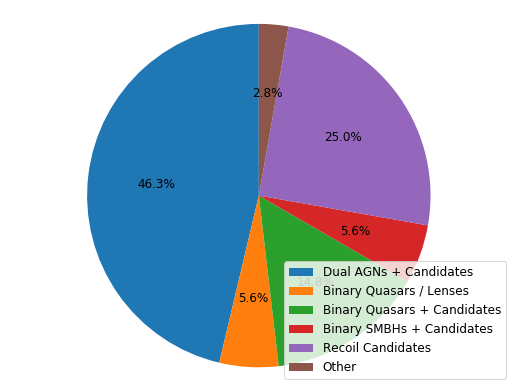

In [88]:

#explode = (0, 0.1, 0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')

fig, ax = plt.subplots(figsize=(8,6))
plt.rcParams.update({'font.size': 12})
plt.tight_layout()

ax.pie(types, labels=None, autopct='%1.1f%%', startangle=90)
#shadow=True,
#explode=explode,
ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.legend(loc="lower right", labels=classes)

#plt.savefig('classdistr_dr0p1.pdf', dpi=150)


plt.show()

In [3]:
temple = temple.loc[temple['Name1']!='Q0101.8-3012A']



In [52]:
# Now converting the coordinates so that we can map them onto an Aitoff projection map

coords1 = SkyCoord(ra=temple['RA1_deg'], dec=temple['Dec1_deg'], frame='icrs', unit='deg') #Making a SkyCoord object from the degree coordinates

coords2 = SkyCoord(ra=temple['RA2_deg'], dec=temple['Dec2_deg'], frame='icrs', unit='deg') #Making a SkyCoord object from the degree coordinates


# Now converting to radians, which is required by Matplotlib. Also required that the coordinates fall between \
# -pi and +pi , not 0 and 2pi, so also taking that into account here...
coords_ra_rad1 = coords1.ra.wrap_at(180 * u.deg).radian 
coords_dec_rad1 = coords1.dec.radian

coords_ra_rad2 = coords2.ra.wrap_at(180 * u.deg).radian 
coords_dec_rad2 = coords2.dec.radian


In [57]:
coordconvert = SkyCoord(ra = xliu2011['RA'], dec = xliu2011['Dec'], frame='icrs', unit = (u.hourangle, u.deg))

coords_ra_rad3 = coordconvert.ra.wrap_at(180 * u.deg).radian 
coords_dec_rad3 = coordconvert.dec.radian

#xliu2011['RA_deg'] = coordconvert.ra.degree
#xliu2011['Dec_deg'] = coordconvert.dec.degree


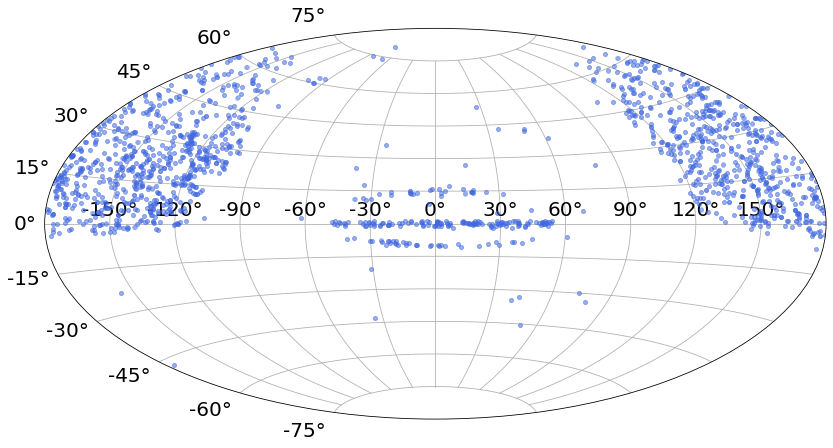

In [97]:
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 20})
plt.figure(figsize=(12,8))
plt.subplot(111, projection="aitoff")
#plt.title("Sky Distribution of WMAGN")
plt.grid(True)
plt.plot(coords_ra_rad1, coords_dec_rad1, 'o', markersize=4, alpha=0.3, c='royalblue')
plt.plot(coords_ra_rad2, coords_dec_rad2, 'o', markersize=4, alpha=0.3, c='royalblue')
plt.plot(coords_ra_rad3, coords_dec_rad3, 'o', markersize=4, alpha=0.3, c='royalblue')

#plt.plot(wang_ra_rad, wang_dec_rad, '^', markersize=4, alpha=0.3, c='firebrick', label='Wang+2009')
#plt.plot(myers_ra_rad, myers_dec_rad, 's', markersize=4, alpha=0.3, c='forestgreen', label='Myers+2007')
#plt.plot(kirkman_ra_rad, kirkman_dec_rad, 'v', markersize=4, alpha=0.3, c='blueviolet', label='Kirkman+2008')
#plt.plot(tytler_ra_rad, tytler_dec_rad, 'D', markersize=4, alpha=0.3, c='darkorange', label='Tytler+2009')
#plt.plot(kyber_ra_rad, kyber_dec_rad, '*', markersize=4, alpha=0.3, c='black' , label='Individual Targets')
#plt.legend(loc='lower right')
plt.subplots_adjust(top=0.95,bottom=0.0)
plt.tight_layout()
plt.savefig('Skydistribution_wmagn.pdf', dpi=150)
plt.show()


In [64]:
from matplotlib.ticker import PercentFormatter

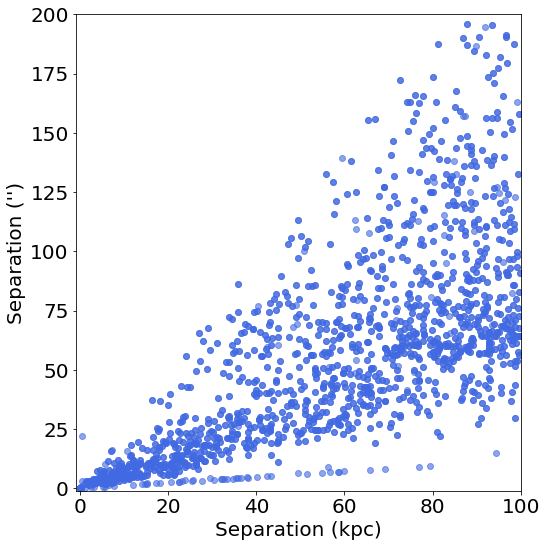

In [98]:
#Here I'm plotting the WISE colors and adding the Jarrett box and the Stern cut
#Constructing a grid of subplots showing the WISE color space

fig, ax = plt.subplots(figsize = (8,8))
ax.set_xlim([-1, 100])
ax.set_ylim([-1, 200])

im1 = ax.scatter(x=temple['Sep(kpc)'], y=temple['Sep'], c='royalblue', alpha=0.6)
im2 = ax.scatter(x=xliu2011['rp'], y=xliu2011['sep'], c='royalblue', alpha=0.6) 
#ax1.plot(x, y,'--', linewidth = 2, color = 'k')
#ax1.vlines(x = 2.2, ymin = 2.2*0.1+0.38, ymax = 1.7, linestyle = '--', alpha = 1, linewidth = 2)
#ax1.vlines(x = 4.2, ymin = 4.2*0.1+0.38, ymax = 1.7, linestyle = '--', alpha = 1, linewidth = 2)
#ax1.hlines(y = 1.7, xmin = 2.2, xmax = 4.2, linestyle='--', alpha=1, linewidth = 2)

#plotting the Stern 2012 cut
#ax1.hlines(y = 0.8, xmin = 1, xmax = 5, linestyle = '-.', alpha = 1, linewidth = 2)

ax.set(xlabel="Separation (kpc)", ylabel="Separation ('')")

#cbar = fig.colorbar(im1,ax=ax)
#cbar.ax.set_ylabel('log($L_{2-10\,\mathrm{keV,\,Obs.}}\,/\,\mathrm{erg\,s}^{-1}$)')

plt.tight_layout()
plt.savefig('WMAGN_arcsec_v_kpc.pdf', dpi=150)

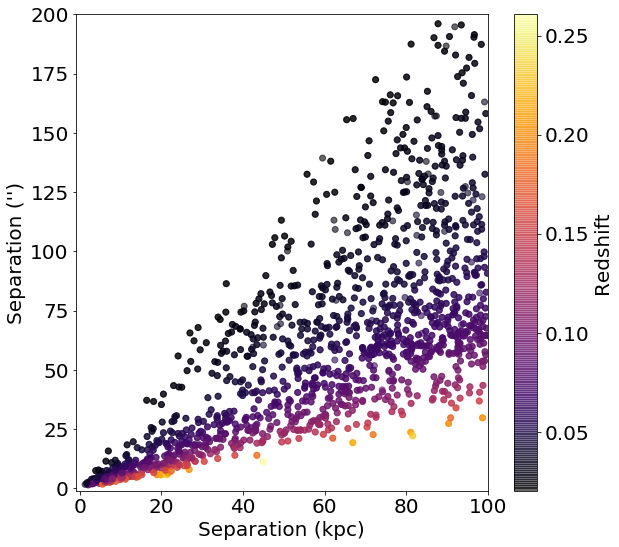

In [119]:
#Here I'm plotting the WISE colors and adding the Jarrett box and the Stern cut
#Constructing a grid of subplots showing the WISE color space

fig, ax = plt.subplots(figsize = (9,8))
ax.set_xlim([-1, 100])
ax.set_ylim([-1, 200])

#im1 = ax.scatter(x=temple['Sep(kpc)'], y=temple['Sep'], c=temple['z1'], cmap='inferno', alpha=0.6)
im2 = ax.scatter(x=xliu2011['rp'], y=xliu2011['sep'], c=xliu2011['z'], cmap='inferno', alpha=0.6) 

ax.set(xlabel="Separation (kpc)", ylabel="Separation ('')")

cbar = fig.colorbar(im2,ax=ax)
cbar.ax.set_ylabel('Redshift')

plt.tight_layout()
plt.savefig('WMAGN_arcsec_v_kpc_aux.pdf', dpi=150)

In [3]:
xmm = pd.read_csv('../../Desktop/liu_matches_to_xmmlog.csv', sep=',')

In [4]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


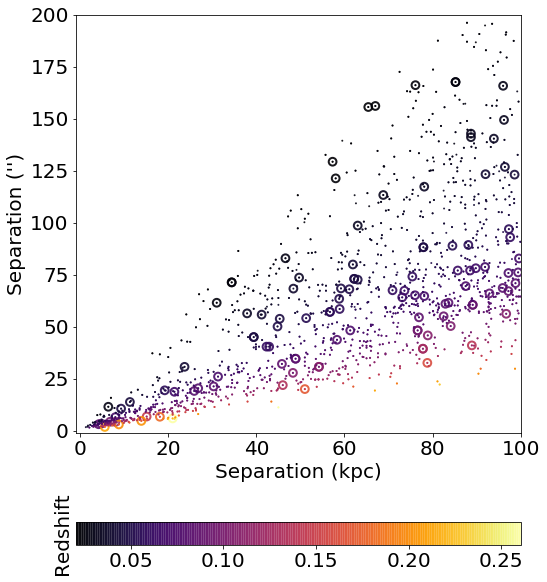

In [38]:
#Here I'm plotting the WISE colors and adding the Jarrett box and the Stern cut
#Constructing a grid of subplots showing the WISE color space

fig, ax = plt.subplots(figsize = (8,9))
ax.set_xlim([-1, 100])
ax.set_ylim([-1, 200])
plt.rcParams.update({'font.size': 20})

im1 = ax.scatter(x=xmm['rp'], y=xmm['sep'], c=xmm['z'], alpha=0.9, marker='o', s=60, \
                 facecolors='none', cmap='inferno',linewidths=2)
im2 = ax.scatter(x=xliu2011['rp'], y=xliu2011['sep'], c=xliu2011['z'], cmap='inferno', marker="o", alpha=0.8, s=1) 

im1.set_facecolor('none')

ax.set(xlabel="Separation (kpc)", ylabel="Separation ('')")

cbar = fig.colorbar(im2,ax=ax, orientation='horizontal')
cbar.ax.set_ylabel('Redshift')

plt.tight_layout()
plt.savefig('WMAGN_arcsec_v_kpc_aux2.pdf', dpi=300)


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


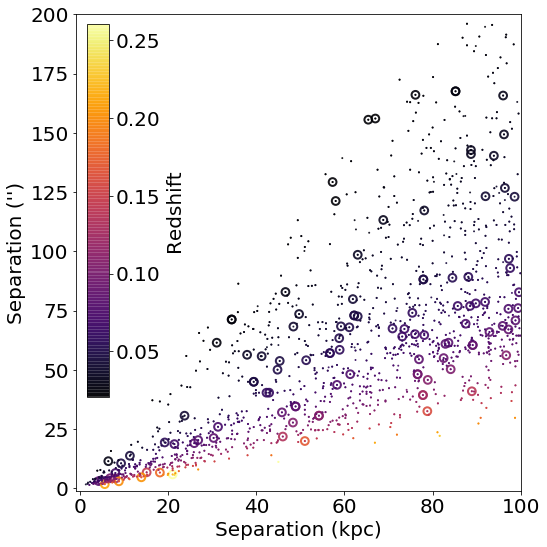

In [22]:
#Here I'm plotting the WISE colors and adding the Jarrett box and the Stern cut
#Constructing a grid of subplots showing the WISE color space

fig, ax = plt.subplots(figsize = (8,8))
ax.set_xlim([-1, 100])
ax.set_ylim([-1, 200])
plt.rcParams.update({'font.size': 20})

im1 = ax.scatter(x=xmm['rp'], y=xmm['sep'], c=xmm['z'], alpha=0.9, marker='o', s=60, \
                 facecolors='none', cmap='inferno',linewidths=2)
im2 = ax.scatter(x=xliu2011['rp'], y=xliu2011['sep'], c=xliu2011['z'], cmap='inferno', marker="o", alpha=0.8, s=1) 

im1.set_facecolor('none')

axins = inset_axes(ax,
                   width="5%",  # width = 5% of parent_bbox width
                   height="80%",  # height : 50%
                   loc='upper left',
                   bbox_to_anchor=(0.025, 0., 1, 0.98),
                   bbox_transform=ax.transAxes,
                   borderpad=0,
                   )

ax.set(xlabel="Separation (kpc)", ylabel="Separation ('')")

cbar = fig.colorbar(im2, cax=axins, orientation="vertical", ticks=[0.05, 0.1, 0.15, 0.2, 0.25])
cbar.ax.set_ylabel('Redshift')
axins.xaxis.set_ticks_position("bottom")

plt.tight_layout()
plt.savefig('xliu_arcsec_v_kpc_aux.pdf', dpi=300)




In [17]:
#np.max(xliu2011['z'])

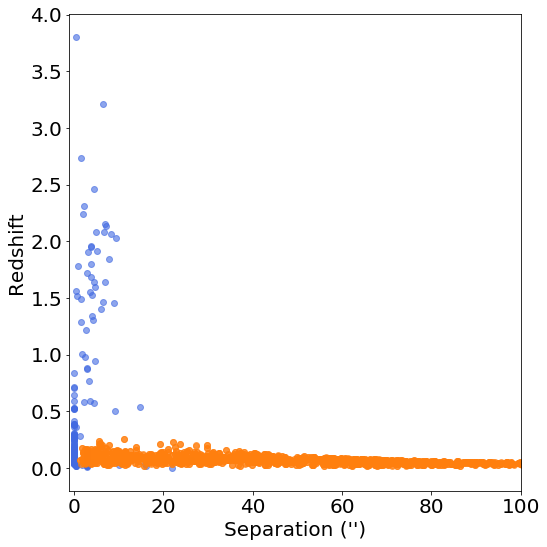

In [106]:
#Here I'm plotting the WISE colors and adding the Jarrett box and the Stern cut
#Constructing a grid of subplots showing the WISE color space

fig, ax = plt.subplots(figsize = (8,8))
ax.set_xlim([-1, 100])
#ax.set_ylim([-1, 200])

im1 = ax.scatter(x=temple['Sep'], y=temple['z1'], c='royalblue', alpha=0.6)
im2 = ax.scatter(x=xliu2011['sep'], y=xliu2011['z'], c='tab:orange', alpha=0.6) 
#ax1.plot(x, y,'--', linewidth = 2, color = 'k')
#ax1.vlines(x = 2.2, ymin = 2.2*0.1+0.38, ymax = 1.7, linestyle = '--', alpha = 1, linewidth = 2)
#ax1.vlines(x = 4.2, ymin = 4.2*0.1+0.38, ymax = 1.7, linestyle = '--', alpha = 1, linewidth = 2)
#ax1.hlines(y = 1.7, xmin = 2.2, xmax = 4.2, linestyle='--', alpha=1, linewidth = 2)

#plotting the Stern 2012 cut
#ax1.hlines(y = 0.8, xmin = 1, xmax = 5, linestyle = '-.', alpha = 1, linewidth = 2)

ax.set(xlabel="Separation ('')", ylabel="Redshift")

#cbar = fig.colorbar(im1,ax=ax)
#cbar.ax.set_ylabel('log($L_{2-10\,\mathrm{keV,\,Obs.}}\,/\,\mathrm{erg\,s}^{-1}$)')

plt.tight_layout()
plt.savefig('WMAGN_arcsec_v_z.pdf', dpi=150)

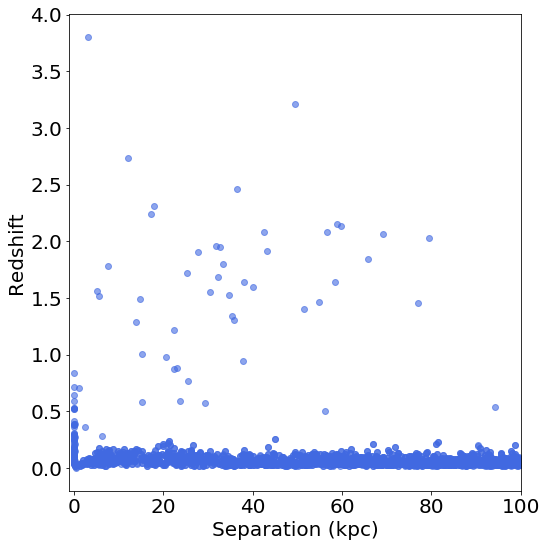

In [107]:
#Here I'm plotting the WISE colors and adding the Jarrett box and the Stern cut
#Constructing a grid of subplots showing the WISE color space

fig, ax = plt.subplots(figsize = (8,8))
ax.set_xlim([-1, 100])
#ax.set_ylim([-1, 200])

im1 = ax.scatter(x=temple['Sep(kpc)'], y=temple['z1'], c='royalblue', alpha=0.6)
im2 = ax.scatter(x=xliu2011['rp'], y=xliu2011['z'], c='royalblue', alpha=0.6) 
#ax1.plot(x, y,'--', linewidth = 2, color = 'k')
#ax1.vlines(x = 2.2, ymin = 2.2*0.1+0.38, ymax = 1.7, linestyle = '--', alpha = 1, linewidth = 2)
#ax1.vlines(x = 4.2, ymin = 4.2*0.1+0.38, ymax = 1.7, linestyle = '--', alpha = 1, linewidth = 2)
#ax1.hlines(y = 1.7, xmin = 2.2, xmax = 4.2, linestyle='--', alpha=1, linewidth = 2)

#plotting the Stern 2012 cut
#ax1.hlines(y = 0.8, xmin = 1, xmax = 5, linestyle = '-.', alpha = 1, linewidth = 2)

ax.set(xlabel="Separation (kpc)", ylabel="Redshift")

#cbar = fig.colorbar(im1,ax=ax)
#cbar.ax.set_ylabel('log($L_{2-10\,\mathrm{keV,\,Obs.}}\,/\,\mathrm{erg\,s}^{-1}$)')

plt.tight_layout()
plt.savefig('WMAGN_kpc_v_z.pdf', dpi=150)

In [65]:
temple

,index,System Type,Literature Name,Name1,Selection Method,Confirmation Method,z1,z1_type,RA1,Dec1,RA1_deg,Dec1_deg,Equinox,Coordinate_waveband1,Coordinate_Source1,Brightness1,Brightness_band1,Brightness_type1,Name2,z2,z2_type,RA2,Dec2,RA2_deg,Dec2_deg,Coordinate_waveband2,Coordinate_Source2,Brightness2,Brightness_band2,Brightness_type2,Sep,Sep(kpc),delta_z,dV,Paper(s),BibCode(s),DOI(s),Notes
0,0,Dual AGN Candidate,J000249+004504,J000249+004504,Double-Peaked Optical Spectroscopic Emission L...,-99,0.086620,spec,00:02:49,+00:45:04,0.704167,0.751111,J2000,Optical,SDSS,-100.000,-100,-100,J000249+004504,0.086620,spec,00:02:49,+00:45:04,0.704167,0.751111,Optical,SDSS,-100.000,-100,-100,3.000000,4.86705,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
1,1,Dual AGN Candidate,J000656+154847,J000656+154847,Double-Peaked Optical Spectroscopic Emission L...,-99,0.125150,spec,00:06:56,+15:48:47,1.733333,15.813056,J2000,Optical,SDSS,-100.000,-100,-100,J000656+154847,0.125150,spec,00:06:56,+15:48:47,1.733333,15.813056,Optical,SDSS,-100.000,-100,-100,3.000000,6.72889,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
2,2,Dual AGN Candidate,J013555+143529,J013555+143529,Double-Peaked Optical Spectroscopic Emission L...,-99,0.072080,spec,01:35:55,+14:35:29,23.979167,14.591389,J2000,Optical,SDSS,-100.000,-100,-100,J013555+143529,0.072080,spec,01:35:55,+14:35:29,23.979167,14.591389,Optical,SDSS,-100.000,-100,-100,3.000000,4.11911,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
3,3,Dual AGN Candidate,J014209-005049,J014209-005049,Double-Peaked Optical Spectroscopic Emission L...,-99,0.132530,spec,01:42:09,-00:50:49,25.537500,-0.846944,J2000,Optical,SDSS,-100.000,-100,-100,J014209-005049,0.132530,spec,01:42:09,-00:50:49,25.537500,-0.846944,Optical,SDSS,-100.000,-100,-100,3.000000,7.06662,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
4,4,Dual AGN Candidate,J015605-000721,J015605-000721,Double-Peaked Optical Spectroscopic Emission L...,-99,0.080840,spec,01:56:05,-00:07:21,29.020833,-0.122500,J2000,Optical,SDSS,-100.000,-100,-100,J015605-000721,0.080840,spec,01:56:05,-00:07:21,29.020833,-0.122500,Optical,SDSS,-100.000,-100,-100,3.000000,4.57282,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
5,5,Dual AGN Candidate,J073509+403624,J073509+403624,Double-Peaked Optical Spectroscopic Emission L...,-99,0.102970,spec,07:35:09,+40:36:24,113.787500,40.606667,J2000,Optical,SDSS,-100.000,-100,-100,J073509+403624,0.102970,spec,07:35:09,+40:36:24,113.787500,40.606667,Optical,SDSS,-100.000,-100,-100,3.000000,5.67784,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
6,6,Dual AGN Candidate,J074729+344018,J074729+344018,Double-Peaked Optical Spectroscopic Emission L...,-99,0.129820,spec,07:47:29,+34:40:18,116.870833,34.671667,J2000,Optical,SDSS,-100.000,-100,-100,J074729+344018,0.129820,spec,07:47:29,+34:40:18,116.870833,34.671667,Optical,SDSS,-100.000,-100,-100,3.000000,6.94328,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
7,7,Dual AGN Candidate,J074953+451454,J074953+451454,Double-Peaked Optical Spectroscopic Emission L...,-99,0.031320,spec,07:49:53,+45:14:54,117.470833,45.248333,J2000,Optical,SDSS,-100.000,-100,-100,J074953+451454,0.031320,spec,07:49:53,+45:14:54,117.470833,45.248333,Optical,SDSS,-100.000,-100,-100,3.000000,1.87826,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
8,8,Dual AGN Candidate,J075223+273643,J075223+273643,Double-Peaked Optical Spectroscopic Emission L...,-99,0.069080,spec,07:52:23,+27:36:43,118.095833,27.611944,J2000,Optical,SDSS,-100.000,-100,-100,J075223+273643,0.069080,spec,07:52:23,+27:36:43,118.095833,27.611944,Optical,SDSS,-100.000,-100,-100,3.000000,3.96153,

<BarContainer object of 20 artists>

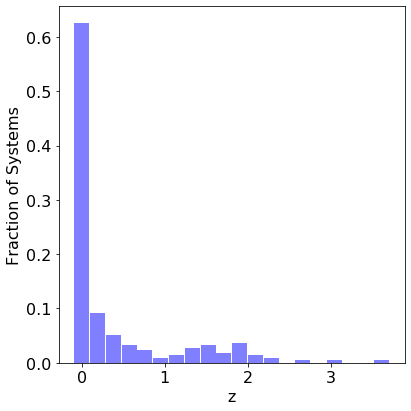

In [93]:
plt.rcParams.update({'font.size': 16})

plt.figure(tight_layout=True, figsize=(6,6))
plt.subplot(111)
#plt.title('Redshift Distribution in WMAGN')
#Remove NaN so we can plot
sith = temple[temple['z1']>0]
heights, bins = np.histogram(sith['z1'],bins=20)
heights = heights/sum(heights)
plt.ylabel('Fraction of Systems')
plt.xlabel('z')
plt.bar(bins[:-1],heights,width=(max(bins) - min(bins))/len(bins), color="blue", alpha=0.5)
#plt.savefig('Redshiftdistribution_dr0p1.pdf', dpi=150)



(array([135.,  20.,  11.,   7.,   5.,   2.,   3.,   6.,   7.,   4.,   8.,
          3.,   2.,   0.,   1.,   0.,   1.,   0.,   0.,   1.]),
 array([1.0000e-03, 1.9110e-01, 3.8120e-01, 5.7130e-01, 7.6140e-01,
        9.5150e-01, 1.1416e+00, 1.3317e+00, 1.5218e+00, 1.7119e+00,
        1.9020e+00, 2.0921e+00, 2.2822e+00, 2.4723e+00, 2.6624e+00,
        2.8525e+00, 3.0426e+00, 3.2327e+00, 3.4228e+00, 3.6129e+00,
        3.8030e+00]),
 <a list of 20 Patch objects>)

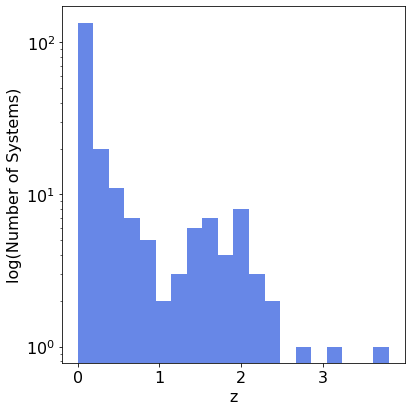

In [94]:
plt.rcParams.update({'font.size': 16})

plt.figure(tight_layout=True, figsize=(6,6))
plt.subplot(111)
#plt.title('Redshift Distribution in WMAGN')
#Remove NaN so we can plot
sith = temple[temple['z1']>0]
plt.ylabel('log(Number of Systems)')
plt.xlabel('z')
plt.hist(sith['z1'], bins=20, color="royalblue", log=True, alpha=0.8)
#plt.savefig('Redshiftdistribution_dr0p1.pdf', dpi=150)



<BarContainer object of 20 artists>

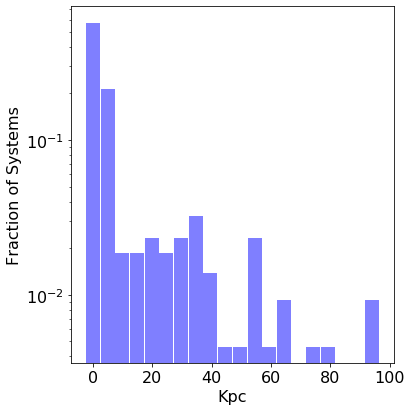

In [95]:
plt.figure(tight_layout=True, figsize=(6,6))
plt.subplot(111)
#plt.title('Projected Separations in WMAGN')
jedi = temple[temple['Sep(kpc)']>=0]
heights, bins = np.histogram(jedi['Sep(kpc)'],bins=20)
heights = heights/sum(heights)
plt.xlabel('Kpc')
plt.ylabel('Fraction of Systems')
plt.bar(bins[:-1],heights,width=(max(bins) - min(bins))/len(bins), log=True, color="blue", alpha=0.5)
#plt.savefig('Projsepdistribution_dr0p1.pdf', dpi=150)



(array([124.,  46.,   4.,   4.,   5.,   4.,   5.,   7.,   3.,   1.,   1.,
          5.,   1.,   2.,   0.,   1.,   1.,   0.,   0.,   2.]),
 array([0.0, 4.954889232872682, 9.909778465745363, 14.864667698618046,
        19.819556931490727, 24.774446164363408, 29.729335397236092,
        34.68422463010877, 39.63911386298145, 44.594003095854134,
        49.548892328726815, 54.503781561599496, 59.458670794472184,
        64.41356002734486, 69.36844926021755, 74.32333849309022,
        79.2782277259629, 84.2331169588356, 89.18800619170827,
        94.14289542458096, 99.09778465745363], dtype=object),
 <a list of 20 Patch objects>)

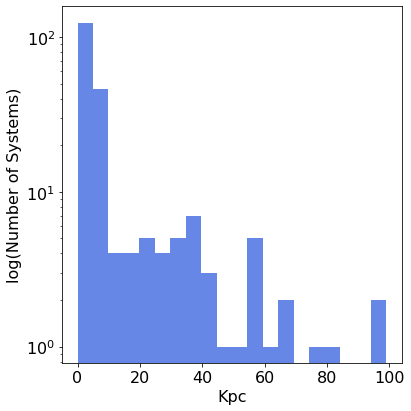

In [96]:

plt.figure(tight_layout=True, figsize=(6,6))
plt.subplot(111)
#plt.title('Redshift Distribution in WMAGN')
#Remove NaN so we can plot
sith = temple[temple['Sep(kpc)']>=0]
plt.ylabel('log(Number of Systems)')
plt.xlabel('Kpc')
plt.hist(sith['Sep(kpc)'], bins=20, color="royalblue", log=True, alpha=0.8)
#plt.savefig('Projsepdistribution_dr0p1.pdf', dpi=150)


<BarContainer object of 20 artists>

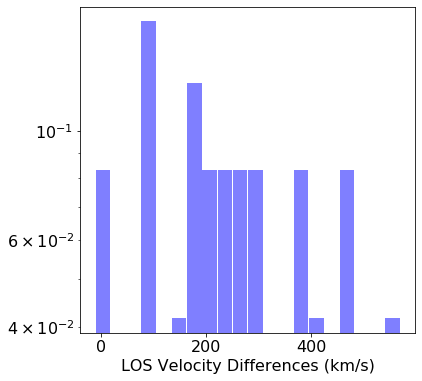

In [97]:
plt.figure(figsize=(6,6))
plt.subplot(111)
#plt.title('Line of Sight Velocity Differences from Hennawi+2006 Pairs')
grey = temple[np.abs(temple['dV'])>0]
heights, bins = np.histogram(np.abs(grey['dV']), bins=20)
heights = heights/sum(heights)
plt.xlabel('LOS Velocity Differences (km/s)')
plt.bar(bins[:-1],heights,width=(max(bins) - min(bins))/len(bins), log=True, color="blue", alpha=0.5)






In [374]:
test = pd.read_csv('WMAGN_DR0p1.csv', delimiter=',')

In [375]:
test

,System Type,Literature Name,Name1,Selection Method,Confirmation Method,z1,z1_type,RA1,Dec1,RA1_deg,Dec1_deg,Equinox,Coordinate_waveband1,Coordinate_Source1,Brightness1,Brightness_band1,Brightness_type1,Name2,z2,z2_type,RA2,Dec2,RA2_deg,Dec2_deg,Coordinate_waveband2,Coordinate_Source2,Brightness2,Brightness_band2,Brightness_type2,Sep,Sep(kpc),delta_z,dV,Paper(s),BibCode(s),DOI(s),Notes
0,Dual AGN Candidate,J000249+004504,J000249+004504,Double-Peaked Optical Spectroscopic Emission L...,-99,0.086620,spec,00:02:49,+00:45:04,0.704167,0.751111,J2000,Optical,SDSS,-100.000,-100,-100,J000249+004504,0.086620,spec,00:02:49,+00:45:04,0.704167,0.751111,Optical,SDSS,-100.000,-100,-100,3.000000,4.867052,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
1,Dual AGN Candidate,J000656+154847,J000656+154847,Double-Peaked Optical Spectroscopic Emission L...,-99,0.125150,spec,00:06:56,+15:48:47,1.733333,15.813056,J2000,Optical,SDSS,-100.000,-100,-100,J000656+154847,0.125150,spec,00:06:56,+15:48:47,1.733333,15.813056,Optical,SDSS,-100.000,-100,-100,3.000000,6.728888,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
2,Dual AGN Candidate,J013555+143529,J013555+143529,Double-Peaked Optical Spectroscopic Emission L...,-99,0.072080,spec,01:35:55,+14:35:29,23.979167,14.591389,J2000,Optical,SDSS,-100.000,-100,-100,J013555+143529,0.072080,spec,01:35:55,+14:35:29,23.979167,14.591389,Optical,SDSS,-100.000,-100,-100,3.000000,4.119105,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
3,Dual AGN Candidate,J014209-005049,J014209-005049,Double-Peaked Optical Spectroscopic Emission L...,-99,0.132530,spec,01:42:09,-00:50:49,25.537500,-0.846944,J2000,Optical,SDSS,-100.000,-100,-100,J014209-005049,0.132530,spec,01:42:09,-00:50:49,25.537500,-0.846944,Optical,SDSS,-100.000,-100,-100,3.000000,7.066624,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
4,Dual AGN Candidate,J015605-000721,J015605-000721,Double-Peaked Optical Spectroscopic Emission L...,-99,0.080840,spec,01:56:05,-00:07:21,29.020833,-0.122500,J2000,Optical,SDSS,-100.000,-100,-100,J015605-000721,0.080840,spec,01:56:05,-00:07:21,29.020833,-0.122500,Optical,SDSS,-100.000,-100,-100,3.000000,4.572819,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
5,Dual AGN Candidate,J073509+403624,J073509+403624,Double-Peaked Optical Spectroscopic Emission L...,-99,0.102970,spec,07:35:09,+40:36:24,113.787500,40.606667,J2000,Optical,SDSS,-100.000,-100,-100,J073509+403624,0.102970,spec,07:35:09,+40:36:24,113.787500,40.606667,Optical,SDSS,-100.000,-100,-100,3.000000,5.677844,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
6,Dual AGN Candidate,J074729+344018,J074729+344018,Double-Peaked Optical Spectroscopic Emission L...,-99,0.129820,spec,07:47:29,+34:40:18,116.870833,34.671667,J2000,Optical,SDSS,-100.000,-100,-100,J074729+344018,0.129820,spec,07:47:29,+34:40:18,116.870833,34.671667,Optical,SDSS,-100.000,-100,-100,3.000000,6.943283,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
7,Dual AGN Candidate,J074953+451454,J074953+451454,Double-Peaked Optical Spectroscopic Emission L...,-99,0.031320,spec,07:49:53,+45:14:54,117.470833,45.248333,J2000,Optical,SDSS,-100.000,-100,-100,J074953+451454,0.031320,spec,07:49:53,+45:14:54,117.470833,45.248333,Optical,SDSS,-100.000,-100,-100,3.000000,1.878260,0.000000,0.000000,Wang+2009,2009ApJ...705L..76W,https://doi.org/10.1088/0004-637X/705/1/L76,NaN
8,Dual AGN Candidate,J075223+273643,J075223+273643,Double-Peaked Optical Spectroscopic Emission L...,-99,0.069080,spec,07:52:23,+27:36:43,118.095833,27.611944,J2000,Optical,SDSS,-100.000,-100,-100,J075223+273643,0.069080,spec,07:52:23,+27:36:43,118.095833,27.611944,Optical,SDSS,-100.000,-100,-100,3.000000,3.961534,0.000000,0.0000

In [297]:
# Angular separation 
c1 = SkyCoord('03:21:26.2', '-45:30:27', frame='icrs', unit=(u.hourangle, u.deg))
c2 = SkyCoord('03:21:25.8', '-45:30:53', frame='icrs', unit=(u.hourangle, u.deg))
sep = c1.separation(c2)
sep.arcsecond


26.337784196045785

All cells following this are deprecated cells
---

In [ ]:
# Here we're calculating the redshift differences, the velocity differences (to compare to Hennawi+2006) \ 
# and combine Hennawi's RA and Dec columns for later use. 

#----------------------
# Starting with Table 2

#hennawi2006_t2['redshift_diff'] = -hennawi2006_t2['z1']+hennawi2006_t2['z2']
#hennawi2006_t2['dV_rwp'] = ((2.99e+5)*hennawi2006_t2['redshift_diff'])/(1+hennawi2006_t2['z1']) #speed of B relative to A

## Combined RA and Dec columns
#
#hennawi2006_t2['RA1'] = hennawi2006_t2['RA1.h'].astype(str) + ':' + hennawi2006_t2['RA1.m'].astype(str) + ':' + hennawi2006_t2['RA1.s'].astype(str)
#hennawi2006_t2['Dec1'] = hennawi2006_t2['DE1.-'].astype(str) + hennawi2006_t2['DE1.d'].astype(str) + ':' + hennawi2006_t2['DE1.m'].astype(str) + ':' + hennawi2006_t2['DE1.s'].astype(str)
#
#hennawi2006_t2['RA2'] = hennawi2006_t2['RA2.h'].astype(str) + ':' + hennawi2006_t2['RA2.m'].astype(str) + ':' + hennawi2006_t2['RA2.s'].astype(str)
#hennawi2006_t2['Dec2'] = hennawi2006_t2['DE2.-'].astype(str) + hennawi2006_t2['DE2.d'].astype(str) + ':' + hennawi2006_t2['DE2.m'].astype(str) + ':' + hennawi2006_t2['DE2.s'].astype(str)

#----------------
# Now for Table 3
#hennawi2006_t3['redshift_diff'] = -hennawi2006_t3['z1']+hennawi2006_t3['z2']
#hennawi2006_t3['dV_rwp'] = ((2.99e+5)*hennawi2006_t3['redshift_diff'])/(1+hennawi2006_t3['z1']) #speed of B relative to A

## Combined RA and Dec columns
#
#hennawi2006_t3['RA1'] = hennawi2006_t3['RA1.h'].astype(str) + ':' + hennawi2006_t3['RA1.m'].astype(str) + ':' + hennawi2006_t3['RA1.s'].astype(str)
#hennawi2006_t3['Dec1'] = hennawi2006_t3['DE1.-'].astype(str) + hennawi2006_t3['DE1.d'].astype(str) + ':' + hennawi2006_t3['DE1.m'].astype(str) + ':' + hennawi2006_t3['DE1.s'].astype(str)
#
#hennawi2006_t3['RA2'] = hennawi2006_t3['RA2.h'].astype(str) + ':' + hennawi2006_t3['RA2.m'].astype(str) + ':' + hennawi2006_t3['RA2.s'].astype(str)
#hennawi2006_t3['Dec2'] = hennawi2006_t3['DE2.-'].astype(str) + hennawi2006_t3['DE2.d'].astype(str) + ':' + hennawi2006_t3['DE2.m'].astype(str) + ':' + hennawi2006_t3['DE2.s'].astype(str)

#----------------
# Now for Table 4

#hennawi2006_t4['redshift_diff'] = -hennawi2006_t4['z1']+hennawi2006_t4['z2']
#hennawi2006_t4['dV_rwp'] = ((2.99e+5)*hennawi2006_t4['redshift_diff'])/(1+hennawi2006_t4['z1']) #speed of B relative to A

## Combined RA and Dec columns
#
#hennawi2006_t4['RA1'] = hennawi2006_t4['RA1.h'].astype(str) + ':' + hennawi2006_t4['RA1.m'].astype(str) + ':' + hennawi2006_t4['RA1.s'].astype(str)
#hennawi2006_t4['Dec1'] = hennawi2006_t4['DE1.-'].astype(str) + hennawi2006_t4['DE1.d'].astype(str) + ':' + hennawi2006_t4['DE1.m'].astype(str) + ':' + hennawi2006_t4['DE1.s'].astype(str)
#
#hennawi2006_t4['RA2'] = hennawi2006_t4['RA2.h'].astype(str) + ':' + hennawi2006_t4['RA2.m'].astype(str) + ':' + hennawi2006_t4['RA2.s'].astype(str)
#hennawi2006_t4['Dec2'] = hennawi2006_t4['DE2.-'].astype(str) + hennawi2006_t4['DE2.d'].astype(str) + ':' + hennawi2006_t4['DE2.m'].astype(str) + ':' + hennawi2006_t4['DE2.s'].astype(str)
#

###########################################

#hennawi2006_t2

###########################################

#print((2.99e+5)*(0.005)/(1+1.560)) # in km/s

#print((2.99e+5)*((0.005+1)**2 - 1)/((0.005+1)**2 + 1))

###########################################

## Now concatenating all 3 of Hennawi+2006 catalogs together
#frames = [henn06_t2,henn06_t3,henn06_t4]
#hennawi2006 = ((pd.concat(frames)).sort_values(by=['RA'])).reset_index(drop=True)

In [ ]:
# Here are some revised calculations (based on the work in Tytler+2009) for velocity differences and LOS distances
# derived from velocity differences

#v = (2.99e+5)*((1+z1)**2 - (1+z2)**2)/((1+z1)**2+(1+z2)**2)
#
#
#v=H(z)*d, [H(z)/H0]**2 = ((1+z)**3)*Om0 + OmV
#    Therefore: H(z) = H0*np.sqrt(((1+z)**3)*Om0 + OmV)
#d = v/H(z)

#hennawi2006_t4['dV_new'] = (2.99e+5)*((1+hennawi2006_t4['z1'])**2 - (1+hennawi2006_t4['z2'])**2)/((1+hennawi2006_t4['z1'])**2+(1+hennawi2006_t4['z2'])**2)
#hennawi2006_t4['LOS_dist(Mpc)'] = np.abs(hennawi2006_t4['dV_new'])/(70*np.sqrt(((1+hennawi2006_t4['z1'])**3)*0.3 + 0.7))


#hennawi2006_t4

In [ ]:
#hennawi2006['r_kpc'] = hennawi2006['r']/(0.72)
#hennawi2006['proj_sep(kpc)'] = hennawi2006['theta']*((cosmo.arcsec_per_kpc_proper(hennawi2006['z']))**(-1))

In [ ]:
## Constructing single RA and Dec columns for all of the Myers+2008 tables...
#
## For Table 1
#myers2008_t1['RA'] = myers2008_t1['RAh'].astype(str) + ':' + myers2008_t1['RAm'].astype(str) + ':' + myers2008_t1['RAs'].astype(str)
#myers2008_t1['Dec'] = myers2008_t1['DE-'].astype(str) + myers2008_t1['DEd'].astype(str) + ':' + myers2008_t1['DEm'].astype(str) + ':' + myers2008_t1['DEs'].astype(str)
#myers2008_t1['System Type'] = "Binary Quasar Candidate"
#
## For Table 2
#myers2008_t2['RA'] = myers2008_t2['RAh'].astype(str) + ':' + myers2008_t2['RAm'].astype(str) + ':' + myers2008_t2['RAs'].astype(str)
#myers2008_t2['Dec'] = myers2008_t2['DE-'].astype(str) + myers2008_t2['DEd'].astype(str) + ':' + myers2008_t2['DEm'].astype(str) + ':' + myers2008_t2['DEs'].astype(str)
#myers2008_t2['System Type'] = "Binary Quasar"
#
## For Table 3 --> These are confirmed projected pairs... we'll use only to exclude sources from Myers+2007 list
#myers2008_t3['RA'] = myers2008_t3['RAh'].astype(str) + ':' + myers2008_t3['RAm'].astype(str) + ':' + myers2008_t3['RAs'].astype(str)
#myers2008_t3['Dec'] = myers2008_t3['DE-'].astype(str) + myers2008_t3['DEd'].astype(str) + ':' + myers2008_t3['DEm'].astype(str) + ':' + myers2008_t3['DEs'].astype(str)
#myers2008_t3['System Type'] = "Projected Pairs"
#
## For Table 4
#myers2008_t4['RA'] = myers2008_t4['RAh'].astype(str) + ':' + myers2008_t4['RAm'].astype(str) + ':' + myers2008_t4['RAs'].astype(str)
#myers2008_t4['Dec'] = myers2008_t4['DE-'].astype(str) + myers2008_t4['DEd'].astype(str) + ':' + myers2008_t4['DEm'].astype(str) + ':' + myers2008_t4['DEs'].astype(str)
#myers2008_t4['System Type'] = "Binary Quasar Candidate"
#
## Dropping the old individual RA and Dec columns in the new tables:
#myers2008_t1.drop(labels=['RAh','RAm','RAs','DE-','DEd','DEm','DEs'], axis=1, inplace=True)
#myers2008_t2.drop(labels=['RAh','RAm','RAs','DE-','DEd','DEm','DEs'], axis=1, inplace=True)
#myers2008_t3.drop(labels=['RAh','RAm','RAs','DE-','DEd','DEm','DEs'], axis=1, inplace=True)
#myers2008_t4.drop(labels=['RAh','RAm','RAs','DE-','DEd','DEm','DEs'], axis=1, inplace=True)
#
## For Table 5
#

# Now I need to slide every other row from teach dataframe and then join the two resulting dataframes \
# that way we end up with one row per pair instead of the current structure (1 row per component)

# Now slicing the pairs table and then joining them
#myers2008_t1a = myers2008_t1[0::2] # Slicing now only the A components
#myers2008_t1b = myers2008_t1[1::2] # Slicing now only the B components
#
#myers2008_t1a.reset_index(drop=True, inplace=True)
#myers2008_t1b.reset_index(drop=True, inplace=True)

#myers2008_t1new = myers2008_t1a.join(myers2008_t1b, how='left', lsuffix = '1', rsuffix='2')
# There were 10 total rows before, so now there should be 5. 

# Now for the second table
#myers2008_t2a = myers2008_t2[0::2] # Slicing now only the A components
#myers2008_t2b = myers2008_t2[1::2] # Slicing now only the B components
#
#myers2008_t2a.reset_index(drop=True, inplace=True)
#myers2008_t2b.reset_index(drop=True, inplace=True)
#
#myers2008_t2new = myers2008_t2a.join(myers2008_t2b, how='left', lsuffix = '1', rsuffix='2')
# There were 16 total rows before, so now there should be 8.
# Now for the third table
#myers2008_t3a = myers2008_t3[0::2] # Slicing now only the A components
#myers2008_t3b = myers2008_t3[1::2] # Slicing now only the B components
#
#myers2008_t3a.reset_index(drop=True, inplace=True)
#myers2008_t3b.reset_index(drop=True, inplace=True)
#
#myers2008_t3new = myers2008_t3a.join(myers2008_t3b, how='left', lsuffix = '1', rsuffix='2')
# There were 20 total rows before, so now there should be 10. 

# Now for the fourth table
#myers2008_t4a = myers2008_t4[0::2] # Slicing now only the A components
#myers2008_t4b = myers2008_t4[1::2] # Slicing now only the B components
#
#myers2008_t4a.reset_index(drop=True, inplace=True)
#myers2008_t4b.reset_index(drop=True, inplace=True)
#
#myers2008_t4new = myers2008_t4a.join(myers2008_t4b, how='left', lsuffix = '1', rsuffix='2')
# There were 8 total rows, so now there should be 4.


# Here we're filtering out the common rows by using the isin function. This way we can check to see if the \
# SDSS designation in myers matches the designations in the myers+2008 table 3. We actually only need to check \
# SDSS1 and not SDSS2, as any row thrown out using SDSS1 automatically filters the pair's counterpart in SDSS2.
#myers_master = (myers2007_v2[~myers2007_v2['SDSS'].isin(myers2008_t3['SDSS'])]).reset_index(drop=True)
# This removes the 10 pairs of projected pairs, or 20 total rows



In [ ]:
# Columns of myers2007
#'SDSS1', 'umag1', 'gmag1', 'zph1l', 'zph1m', 'zph1u', 'zsp1', 'f_zsp1', 'Delta', 'f_Delta', 'RA1', 'Dec1' 'Equinox', 'Coordinate_waveband', 'Coordinate_Source', 'System Type', 'z1', 'z1_type','Paper(s)', 'PairID'
#
#'SDSS2', 'umag2', 'gmag2', 'zph2l', 'zph2m', 'zph2u', 'zsp2', 'n_zsp2', 'Delta', 'f_Delta', 'RA2', 'Dec2', 'Equinox', 'Coordinate_waveband', 'Coordinate_Source', 'System Type', 'z2', 'z2_type', 'Paper(s)', 'PairID'
    

# We'll return to these calculations and columns after the matching of objects and columns from the Myers+2007 \
# and Myers+2008 catalogs...

## And calculating velocity differences based on the spec-z's and the midpoint of the photo-z distributions...
#myers2007['delta_z'] = myers2007['z1'] - myers2007['z2']
#myers2007['dV'] = (2.99e+5)*((1+myers2007['z1'])**2 - (1+myers2007['z2'])**2)/((1+myers2007['z1'])**2+(1+myers2007['z2'])**2)
#myers2007['Sep(kpc)'] = myers2007['Delta']*((cosmo.arcsec_per_kpc_proper(myers2007['z1']))**(-1))
#
#
## Now adding in columns for the author+year, bibcode, and doi link
#myers2007['Paper(s)'] = "Myers+2007"
#myers2007['bibcode(s)'] = "2007ApJ...658...99M"
#myers2007['DOI(s)'] = "https://doi.org/10.1086/511520"
#
## Now adding in columns for the projected separations in kpc and velocity differences based on the redshift difference
##myers07_t1['proj_sep(kpc)_l'] = myers07_t1['Delta']*((cosmo.arcsec_per_kpc_proper(myers07_t1['zphl']))**(-1))
##myers07_t1['proj_sep(kpc)_m'] = myers07_t1['Delta']*((cosmo.arcsec_per_kpc_proper(myers07_t1['zphm']))**(-1))
##myers07_t1['proj_sep(kpc)_u'] = myers07_t1['Delta']*((cosmo.arcsec_per_kpc_proper(myers07_t1['zphu']))**(-1))
##myers07_t1['proj_sep(kpc)_ave'] = (myers07_t1['proj_sep(kpc)_l']+myers07_t1['proj_sep(kpc)_m']+myers07_t1['proj_sep(kpc)_u'])/3
#
#
## MAGNITUDES QUOTED BY MYERS+ ARE ***NOT*** EXTINCTION CORRECTED. THEY ARE OBSERVED MAGNITUDES.

## Now assigning each quasar of each pair to a separate dataframe before we concatenate the two to make one list
#
#myersA = myers2007_t1[['SDSS1','RA1','Dec1','umag1','gmag1','zph1l','zph1m','zph1u','zsp1','f_zsp1','zsp1b','r_zsp1b','Delta']].copy()
#myersA.columns=['Name','RA','Dec','umag','gmag','zphl','zphm','zphu','zsp','f_zsp','zspb','r_zspb','Delta'] # Renaming the columns here so that they remove any 1's 
#
#myersB = myers2007_t1[['SDSS2','RA2','Dec2','umag2','gmag2','zph2l','zph2m','zph2u','zsp2','n_zsp2','zsp2b','r_zsp2b','Delta']].copy()
#myersB.columns=['Name','RA','Dec','umag','gmag','zphl','zphm','zphu','zsp','f_zsp','zspb','r_zspb','Delta'] # Renaming the columns here so that they remove any 2's
#
#frames=[myersA,myersB]
#
#myers07_t1 = ((pd.concat(frames)).sort_values(by=['RA'])).reset_index(drop=True)
#
## Now converting the sexagesimal coordinates to degrees...
#coordconvert = SkyCoord(ra = myers07_t1['RA'], dec = myers07_t1['Dec'], frame='icrs', unit = (u.hourangle, u.deg))
#
#myers07_t1['RA_deg'] = coordconvert.ra.degree
#myers07_t1['Dec_deg'] = coordconvert.dec.degree
#

## Now storing the degree coordinates from Myers+07 as a SkyCoord object to plot
#myerscoords = SkyCoord(ra=myers07_t1['RA_deg'], dec=myers07_t1['Dec_deg'], frame='icrs', unit='deg') #Making a SkyCoord object from the degree coordinates
#
## Now converting to radians, which is required by Matplotlib. Also required that the coordinates fall between \
## -pi and +pi , not 0 and 2pi, so also taking that into account here...
#myers_ra_rad = myerscoords.ra.wrap_at(180 * u.deg).radian 
#myers_dec_rad = myerscoords.dec.radian

# Now calculating projected separation
#myers07_t1['proj_sep(kpc)_l'] = myers07_t1['Delta']*((cosmo.arcsec_per_kpc_proper(myers07_t1['zphl']))**(-1))
#myers07_t1['proj_sep(kpc)_m'] = myers07_t1['Delta']*((cosmo.arcsec_per_kpc_proper(myers07_t1['zphm']))**(-1))
#myers07_t1['proj_sep(kpc)_u'] = myers07_t1['Delta']*((cosmo.arcsec_per_kpc_proper(myers07_t1['zphu']))**(-1))
#
#myers07_t1['proj_sep(kpc)_ave'] = (myers07_t1['proj_sep(kpc)_l']+myers07_t1['proj_sep(kpc)_m']+myers07_t1['proj_sep(kpc)_u'])/3




In [ ]:
## Now breaking the dataframe into two frames to then concatenate and sort...
#
##kirkman2008_t1['Name1'] = kirkman2008_t1['RAh'].astype(str) + kirkman2008_t1['RAm'].astype(str) + kirkman2008_t1['RAs'].astype(str) + kirkman2008_t1['DE-'].astype(str) + kirkman2008_t1['DEd'].astype(str) + kirkman2008_t1['DEm'].astype(str) + kirkman2008_t1['DEs'].astype(str)
##kirkman2008_t1['Name2'] = kirkman2008_t1['RA2h'].astype(str) + kirkman2008_t1['RA2m'].astype(str) + kirkman2008_t1['RA2s'].astype(str) + kirkman2008_t1['DE2-'].astype(str) + kirkman2008_t1['DE2d'].astype(str) + kirkman2008_t1['DE2m'].astype(str) + kirkman2008_t1['DE2s'].astype(str)
##
#kirkman2008A = kirkman2008_t1[['Name1','RA1','Dec1','zem','delta_z','Sep','dV']].copy()
#kirkman2008A.columns=['Name','RA','Dec','zem','delta_z','Sep','dV'] # Renaming the columns here so that they remove any 1's 
#
#kirkman2008B = kirkman2008_t1[['Name2','RA2','Dec2','zem2','delta_z','Sep','dV']].copy()
#kirkman2008B.columns=['Name','RA','Dec','zem','delta_z','Sep','dV'] # Renaming the columns here so that they remove any 2's
#
#frames=[kirkman2008A,kirkman2008B]
#
#kirkman2008 = ((pd.concat(frames)).sort_values(by=['RA'])).reset_index(drop=True)
#
### Now converting the sexagesimal coordinates to degrees...
##coordconvert = SkyCoord(ra = kirkman2008['RA'], dec = kirkman2008['Dec'], frame='icrs', unit = (u.hourangle, u.deg))
##
##kirkman2008['RA_deg'] = coordconvert.ra.degree
##kirkman2008['Dec_deg'] = coordconvert.dec.degree
##
##
### and storing as a SkyCoord object for later plotting...
##kirkmancoords = SkyCoord(ra=kirkman2008['RA_deg'], dec=kirkman2008['Dec_deg'], frame='icrs', unit='deg') #Making a SkyCoord object from the degree coordinates
#
## Now converting to radians, which is required by Matplotlib. Also required that the coordinates fall between \
## -pi and +pi , not 0 and 2pi, so also taking that into account here...
#kirkman_ra_rad = kirkmancoords.ra.wrap_at(180 * u.deg).radian 
#kirkman_dec_rad = kirkmancoords.dec.radian
#
##kirkman2008['proj_sep(kpc)'] = kirkman2008['Sep']*((cosmo.arcsec_per_kpc_proper(kirkman2008['zem']))**(-1))
#

In [ ]:
##coordconvert = SkyCoord(ra = kyber['RA'], dec = kyber['Dec'], frame='icrs', unit = (u.hourangle, u.deg))
##
##kyber['RA_deg'] = coordconvert.ra.degree
##kyber['Dec_deg'] = coordconvert.dec.degree
#
## Now storing the degree coordinates from kyber+07 as a SkyCoord object to plot
#kybercoords = SkyCoord(ra=kyber['RA_deg'], dec=kyber['Dec_deg'], frame='icrs', unit='deg') #Making a SkyCoord object from the degree coordinates
#
## Now converting to radians, which is required by Matplotlib. Also required that the coordinates fall between \
## -pi and +pi , not 0 and 2pi, so also taking that into account here...
#kyber_ra_rad = kybercoords.ra.wrap_at(180 * u.deg).radian 
#kyber_dec_rad = kybercoords.dec.radian
#
#

In [ ]:
## Here I'm making a master column of the angular separations from all of these catalogs
#
#henn = hennawi2006[['RA', 'Dec']].copy()
#
#myers07 = myers07_t1[['RA', 'Dec']].copy() # Just a reminder that Myers has photometric redshifts
#
#
#wang = wang2009[['RA', 'Dec']].copy() #These are denoted with '-1', which indicates that the separations are not \
## determined, but in the range of ~ 1 kpc or less
#
#kirkman = kirkman2008[['RA', 'Dec']].copy()
#tytler = tytler2009_t1[['RA', 'Dec']].copy()
#
#kyber = kyber[['RA', 'Dec']].copy()
#
#frames=[henn,wang,myers07,kirkman,tytler,kyber]
#
#allcoords = (pd.concat(frames)).reset_index(drop=True)
#
#coordconvert = SkyCoord(ra = allcoords['RA'], dec = allcoords['Dec'], frame='icrs', unit = (u.hourangle, u.deg))
#
#allcoords['RA_deg'] = coordconvert.ra.degree
#allcoords['Dec_deg'] = coordconvert.dec.degree
#
#
#allcoords.to_csv('wmagn_coordinates.csv', sep=',', index=False)

In [ ]:
## Here I'm making a master column for the redshifts from all of these catalogs
#
#henn_z = hennawi2006[['z']].copy()
#
#myers07_z = myers07_t1[['zphm']].copy() # Just a reminder that Myers has photometric redshifts
#myers07_z.columns=['z'] 
#
#wang_z = wang2009[['z']].copy()
#
#kirkman_z = kirkman2008[['zem']].copy()
#kirkman_z.columns=['z'] 
#
#tytler_z = tytler2009[['zem']].copy()
#tytler_z.columns=['z'] 
#
#kyber_z = kyber[['z']].copy()
#
#frames=[henn_z,wang_z,myers07_z,kirkman_z,tytler_z,kyber_z]
#
#allredshifts = (pd.concat(frames)).reset_index(drop=True)
#

## Here I'm making a master column of the angular separations from all of these catalogs
#
#henn_sep = hennawi2006[['theta']].copy()
#henn_sep.columns=['Sep'] 
#
#myers07_sep = myers07_t1[['Delta']].copy() # Just a reminder that Myers has photometric redshifts
#myers07_sep.columns=['Sep'] 
#
#wang_sep = wang2009[['Sep']].copy() #These are denoted with '-1', which indicates that the separations are not \
## determined, but in the range of ~ 1 kpc or less
#
#kirkman_sep = kirkman2008[['Sep']].copy()
#tytler_sep = tytler2009[['Sep']].copy()
#
#kyber_sep = kyber[['delta_x(arcsec)']].copy()
#kyber_sep.columns=['Sep']
#
#frames=[henn_sep,wang_sep,myers07_sep,kirkman_sep,tytler_sep,kyber_sep]
#
#allangseps = (pd.concat(frames)).reset_index(drop=True)
#

## Here I'm making a master column of the projected separations from all of these catalogs
#
#henn_prjsep = hennawi2006[['proj_sep(kpc)']].copy()
#
#myers07_prjsep = myers07_t1[['proj_sep(kpc)_ave']].copy()
#myers07_prjsep.columns=['proj_sep(kpc)']
#
#wang_prjsep = wang2009[['proj_sep(kpc)']].copy()
#
#kirkman_prjsep = kirkman2008[['proj_sep(kpc)']].copy()
#
#tytler_prjsep = tytler2009[['proj_sep(kpc)']].copy()
#
#kyber_prjsep = kyber[['proj_sep(kpc)']]
#
#frames = [henn_prjsep,myers07_prjsep,wang_prjsep,kirkman_prjsep,tytler_prjsep]
#
#allprojseps = (pd.concat(frames)).reset_index(drop=True)
#

#import matplotlib.pyplot as plt
#plt.figure(figsize=(12,6))
#plt.subplot(111, projection="aitoff")
#plt.title("Sky Distribution of WMAGN")
#plt.grid(True)
#plt.plot(henn_ra_rad, henn_dec_rad, 'o', markersize=4, alpha=0.3, c='royalblue', label='Hennawi+2006')
#plt.plot(wang_ra_rad, wang_dec_rad, '^', markersize=4, alpha=0.3, c='firebrick', label='Wang+2009')
#plt.plot(myers_ra_rad, myers_dec_rad, 's', markersize=4, alpha=0.3, c='forestgreen', label='Myers+2007')
#plt.plot(kirkman_ra_rad, kirkman_dec_rad, 'v', markersize=4, alpha=0.3, c='blueviolet', label='Kirkman+2008')
#plt.plot(tytler_ra_rad, tytler_dec_rad, 'D', markersize=4, alpha=0.3, c='darkorange', label='Tytler+2009')
#plt.plot(kyber_ra_rad, kyber_dec_rad, '*', markersize=4, alpha=0.3, c='black' , label='Individual Targets')
#plt.legend(loc='lower right')
#plt.subplots_adjust(top=0.95,bottom=0.0)
#plt.savefig('Skydistribution_wmagn.pdf', dpi=150)
#plt.show()

#from matplotlib.ticker import PercentFormatter

#plt.rcParams.update({'font.size': 16})
#
#plt.figure(tight_layout=True, figsize=(6,6))
#plt.subplot(111)
#plt.title('Redshift Distribution in WMAGN')
#heights, bins = np.histogram(allredshifts['z'],bins=20)
#heights = heights/sum(heights)
#plt.ylabel('Fraction of Systems')
#plt.xlabel('Redshift')
#plt.bar(bins[:-1],heights,width=(max(bins) - min(bins))/len(bins), color="blue", alpha=0.5)
#plt.savefig('Redshiftdistribution.pdf', dpi=150)
#

#plt.figure(tight_layout=True, figsize=(6,6))
#plt.subplot(111)
#plt.title('Angular Separations in WMAGN')
#heights, bins = np.histogram(allangseps['Sep'],bins=20)
#heights = heights/sum(heights)
#plt.ylabel('Fraction of Systems')
#plt.xlabel('Arcseconds')
#plt.bar(bins[:-1],heights,width=(max(bins) - min(bins))/len(bins), color="blue", alpha=0.5)
#plt.savefig('Angsepdistribution.pdf', dpi=150)


#plt.figure(tight_layout=True, figsize=(6,6))
#plt.subplot(111)
#plt.title('Projected Separations in WMAGN')
#heights, bins = np.histogram(allprojseps['proj_sep(kpc)'],bins=20)
#heights = heights/sum(heights)
#plt.xlabel('Kpc')
#plt.ylabel('Fraction of Systems')
#plt.bar(bins[:-1],heights,width=(max(bins) - min(bins))/len(bins), color="blue", alpha=0.5)
#plt.savefig('Projsepdistribution.pdf', dpi=150)


#plt.figure(figsize=(6,6))
#plt.subplot(111)
#plt.title('Line of Sight Velocity Differences from Hennawi+2006 Pairs')
#heights, bins = np.histogram(np.abs(hennawi2006['dV_rwp']), bins=20)
#heights = heights/sum(heights)
#plt.xlabel('LOS Velocity Differences (km/s)')
#plt.bar(bins[:-1],heights,width=(max(bins) - min(bins))/len(bins), color="blue", alpha=0.5)